# Module 1 project

Paul-Renaud Raymond

Instructor: Brandon Lewis

## Table of contents

## Introduction 

I'm presented with a dataset on King City Housing statistics. 

The three main questions I'm interested in answering are:
1. Do any, and which, housing characteristics have a significant relationship with the price of a home?
2. Which model (or equation) would provide the most accurate predictions for the price of home given certain housing characteristics?
3. What available data or approaches would introduce greater precision in the predicition of home prices?

I think more insight to these questions would be valuable to many stakeholders including but not limited to homeowners, potential homebuyers, policy makers, and data enthusiasts who'd like to stop paying outrageous rent.

___Choose EDA framework___

There are several data science frameworks that I can choose from to implement in the process of completing this work. Among the three approaches (__CRISP-DM, KDD, OSEMIn__), I will use the OSEMN framework since it is fairly straightforward and also since there is less need to engage in business domain or prior research on King City Housing. The steps in this process are: 1.__Obtaining the Data__,  2.__Scrubbing the Data__,  3.__Exploring the Data__,  4.__Creating a Model__, and finally  5.__Interpreting the Results__ that are meaningful to stakeholders.

I'll get started on the analysis, and first loading in data that I'll be using.

## Obtain data

___Import all standard packages___

In [495]:
#Import standard libraries and packages
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [496]:
#Import statmodels libraries and packages
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy.stats as stats
import statsmodels.stats.api as sms

In [497]:
#Import additional libraries and packages
import math

___Load the data file___

In [498]:
data = pd.read_csv("kc_house_data.csv")

___Inspect first 10 rows___

In [499]:
data.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
5,7237550310,5/12/2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,...,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930
6,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,...,7,1715,?,1995,0.0,98003,47.3097,-122.327,2238,6819
7,2008000270,1/15/2015,291850.0,3,1.50,1060,9711,1.0,0.0,NaN,...,7,1060,0.0,1963,0.0,98198,47.4095,-122.315,1650,9711
8,2414600126,4/15/2015,229500.0,3,1.00,1780,7470,1.0,0.0,0.0,...,7,1050,730.0,1960,0.0,98146,47.5123,-122.337,1780,8113
9,3793500160,3/12/2015,323000.0,3,2.50,1890,6560,2.0,0.0,0.0,...,7,1890,0.0,2003,0.0,98038,47.3684,-122.031,2390,7570


An inspection of the first ten rows confirms that some data cleaning and processing will be required. I'll focus on that specifically next.

There are several predictors to convert in the __Scrub__ phase. I'll start on that next.

## Scrub data

___Inspect Dimensions___

In [500]:
data.shape

(21597, 21)

Observation: There are over 21K rows and 21 columns. I'll keep this in mind when deciding how to address null values if any found in the data set.

___View distribution of numerical data columns___

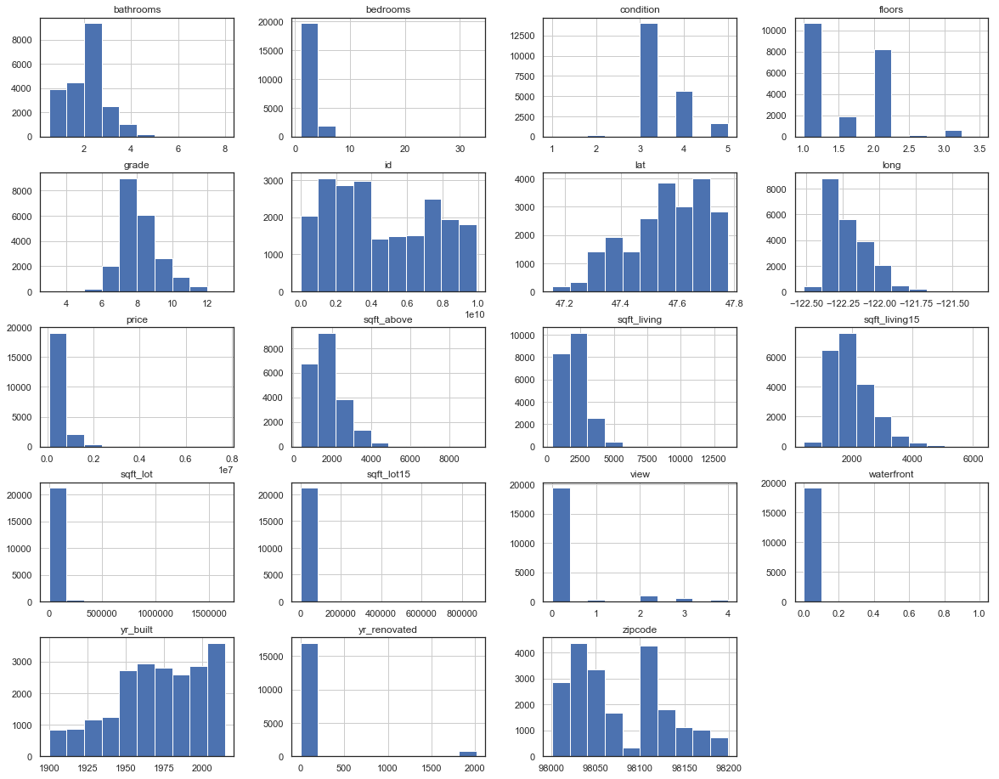

In [501]:
data.hist(figsize=(20, 16))
plt.show()

Some initial observations: Most of the table appears to have loaded as numerical features, and few features display a normal distribution. I'll explore the details further to assess the magnitude of missing & null values and to ensure that predictors have the correct data types.

___Inspect the columns in the file for type___

In [502]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


Observations: some columns will need to be converted to different data types. Specifically, "bedrooms", "bathrooms", "view", "condition", "grade", "yr_built", "floors", and "zipcode" should be converted to strings, or non-null object. "sqft_basement" should be an integer. 

___Remove columns___

Relative to __long__ and __lat__, __zipcode__ has much less unique columns. Since I believe there's considerable association between zipcode and geolocator, I will delete the __long__ and __lat__ columns

In [503]:
#corr_check = pd.DataFrame[data("zipcode","long")]
#confirm high correlation among zipcode and long/lat

In [504]:
data = data.drop(['long','lat'], 1)

I'll now take a look at the summary statistics of the dataset.

In [505]:
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,6210.000000,871200.000000


__"id"__ is interesting. I would expect each entry to have a unique identification; that does not appear to be the case. I'll investigate with __value_counts__.

In [506]:
data.id.value_counts().unique()

array([3, 2, 1])

Some of the IDs appear more than once. Let me confirm that these are not duplicates.

Digging into one of the IDs that appeared twice:

In [507]:
data.loc[data.id == 1788900230]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15
13743,1788900230,7/22/2014,86500.0,3,1.0,840,9480,1.0,0.0,0.0,3,6,840,0.0,1960,0.0,98023,840,9420
13744,1788900230,4/3/2015,199950.0,3,1.0,840,9480,1.0,0.0,0.0,3,6,840,0.0,1960,0.0,98023,840,9420


Seems like the same home with two different transactions. I won't remove ID multiples since both transactions are important pieces of information. Additionally, since ID should not be a strong independent variable, I won't focus on updating the column (i.e ID1A, ID1B) to differentiate among transactions.

This observation does highlight the importance of time period, or specically with our data, the __"date"__ predictor. As a first pass model, I will take a general approach by not accounting for timeseries. I'll therefore drop the __"date"__ column.

In [508]:
data = data.drop('date', 1)
# data.info()

Although there could be considerable variance in saleprice for the same home, keeping all values could provide more accuracy given the cyclical nature of real estate.

I'll next look into null values and decide a course of action for any present.

___Identify the total number of null values___

In [509]:
data.isna().sum()

id                  0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
sqft_living15       0
sqft_lot15          0
dtype: int64

__"waterfront"__ and __"yr_renovated"__ both have a considerable amount of null values. __"view"__ also has some null values. The rows with null values account for less than 20% percent of total rows; I'll elect to drop these rows now from the final dataset used for modeling.

___Address nulls___

In [510]:
# data.waterfront.isna().sum()

__"waterfront"__, __"view"__, and __"yr_renovated"__ are each categorical data. It could make sense for these predictors to have null values, however, these predictors also have a "0" values which indicates no renovation or waterfront. Therefore it makes sense for now to remove rows with null values.

___Drop all rows with an na value___

In [511]:
data.dropna(inplace=True)

In [512]:
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15
count,1.576200e+04,1.576200e+04,15762.000000,15762.000000,15762.000000,1.576200e+04,15762.000000,15762.000000,15762.000000,15762.000000,15762.000000,15762.000000,15762.000000,15762.000000,15762.000000,15762.000000,15762.000000
mean,4.593364e+09,5.413172e+05,3.378949,2.120797,2084.512372,1.528082e+04,1.495147,0.007613,0.229984,3.410862,7.663748,1792.775473,1971.111217,82.440236,98077.558241,1990.219579,12900.415556
std,2.876078e+09,3.722258e+05,0.935301,0.766772,918.617686,4.182288e+04,0.539352,0.086924,0.761324,0.651961,1.172238,828.403502,29.336823,397.212626,53.414906,684.142495,27977.230059
min,1.000102e+06,8.200000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,399.000000,659.000000
25%,2.125159e+09,3.210000e+05,3.000000,1.750000,1430.000000,5.048500e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1200.000000,1952.000000,0.000000,98033.000000,1490.000000,5100.000000
50%,3.905081e+09,4.500000e+05,3.000000,2.250000,1920.000000,7.602000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1570.000000,1975.000000,0.000000,98065.000000,1846.000000,7620.000000
75%,7.334501e+09,6.448750e+05,4.000000,2.500000,2550.000000,1.072000e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2220.000000,1997.000000,0.000000,98117.000000,2370.000000,10107.500000
max,9.895000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,6210.000000,871200.000000


A number of predictors should be converted to strings although they contain numbers, because they essentially represent discrete values or categories. Moreover, having these categories as integers or floats can invite the risk of unintended or invalid mathematical operations.

In [513]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15762 entries, 1 to 21596
Data columns (total 18 columns):
id               15762 non-null int64
price            15762 non-null float64
bedrooms         15762 non-null int64
bathrooms        15762 non-null float64
sqft_living      15762 non-null int64
sqft_lot         15762 non-null int64
floors           15762 non-null float64
waterfront       15762 non-null float64
view             15762 non-null float64
condition        15762 non-null int64
grade            15762 non-null int64
sqft_above       15762 non-null int64
sqft_basement    15762 non-null object
yr_built         15762 non-null int64
yr_renovated     15762 non-null float64
zipcode          15762 non-null int64
sqft_living15    15762 non-null int64
sqft_lot15       15762 non-null int64
dtypes: float64(6), int64(11), object(1)
memory usage: 2.3+ MB


___Convert predictors to appropriate data type___

In [514]:
data.bathrooms = data.bathrooms.astype("str")
data.bedrooms = data.bedrooms.astype("str")
data.view = data.view.astype("str")
data.grade = data.grade.astype("str")
data.zipcode = data.zipcode.astype("str")
data.condition = data.condition.astype("str")
data.yr_built = data.yr_built.astype("str")
data.floors = data.floors.astype("str")
data.waterfront = data.waterfront.astype("str")
data.yr_built = data.yr_built.astype("str")
data.yr_renovated = data.yr_renovated.astype("str")
# data.sqft_basement = data.sqft_basement.astype('float') # one the rows is causing an error

In [515]:
data.describe()

,id,price,sqft_living,sqft_lot,sqft_above,sqft_living15,sqft_lot15
count,1.576200e+04,1.576200e+04,15762.000000,1.576200e+04,15762.000000,15762.000000,15762.000000
mean,4.593364e+09,5.413172e+05,2084.512372,1.528082e+04,1792.775473,1990.219579,12900.415556
std,2.876078e+09,3.722258e+05,918.617686,4.182288e+04,828.403502,684.142495,27977.230059
min,1.000102e+06,8.200000e+04,370.000000,5.200000e+02,370.000000,399.000000,659.000000
25%,2.125159e+09,3.210000e+05,1430.000000,5.048500e+03,1200.000000,1490.000000,5100.000000
50%,3.905081e+09,4.500000e+05,1920.000000,7.602000e+03,1570.000000,1846.000000,7620.000000
75%,7.334501e+09,6.448750e+05,2550.000000,1.072000e+04,2220.000000,2370.000000,10107.500000
max,9.895000e+09,7.700000e+06,13540.000000,1.651359e+06,9410.000000,6210.000000,871200.000000


I encountered an issue converting "sqft_basement" into a float. After additional inspection of the error note, I notice non-numerical values that can't be converted.
Performing value_counts indicates that there are 333 occurances of "?", likely due to missing values, since there are also many occurences of "0" (or no basement in the home). My initial thought is to eliminate these rows given the relatively small percentage of rows but I'd like to compare the descriptive summary of this set to the overall descriptive summary to get a scope of any impact of removing these rows.

In [516]:
data_check = data.loc[data.sqft_basement == "?"]

In [517]:
data_check.describe()

,id,price,sqft_living,sqft_lot,sqft_above,sqft_living15,sqft_lot15
count,3.330000e+02,3.330000e+02,333.000000,333.000000,333.000000,333.000000,333.000000
mean,4.572013e+09,5.329491e+05,2037.984985,15033.468468,1749.696697,1957.447447,14667.309309
std,2.939445e+09,3.336573e+05,874.419375,32782.904155,792.296704,653.278512,35830.008005
min,1.120040e+07,1.025000e+05,600.000000,681.000000,600.000000,740.000000,977.000000
25%,2.025049e+09,3.250000e+05,1420.000000,5000.000000,1160.000000,1490.000000,5000.000000
50%,3.879901e+09,4.790000e+05,1860.000000,7100.000000,1580.000000,1800.000000,7194.000000
75%,7.454001e+09,6.500000e+05,2570.000000,10757.000000,2180.000000,2350.000000,10044.000000
max,9.834200e+09,3.420000e+06,6930.000000,266587.000000,5450.000000,4080.000000,438213.000000


The two tables look consistent. If possible a joint plot with the two sets could be helpful to make a more accurate determination, visually. I'll move forward with removing these rows and completing the conversion of __sqft_basment__ to a float.

In [518]:
data = data.drop(data[data['sqft_basement']=="?"].index)

In [519]:
data.sqft_basement = data.sqft_basement.astype("float")
# data.describe()

___Decide Which Columns to Keep___

We learned that multicolinearity can be an issue with regression models. I would like to explore the relationships among predictors, noting high correlation between particular predictors, and then deciding which columns to drop before the modeling step.

A heatmap can help to help quickly identify problematic predictors.

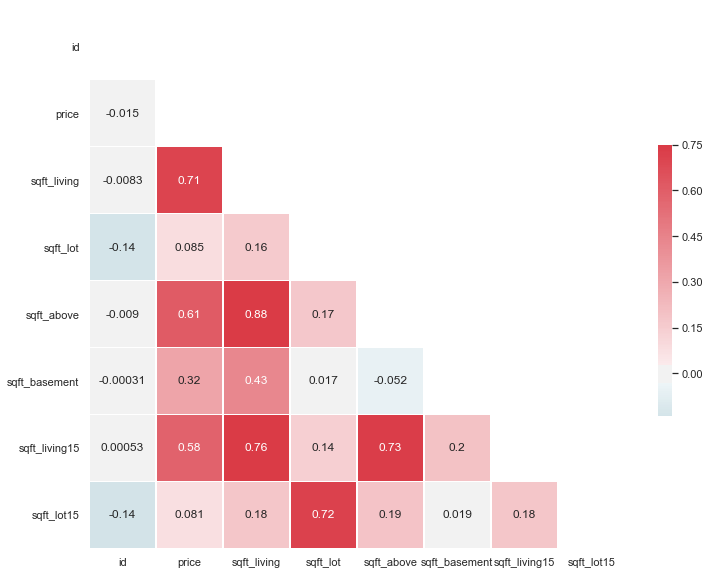

In [520]:
sns.set(style="white")
corr = data.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f,ax = plt.subplots(figsize=(12,10))
cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr, annot=True, mask=mask, cmap=cmap, vmax=.75, center=0, square=True, linewidth=.5, cbar_kws={"shrink": .5})

The shades of red indicate some strong association between predictors. I'll use correlation of .75 as a threshold for which predictors to remove if it appears more than once for a particular predictor.

Using this guideline, I'll remove __"sqft_living"__ given its high association with __"sqft_living15"__ and __"sqft_above"__.

In [521]:
data.drop(columns="sqft_living", inplace=True)

In [522]:
data.shape

(15429, 17)

___Check for Normality___

A key assumption in our model is that the sample of data used is normally distributed-- represents the distribution that one would find in the general population. This assumption is applied to the distribution of our predictor variables. Yet, this extension of the assumption of normal distribution is not always true for specific predictors. 

As noted earlier, many columns don't appear to be normally distributed. 

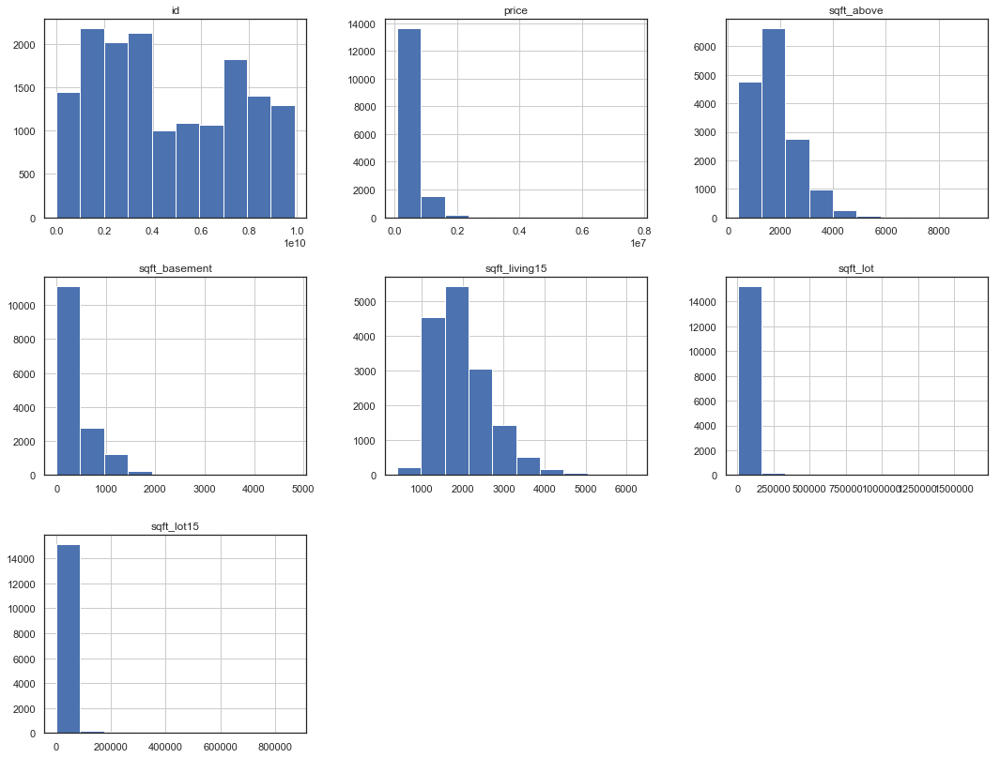

In [523]:
data.hist(figsize=(18,14));

Only ___sqft_living15__ and ___sqft_above__ come close to a normal distribution.

Upon observation, most of the distributions display skewness. __"id"__ has a bimodal distribution likely due to the resales of homes in 2015.

I'll check for negative values

In [524]:
data.describe()

,id,price,sqft_lot,sqft_above,sqft_basement,sqft_living15,sqft_lot15
count,1.542900e+04,1.542900e+04,1.542900e+04,15429.000000,15429.000000,15429.000000,15429.000000
mean,4.593825e+09,5.414978e+05,1.528616e+04,1793.705230,291.811329,1990.926891,12862.281159
std,2.874791e+09,3.730219e+05,4.199737e+04,829.165362,443.366153,684.796238,27783.533647
min,1.000102e+06,8.200000e+04,5.200000e+02,370.000000,0.000000,399.000000,659.000000
25%,2.126049e+09,3.200000e+05,5.050000e+03,1200.000000,0.000000,1490.000000,5100.000000
50%,3.905082e+09,4.500000e+05,7.620000e+03,1570.000000,0.000000,1850.000000,7626.000000
75%,7.334501e+09,6.435000e+05,1.072000e+04,2220.000000,560.000000,2370.000000,10108.000000
max,9.895000e+09,7.700000e+06,1.651359e+06,9410.000000,4820.000000,6210.000000,871200.000000


I'll add a marginal constant to each value in ___sqft_basement___ to avoid previous log(0) error.

In [525]:
data.sqft_basement = data.sqft_basement + 0.1

In [526]:
data.describe()

,id,price,sqft_lot,sqft_above,sqft_basement,sqft_living15,sqft_lot15
count,1.542900e+04,1.542900e+04,1.542900e+04,15429.000000,15429.000000,15429.000000,15429.000000
mean,4.593825e+09,5.414978e+05,1.528616e+04,1793.705230,291.911329,1990.926891,12862.281159
std,2.874791e+09,3.730219e+05,4.199737e+04,829.165362,443.366153,684.796238,27783.533647
min,1.000102e+06,8.200000e+04,5.200000e+02,370.000000,0.100000,399.000000,659.000000
25%,2.126049e+09,3.200000e+05,5.050000e+03,1200.000000,0.100000,1490.000000,5100.000000
50%,3.905082e+09,4.500000e+05,7.620000e+03,1570.000000,0.100000,1850.000000,7626.000000
75%,7.334501e+09,6.435000e+05,1.072000e+04,2220.000000,560.100000,2370.000000,10108.000000
max,9.895000e+09,7.700000e+06,1.651359e+06,9410.000000,4820.100000,6210.000000,871200.000000


In [527]:
data_log = pd.DataFrame([])
data_log["logprice"] = np.log(data["price"])
data_log["logsqft_above"] = np.log(data["sqft_above"])
data_log["logsqft_lot15"] = np.log(data["sqft_lot15"])
data_log["logsqft_living15"] = np.log(data["sqft_living15"])
data_log["logsqft_lot"] = np.log(data["sqft_lot"])
data_log["logsqft_basement"] = np.log(data["sqft_basement"])
data_log["logsqft_lot15"] = np.log(data["sqft_lot15"])

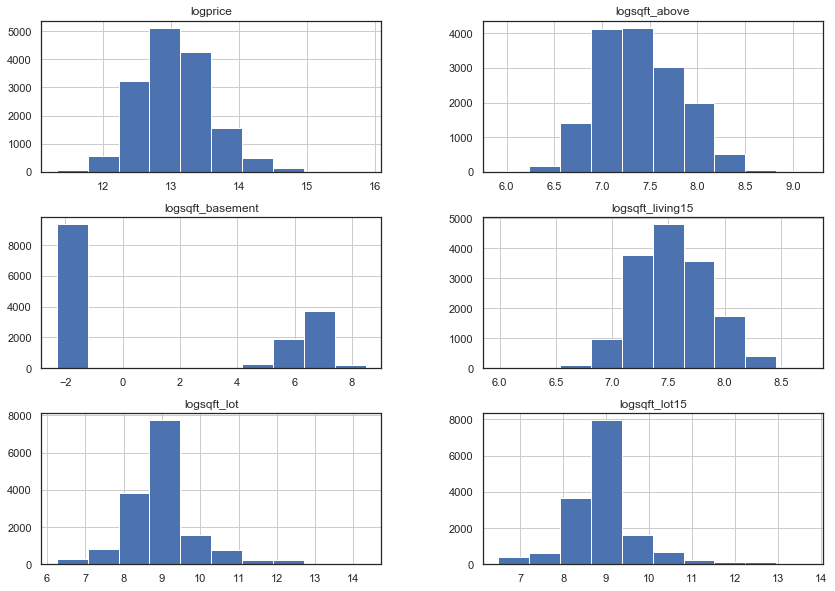

In [528]:
data_log.hist(figsize = [14,10]);

Next, I'll scale these continuous predictors and the target feature.

In [529]:
data_log.logsqft_above = (data_log.logsqft_above - data_log.logsqft_above.mean()) / data_log.logsqft_above.std()
data_log.logsqft_lot15 = (data_log.logsqft_lot15 - data_log.logsqft_lot15.mean()) / data_log.logsqft_lot15.std()
data_log.logsqft_lot = (data_log.logsqft_lot - data_log.logsqft_lot.mean()) / data_log.logsqft_lot.std()
data_log.logsqft_basement = (data_log.logsqft_basement - data_log.logsqft_basement.mean()) / data_log.logsqft_basement.std()
data_log.logsqft_living15 = (data_log.logsqft_living15 - data_log.logsqft_living15.mean()) / data_log.logsqft_living15.std()
data_log.logprice = (data_log.logprice - data_log.logprice.mean()) / data_log.logprice.std()

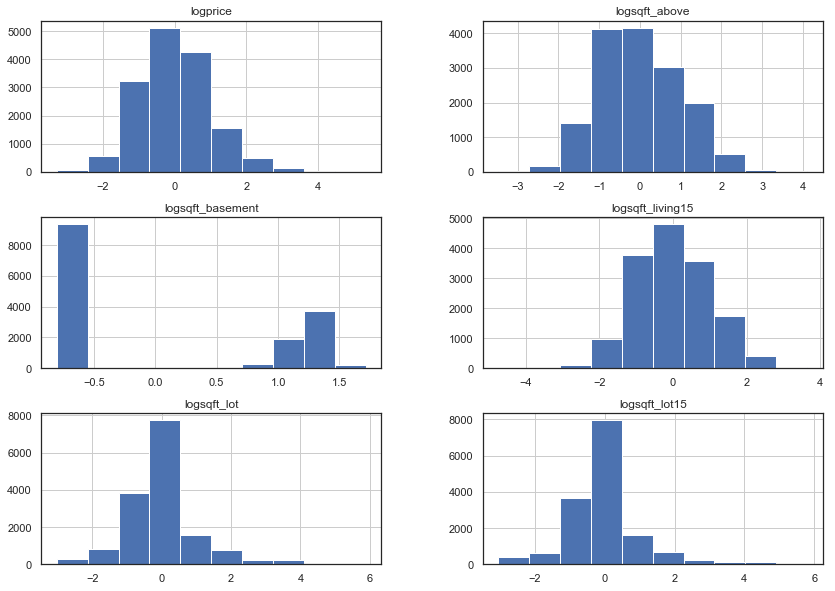

In [530]:
data_log.hist(figsize=(14,10));

Next, I'll work on processing the categorical features through one-hot encoding.

___One-Hot Encoding___

In [531]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15429 entries, 1 to 21596
Data columns (total 17 columns):
id               15429 non-null int64
price            15429 non-null float64
bedrooms         15429 non-null object
bathrooms        15429 non-null object
sqft_lot         15429 non-null int64
floors           15429 non-null object
waterfront       15429 non-null object
view             15429 non-null object
condition        15429 non-null object
grade            15429 non-null object
sqft_above       15429 non-null int64
sqft_basement    15429 non-null float64
yr_built         15429 non-null object
yr_renovated     15429 non-null object
zipcode          15429 non-null object
sqft_living15    15429 non-null int64
sqft_lot15       15429 non-null int64
dtypes: float64(2), int64(5), object(10)
memory usage: 2.1+ MB


In [532]:
cat_list = ['bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 'condition', 'grade', 'yr_built', 'yr_renovated', 'zipcode']
data_cat = data[cat_list].copy()
data_cat.head()

,bedrooms,bathrooms,floors,waterfront,view,condition,grade,yr_built,yr_renovated,zipcode
1,3,2.25,2.0,0.0,0.0,3,7,1951,1991.0,98125
3,4,3.0,1.0,0.0,0.0,5,7,1965,0.0,98136
4,3,2.0,1.0,0.0,0.0,3,8,1987,0.0,98074
5,4,4.5,1.0,0.0,0.0,3,11,2001,0.0,98053
8,3,1.0,1.0,0.0,0.0,3,7,1960,0.0,98146


In [533]:
data_cat_one_hot = pd.get_dummies(data_cat)

In [534]:
data_cat_one_hot.shape

(15429, 323)

In [535]:
data_cat_one_hot.describe()

,bedrooms_1,bedrooms_10,bedrooms_11,bedrooms_2,bedrooms_3,bedrooms_33,bedrooms_4,bedrooms_5,bedrooms_6,bedrooms_7,...,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
count,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,...,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000
mean,0.008944,0.000194,0.000065,0.126450,0.452330,0.000065,0.322898,0.074665,0.011926,0.001426,...,0.013416,0.002657,0.019768,0.011731,0.012120,0.011990,0.012120,0.006157,0.012898,0.014194
std,0.094153,0.013943,0.008051,0.332367,0.497739,0.008051,0.467599,0.262858,0.108555,0.037735,...,0.115053,0.051482,0.139207,0.107677,0.109425,0.108846,0.109425,0.078229,0.112837,0.118294
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Clearly, some bins are needed to make the data set more manageable. I'll start by creating bins for __year_built__, __year_renovated__, and __zipcode__ to categorize the records in most to less-recently built & renovated.

___Convert columns to integers for binning___

In [536]:
data.yr_built = data.yr_built.astype('int')
data.zipcode = data.zipcode.astype('int')

In [537]:
data.yr_renovated = data.yr_renovated.astype('float')
# data.yr_renovated # need to convert to int
data['yr_renovated_upd'] = [round(year) for year in data.yr_renovated]

In [538]:
data.tail()

,id,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,yr_renovated_upd
21591,2997800021,475000.0,3,2.5,1294,2.0,0.0,0.0,3,8,1180,130.1,2008,0.0,98116,1330,1265,0
21592,263000018,360000.0,3,2.5,1131,3.0,0.0,0.0,3,8,1530,0.1,2009,0.0,98103,1530,1509,0
21593,6600060120,400000.0,4,2.5,5813,2.0,0.0,0.0,3,8,2310,0.1,2014,0.0,98146,1830,7200,0
21594,1523300141,402101.0,2,0.75,1350,2.0,0.0,0.0,3,7,1020,0.1,2009,0.0,98144,1020,2007,0
21596,1523300157,325000.0,2,0.75,1076,2.0,0.0,0.0,3,7,1020,0.1,2008,0.0,98144,1020,1357,0


In [539]:
#check for # of distinct values in columns in question

In [540]:
print(data['yr_built'].nunique())
print(data.yr_renovated_upd.nunique())
# data.yr_renovated.get_values()

116
69


___Create bins___

In [541]:
bins = [1900, 1910, 1920, 1930, 1940, 1950, 1960, 1970, 1980, 1990, 2000, 2010, 2020, 2040]
data['Built_binned'] = pd.cut(data['yr_built'], bins=bins, include_lowest=True)
data['yr_renovated_upd_binned'] = pd.cut(data['yr_renovated_upd'], bins=bins, include_lowest=True)

In [542]:
data.isna().sum()

id                             0
price                          0
bedrooms                       0
bathrooms                      0
sqft_lot                       0
floors                         0
waterfront                     0
view                           0
condition                      0
grade                          0
sqft_above                     0
sqft_basement                  0
yr_built                       0
yr_renovated                   0
zipcode                        0
sqft_living15                  0
sqft_lot15                     0
yr_renovated_upd               0
Built_binned                   0
yr_renovated_upd_binned    14797
dtype: int64

In [543]:
zip_bins = [98000, 98050, 98100, 98150, 98200]
data['zipcode'] = pd.cut(data['zipcode'], bins=zip_bins, include_lowest=True)

In [544]:
data.head(10)

,id,price,bedrooms,bathrooms,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,yr_renovated_upd,Built_binned,yr_renovated_upd_binned
1,6414100192,538000.0,3,2.25,7242,2.0,0.0,0.0,3,7,2170,400.1,1951,1991.0,"(98100.0, 98150.0]",1690,7639,1991,"(1950.0, 1960.0]","(1990.0, 2000.0]"
3,2487200875,604000.0,4,3.0,5000,1.0,0.0,0.0,5,7,1050,910.1,1965,0.0,"(98100.0, 98150.0]",1360,5000,0,"(1960.0, 1970.0]",NaN
4,1954400510,510000.0,3,2.0,8080,1.0,0.0,0.0,3,8,1680,0.1,1987,0.0,"(98050.0, 98100.0]",1800,7503,0,"(1980.0, 1990.0]",NaN
5,7237550310,1230000.0,4,4.5,101930,1.0,0.0,0.0,3,11,3890,1530.1,2001,0.0,"(98050.0, 98100.0]",4760,101930,0,"(2000.0, 2010.0]",NaN
8,2414600126,229500.0,3,1.0,7470,1.0,0.0,0.0,3,7,1050,730.1,1960,0.0,"(98100.0, 98150.0]",1780,8113,0,"(1950.0, 1960.0]",NaN
9,3793500160,323000.0,3,2.5,6560,2.0,0.0,0.0,3,7,1890,0.1,2003,0.0,"(97999.999, 98050.0]",2390,7570,0,"(2000.0, 2010.0]",NaN
11,9212900260,468000.0,2,1.0,6000,1.0,0.0,0.0,4,7,860,300.1,1942,0.0,"(98100.0, 98150.0]",1330,6000,0,"(1940.0, 1950.0]",NaN
13,6054650070,400000.0,3,1.75,9680,1.0,0.0,0.0,4,7,1370,0.1,1977,0.0,"(98050.0, 98100.0]",1370,10208,0,"(1970.0, 1980.0]",NaN
14,1175000570,530000.0,5,2.0,4850,1.5,0.0,0.0,3,7,1810,0.1,1900,0.0,"(98100.0, 98150.0]",1360,4850,0,"(1899.999, 1910.0]",NaN
15,9297300055,650000.0,4,3.0,5000,2.0,0.0,3.0,3,9,1980,970.1,1979,0.0,"(98100.0, 98150.0]",2140,4000,0,"(1970.0, 1980.0]",NaN


In [545]:
# data.drop(columns=["yr_built", "yr_renovated", "zipcode"], inplace=True)

___Create categorical dataframe___

In [546]:
cat_list_upd = ['bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 'condition', 'grade', 'Built_binned', 'yr_renovated_upd_binned', 'zipcode']
data_cat_upd = data[cat_list_upd].copy()

In [547]:
data_cat_upd_one_hot = pd.get_dummies(data_cat_upd)

In [548]:
# data_cat_upd_one_hot.info()

___Combine data numerical and categorical dataframes___

In [549]:
df_final = pd.concat([data_log, data_cat_upd_one_hot], 1)

In [550]:
df_final.head()

,logprice,logsqft_above,logsqft_lot15,logsqft_living15,logsqft_lot,logsqft_basement,bedrooms_1,bedrooms_10,bedrooms_11,bedrooms_2,...,"yr_renovated_upd_binned_(1970.0, 1980.0]","yr_renovated_upd_binned_(1980.0, 1990.0]","yr_renovated_upd_binned_(1990.0, 2000.0]","yr_renovated_upd_binned_(2000.0, 2010.0]","yr_renovated_upd_binned_(2010.0, 2020.0]","yr_renovated_upd_binned_(2020.0, 2040.0]","zipcode_(97999.999, 98050.0]","zipcode_(98050.0, 98100.0]","zipcode_(98100.0, 98150.0]","zipcode_(98150.0, 98200.0]"
1,0.277341,0.665971,-0.031844,-0.334610,-0.120208,1.132452,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
3,0.497083,-1.034181,-0.553124,-0.999040,-0.529324,1.324080,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0.175844,0.066572,-0.053938,-0.141749,0.000712,-0.801530,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
5,1.847631,2.032961,3.154931,2.832478,2.800118,1.445220,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,-1.340509,-1.034181,0.042199,-0.175922,-0.085976,1.272696,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


## Explore data

Now that I have a processed dataset for modeling, I'd like to understand the housing data better. 

___Plot boxplots for numerical features___

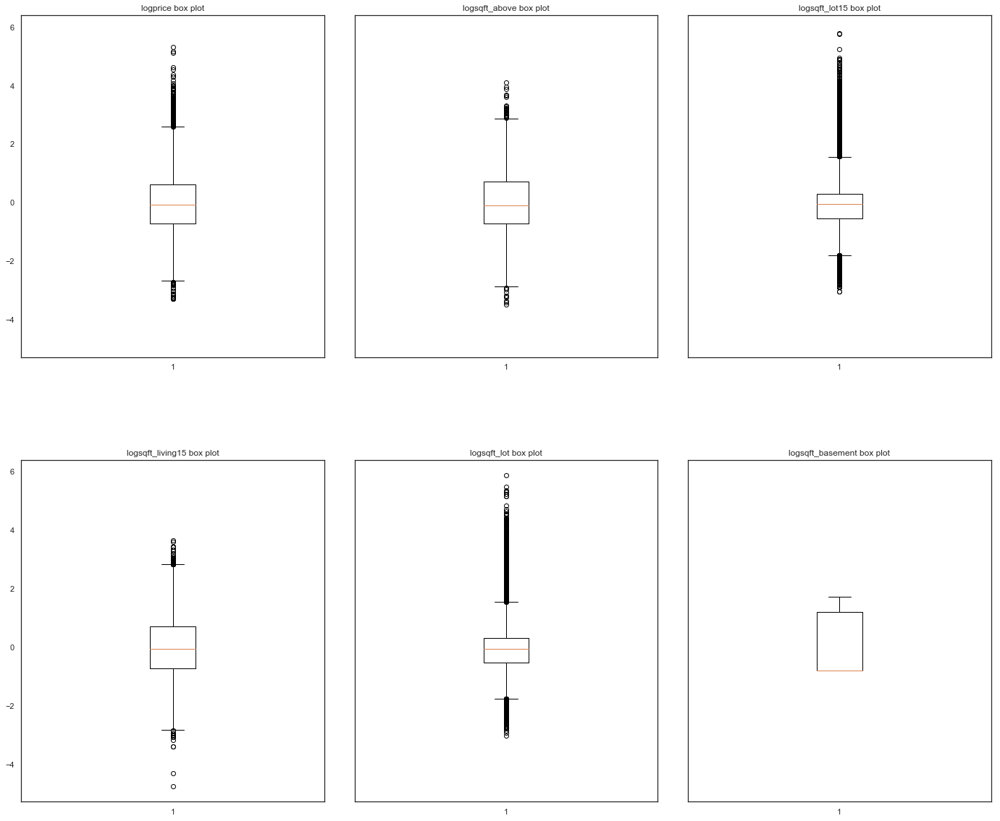

In [551]:
fig, axs = plt.subplots(2, 3, figsize=(24, 20), sharey=True)
fig.subplots_adjust(hspace=0.3, wspace=.1)

axs = axs.ravel()
for i, col in enumerate(data_log.columns):
    axs[i].boxplot(data_log[col])
    axs[i].set_title(str(col) + " box plot")
#   increase font size
#   improve look

Many of the numerical features have numerous outliers. Not suprising for homes.

I'll next view the correlation of each feature through scatterplots.

___Plot scatterplots for each feature against target variable: price___

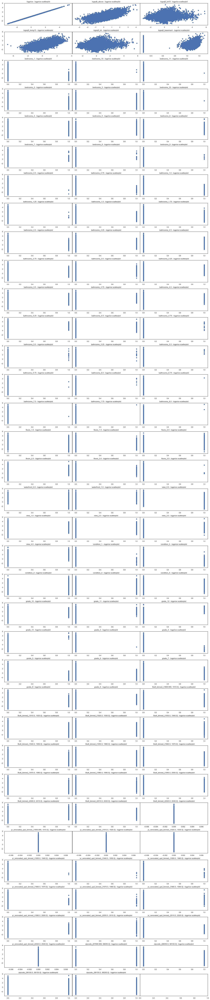

In [552]:
cols = 3
rows = math.ceil(len(df_final.columns) / cols)
fig, axs = plt.subplots(rows, cols, sharey=True, figsize=(24, 120))
fig.subplots_adjust(hspace=0.3, wspace=.001)

axs = axs.ravel()

for i, col in enumerate(df_final.columns):
    axs[i].scatter(df_final[col], df_final['logprice'])
    axs[i].set_title(str(col)+ ' - logprice scatterplot')


## Modeling

I'll now run a simple regression for each feature with the target, __logprice__.

In [553]:
df_final.describe()

,logprice,logsqft_above,logsqft_lot15,logsqft_living15,logsqft_lot,logsqft_basement,bedrooms_1,bedrooms_10,bedrooms_11,bedrooms_2,...,"yr_renovated_upd_binned_(1970.0, 1980.0]","yr_renovated_upd_binned_(1980.0, 1990.0]","yr_renovated_upd_binned_(1990.0, 2000.0]","yr_renovated_upd_binned_(2000.0, 2010.0]","yr_renovated_upd_binned_(2010.0, 2020.0]","yr_renovated_upd_binned_(2020.0, 2040.0]","zipcode_(97999.999, 98050.0]","zipcode_(98050.0, 98100.0]","zipcode_(98100.0, 98150.0]","zipcode_(98150.0, 98200.0]"
count,1.542900e+04,1.542900e+04,1.542900e+04,1.542900e+04,1.542900e+04,1.542900e+04,15429.000000,15429.000000,15429.000000,15429.000000,...,15429.000000,15429.000000,15429.000000,15429.000000,15429.000000,15429.0,15429.000000,15429.000000,15429.000000,15429.000000
mean,1.713120e-13,9.127802e-14,1.904020e-14,-2.765059e-14,8.546983e-15,-4.111804e-15,0.008944,0.000194,0.000065,0.126450,...,0.002398,0.007518,0.008166,0.011861,0.007583,0.0,0.375073,0.214013,0.309936,0.100979
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.094153,0.013943,0.008051,0.332367,...,0.048913,0.086384,0.090002,0.108263,0.086753,0.0,0.484157,0.410149,0.462482,0.301310
min,-3.294912e+00,-3.476998e+00,-3.045541e+00,-4.749557e+00,-3.028866e+00,-8.015298e-01,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
25%,-7.092528e-01,-7.214492e-01,-5.287679e-01,-7.198293e-01,-5.183353e-01,-8.015298e-01,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
50%,-6.183875e-02,-9.202433e-02,-3.393850e-02,-5.795073e-02,-6.401963e-02,-8.015298e-01,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
75%,6.173792e-01,7.193221e-01,3.126114e-01,6.996416e-01,3.129328e-01,1.210890e+00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,0.000000,1.000000,0.000000
max,5.330758e+00,4.101808e+00,5.793853e+00,3.645762e+00,5.875802e+00,1.712773e+00,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


King City Real Estate: logprice~logsqft_above
------------------------------------------------------------------------------------------------------


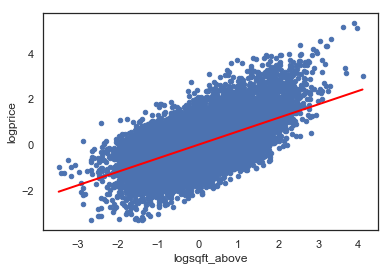

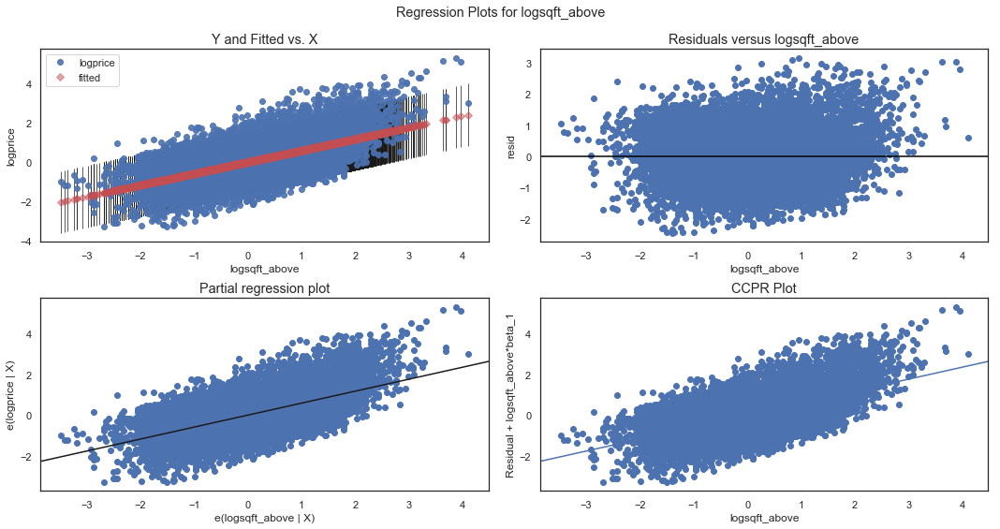

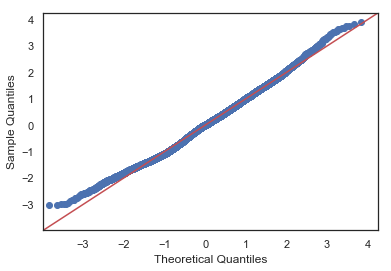

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['logsqft_above', 0.3478394304295107, 1.1644504804841915e-13, 0.5897791369907169, 0.0]
King City Real Estate: logprice~logsqft_lot15
------------------------------------------------------------------------------------------------------


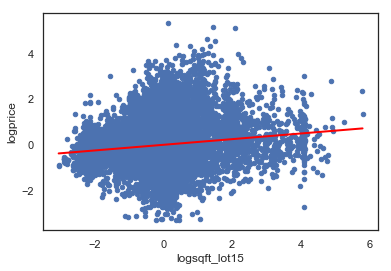

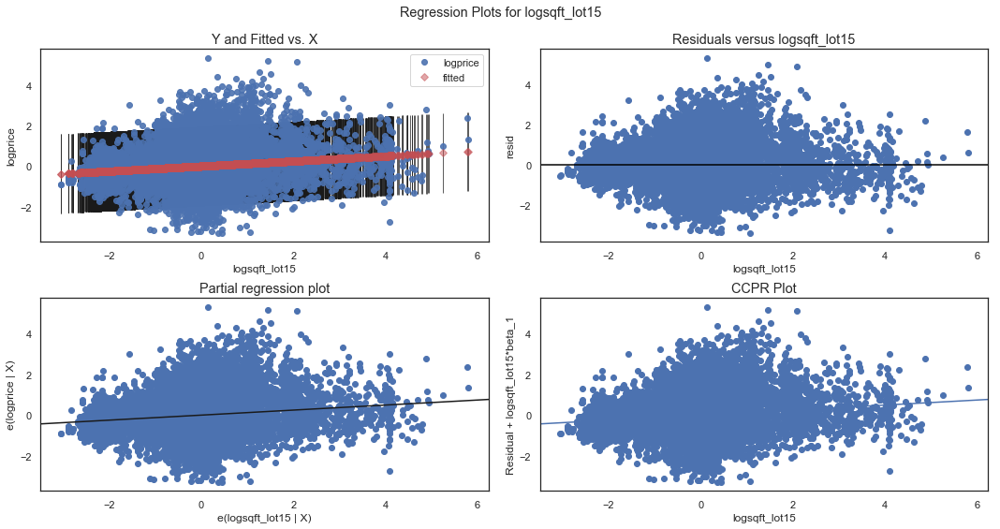

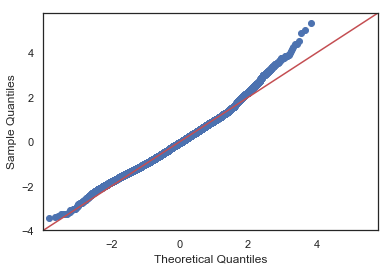

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['logsqft_lot15', 0.015330815061564529, 1.6853185513809876e-13, 0.12381766861625566, 9.0847182683504e-54]
King City Real Estate: logprice~logsqft_living15
------------------------------------------------------------------------------------------------------


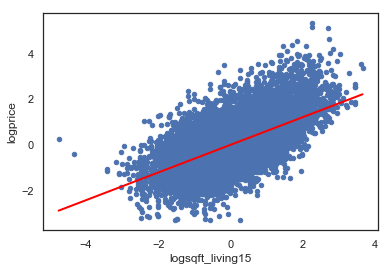

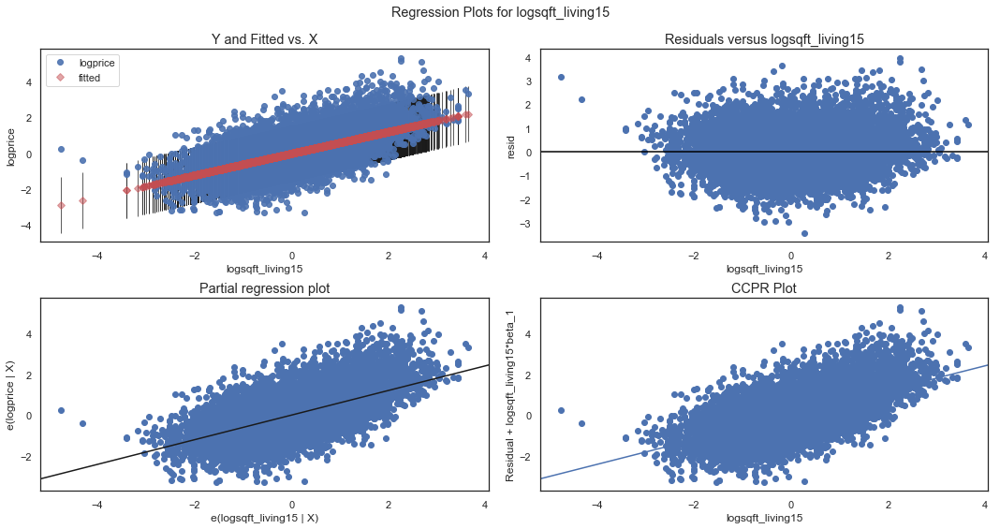

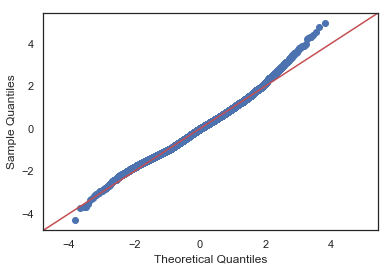

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['logsqft_living15', 0.36761354741896535, 1.8755483277566043e-13, 0.6063114277489473, 0.0]
King City Real Estate: logprice~logsqft_lot
------------------------------------------------------------------------------------------------------


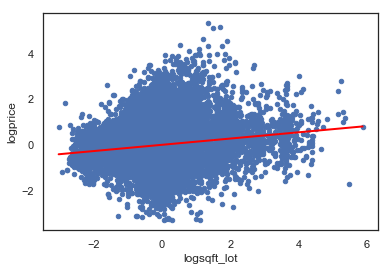

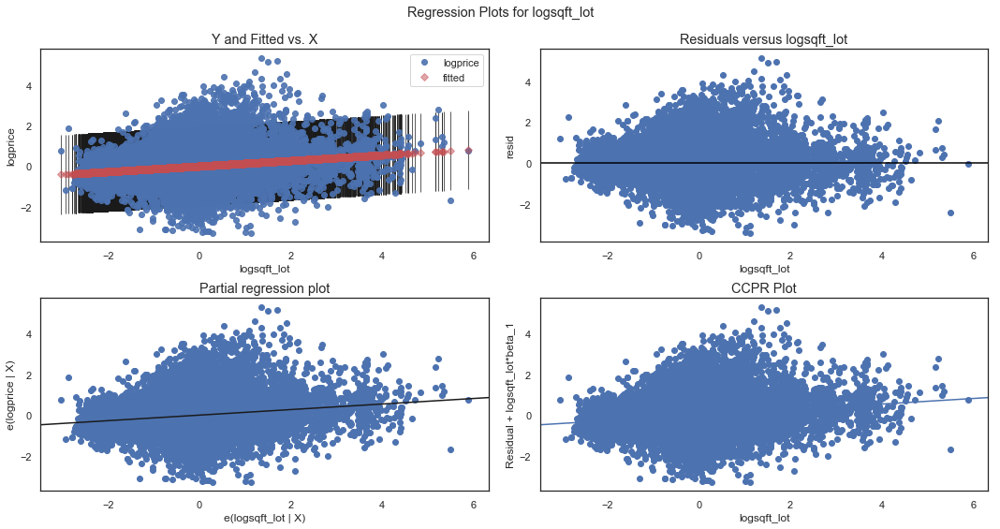

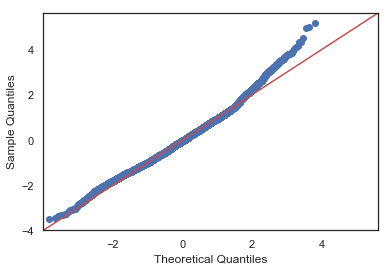

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['logsqft_lot', 0.018672562551321437, 1.697253448895708e-13, 0.13664758523779988, 3.36947758338048e-65]
King City Real Estate: logprice~logsqft_basement
------------------------------------------------------------------------------------------------------


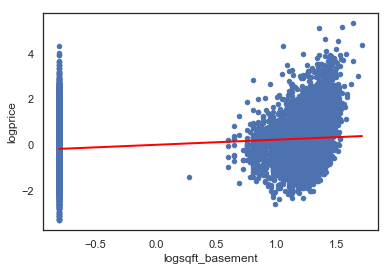

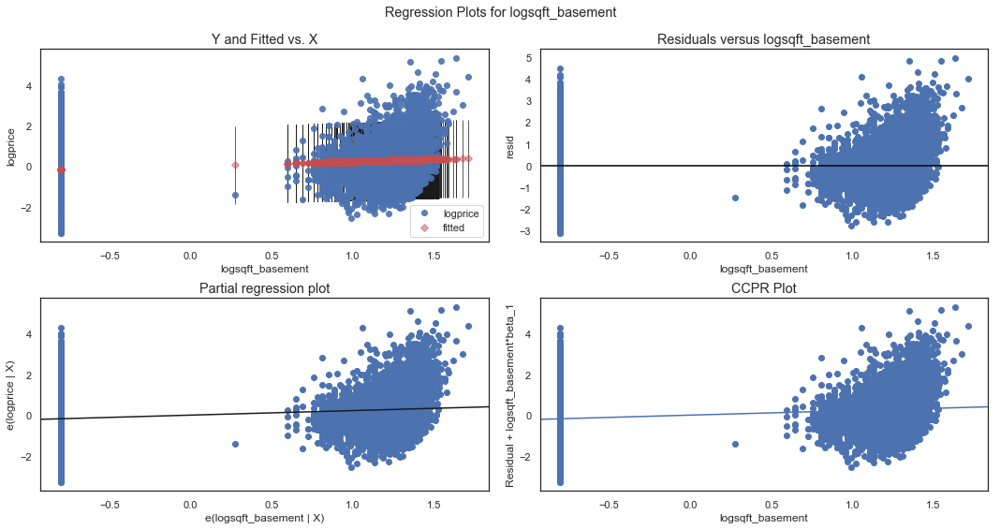

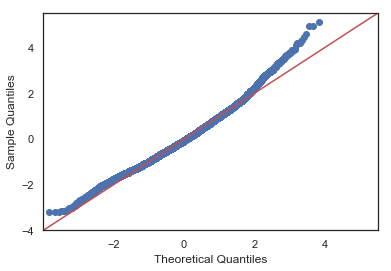

['logsqft_basement', 0.049634091521159385, 1.7090148740628308e-13, 0.2227870990904873, 8.325838653271109e-173]


In [554]:
results = [['ind_var', 'r_squared', 'intercept', 'slope', 'normality(JB)']]
for idx, val in enumerate(['logsqft_above', 'logsqft_lot15', 'logsqft_living15', 'logsqft_lot', 'logsqft_basement']):
    print ("King City Real Estate: logprice~" + val)
    print ("------------------------------------------------------------------------------------------------------")
    
    f = "logprice~" + val
    model = smf.ols(formula=f, data=data_log).fit()
    X_new = pd.DataFrame({val: [data_log[val].min(), data_log[val].max()]})
    preds = model.predict(X_new)
    data_log.plot(kind='scatter', x=val, y='logprice');
    plt.plot(X_new, preds, c='red', linewidth=2);
    plt.show()
    fig = plt.figure(figsize=(15,8))
    fig = sm.graphics.plot_regress_exog(model, val, fig=fig)
    fig = sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True,)
    plt.show()
    
    results.append([val, model.rsquared, model.params[0], model.params[1], model.pvalues[1]])
    print(results[idx + 1])

Only __logsqft_above__ and __logsqft_living15__ show considerable positive relationship although not strong linear relationship with the target variable; None of the numerical features clearly exhibit heteroskedasticity.

I'll also run simple regressions for the categotical features.

In [555]:
data_cat_reg = pd.concat([data_cat_upd_one_hot, data_log['logprice']], 1)
data_cat_reg.head()

,bedrooms_1,bedrooms_10,bedrooms_11,bedrooms_2,bedrooms_3,bedrooms_33,bedrooms_4,bedrooms_5,bedrooms_6,bedrooms_7,...,"yr_renovated_upd_binned_(1980.0, 1990.0]","yr_renovated_upd_binned_(1990.0, 2000.0]","yr_renovated_upd_binned_(2000.0, 2010.0]","yr_renovated_upd_binned_(2010.0, 2020.0]","yr_renovated_upd_binned_(2020.0, 2040.0]","zipcode_(97999.999, 98050.0]","zipcode_(98050.0, 98100.0]","zipcode_(98100.0, 98150.0]","zipcode_(98150.0, 98200.0]",logprice
1,0,0,0,0,1,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0.277341
3,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0.497083
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0.175844
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,1.847631
8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,-1.340509


In [556]:
def clean(text):
    for ch in ['(', ')', '[', ']', '.', ',', " "]:
        if ch in text:
            text = text.replace(ch,"_")
    return text

In [601]:
#update column names to remove "."
for col in data_cat_reg.columns:
    upd_col = clean(col)
    data_cat_reg.rename(columns = {col : upd_col}, inplace=True)
# print(len(data_cat_reg.columns))
# len(data_cat_reg.describe().columns)

99


99

King City Real Estate: logprice~bedrooms_1
----------------------------------------------


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


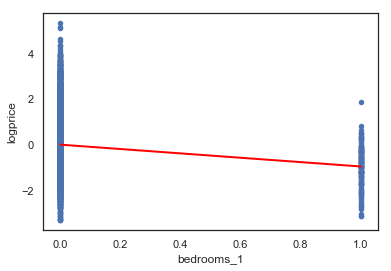

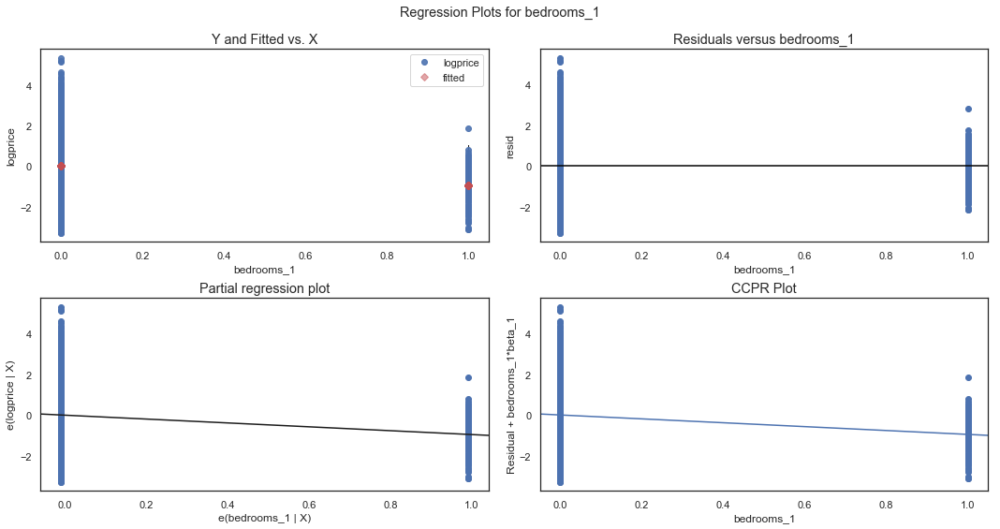

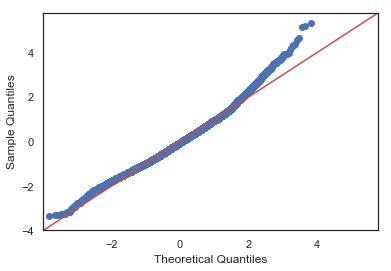

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bedrooms_1', 0.008083099210595579, 0.00854075923596228, -0.9548940162972844, 4.600077342084625e-29]
King City Real Estate: logprice~bedrooms_10
----------------------------------------------


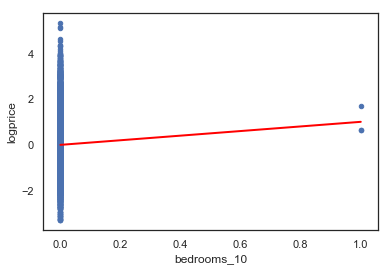

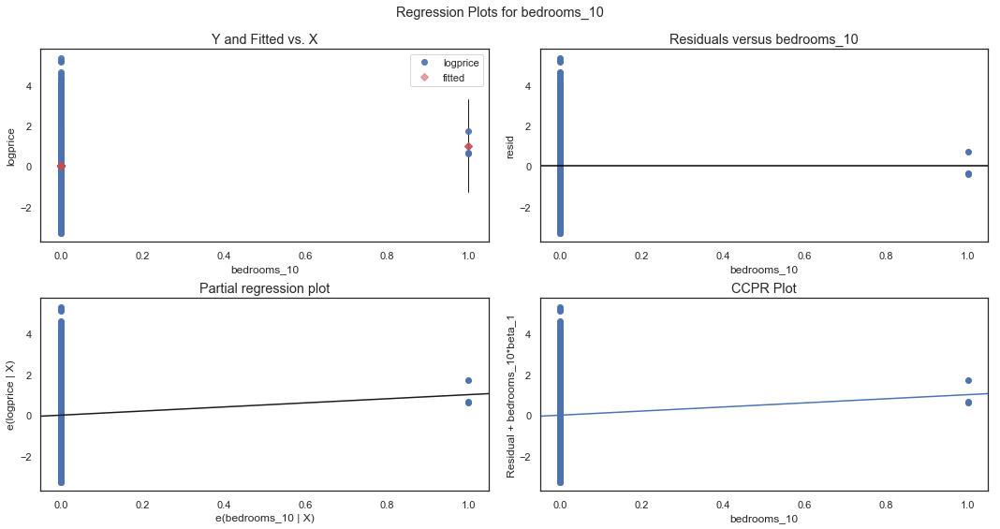

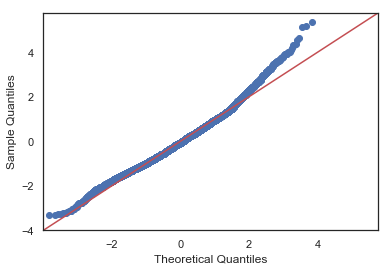

['bedrooms_10', 0.00019733177655034684, -0.00019589276755045334, 1.007476504390963, 0.0810140999617643]
King City Real Estate: logprice~bedrooms_11
----------------------------------------------


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


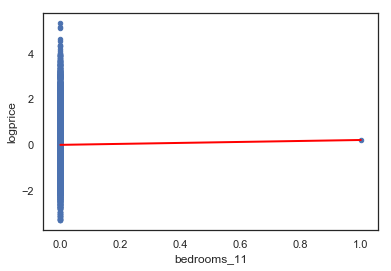

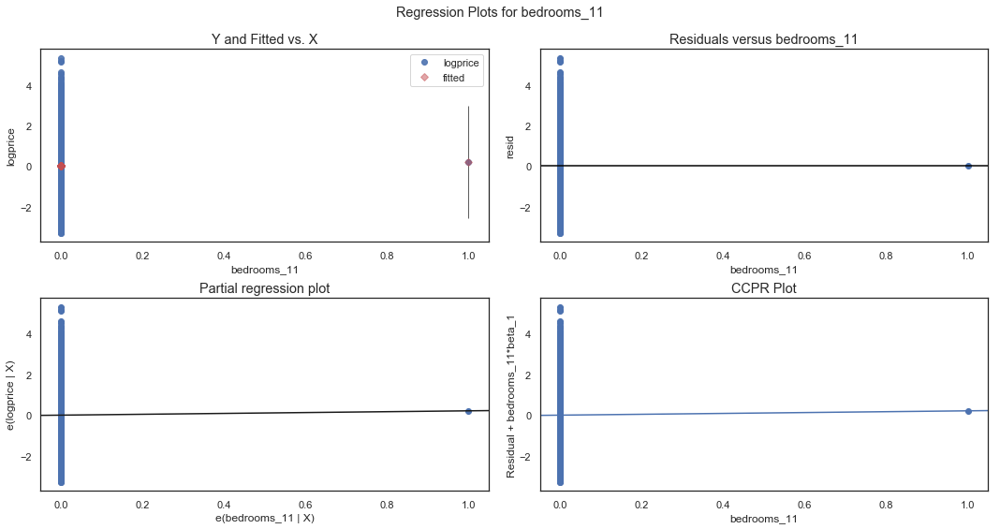

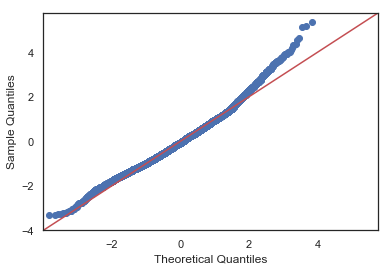

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bedrooms_11', 2.933118480874519e-06, -1.378782962560901e-05, 0.2127324259303614, 0.8315489959369347]
King City Real Estate: logprice~bedrooms_2
----------------------------------------------


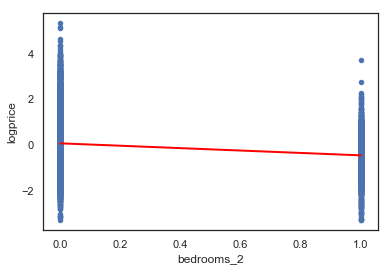

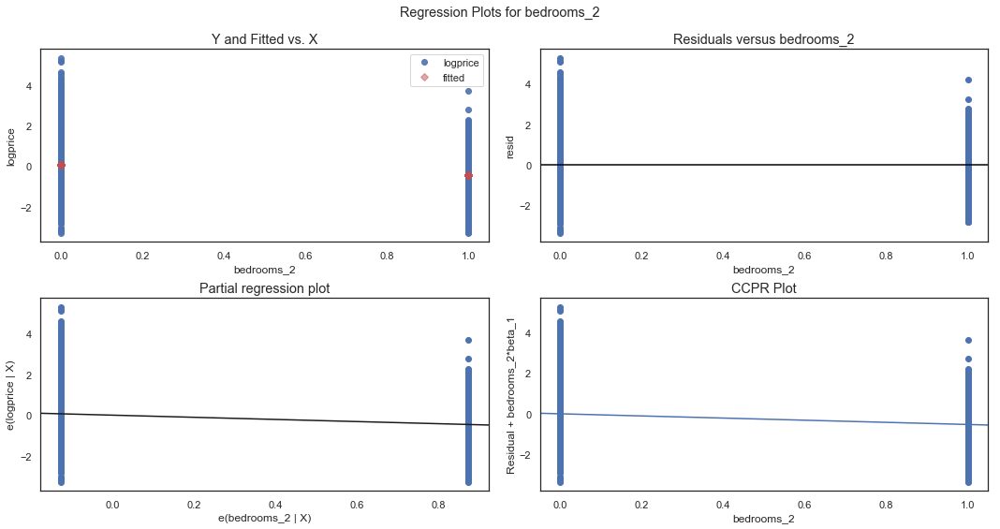

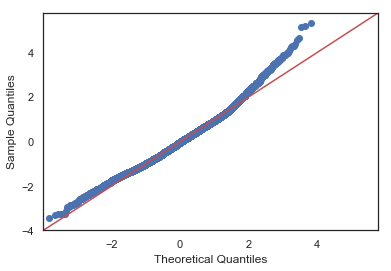

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bedrooms_2', 0.03050308539736002, 0.06644674628022232, -0.5254776260148197, 6.174873240802106e-106]
King City Real Estate: logprice~bedrooms_3
----------------------------------------------


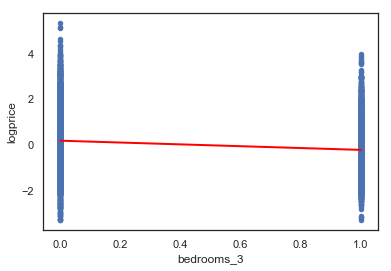

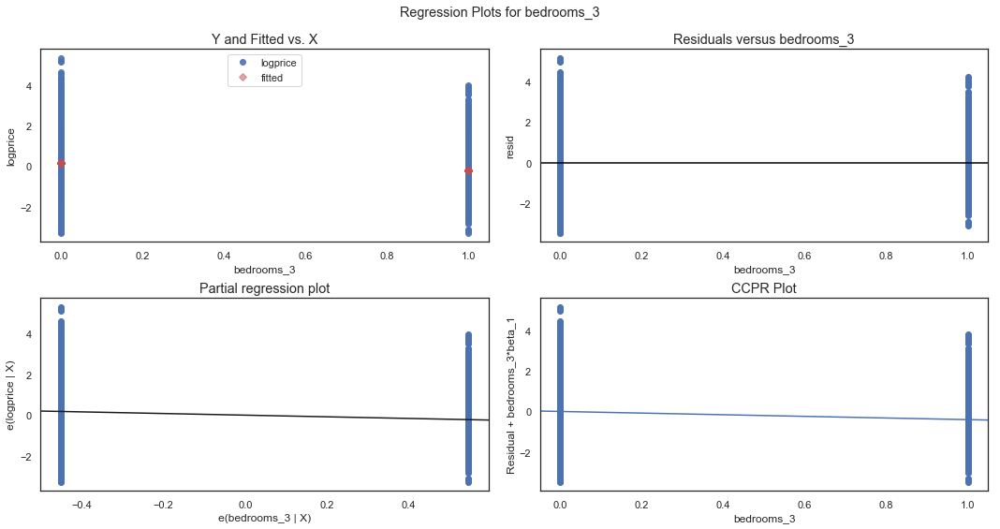

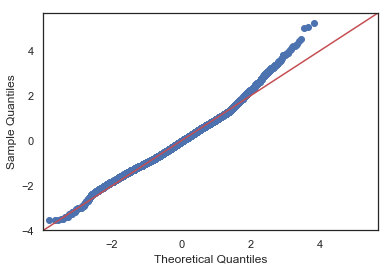

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bedrooms_3', 0.03999719741865593, 0.18174771149415148, -0.4018033300817636, 5.8215708196403665e-139]
King City Real Estate: logprice~bedrooms_33
----------------------------------------------


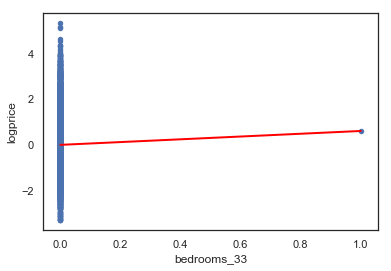

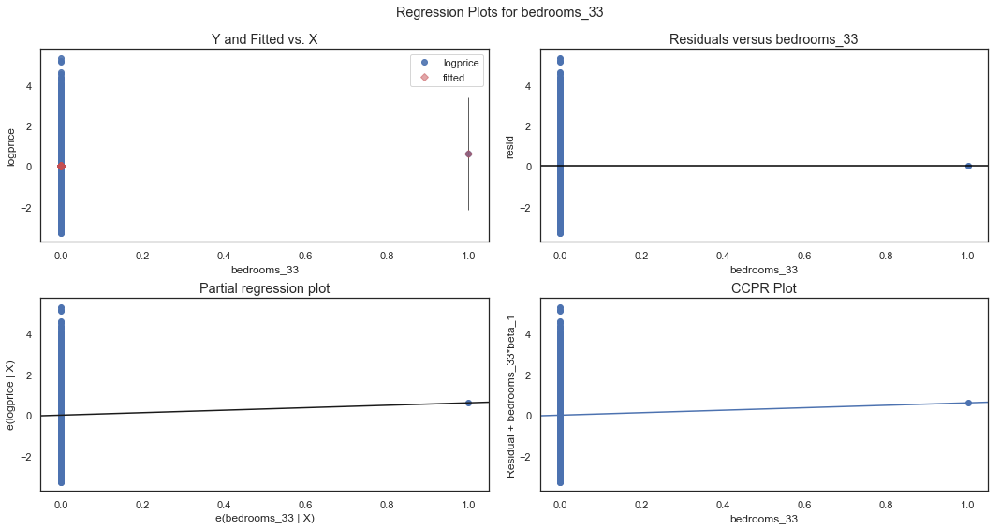

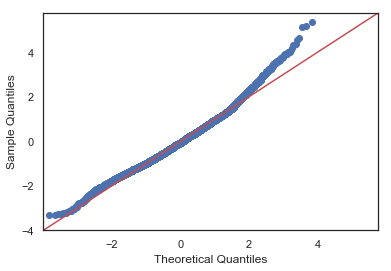

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bedrooms_33', 2.3885148897728747e-05, -3.9345501487245485e-05, 0.6070617450835583, 0.5438401704632623]
King City Real Estate: logprice~bedrooms_4
----------------------------------------------


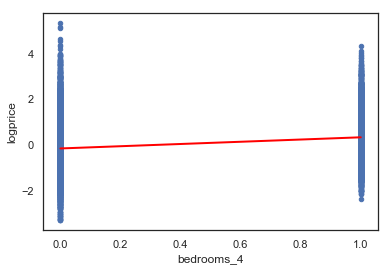

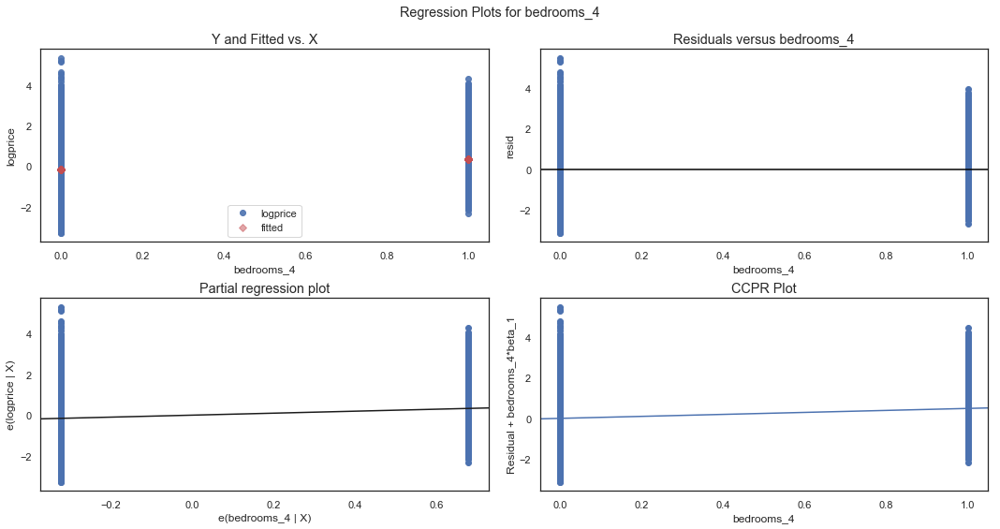

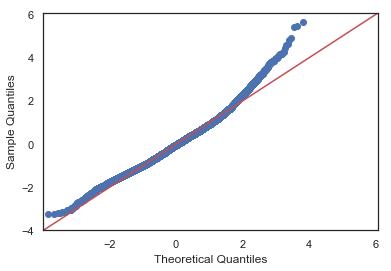

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bedrooms_4', 0.05203860378019487, -0.15752692943592447, 0.48785286918296167, 2.6534567423675326e-181]
King City Real Estate: logprice~bedrooms_5
----------------------------------------------


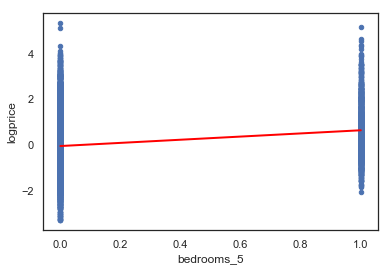

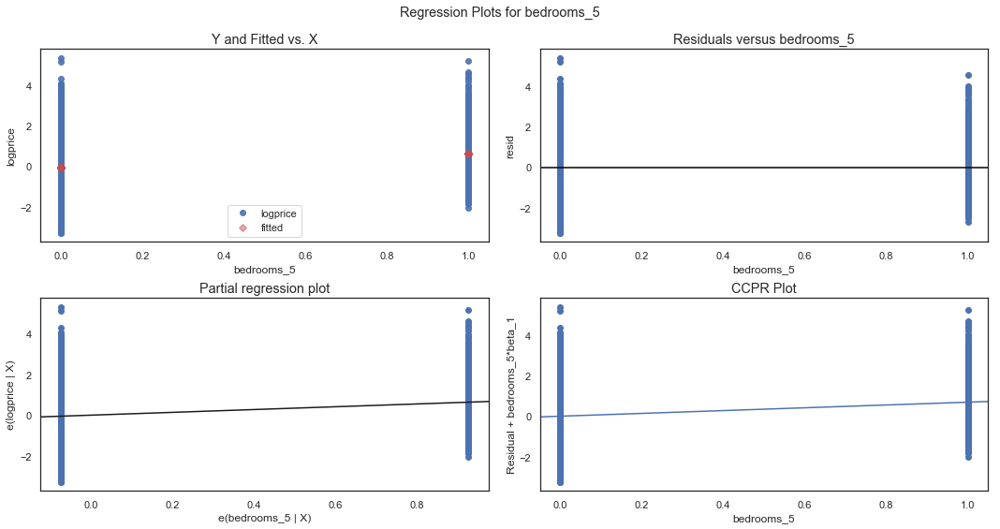

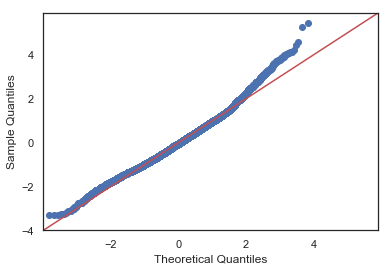

['bedrooms_5', 0.03284155928836907, -0.05147609216520552, 0.6894310989753412, 4.838342591637721e-114]
King City Real Estate: logprice~bedrooms_6
----------------------------------------------


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


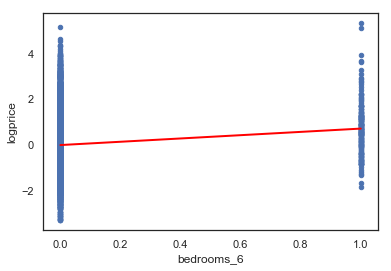

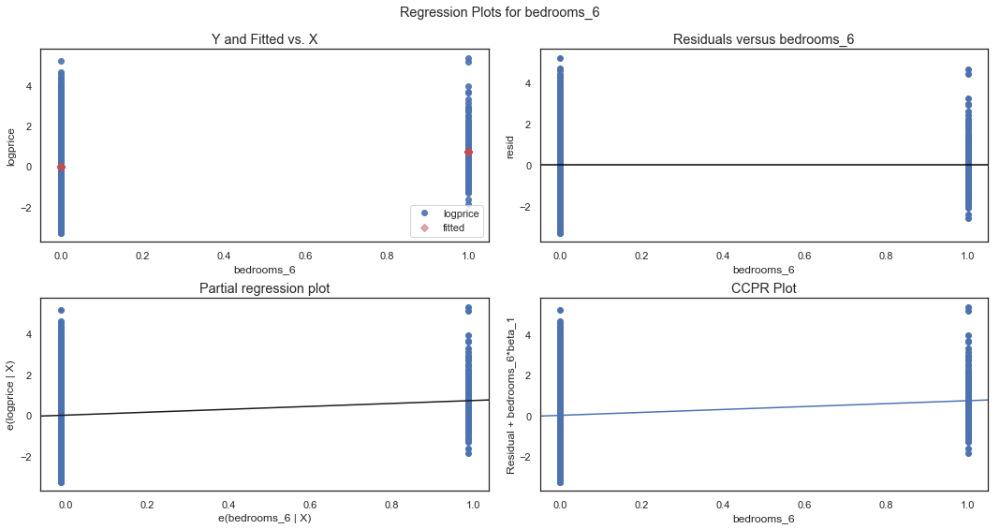

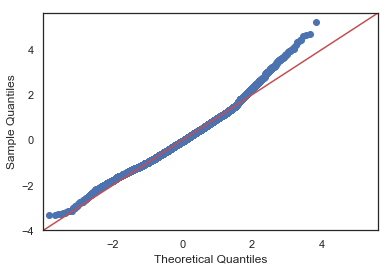

['bedrooms_6', 0.006105026625408461, -0.00858370737710035, 0.7197718539343372, 2.491051802837961e-22]
King City Real Estate: logprice~bedrooms_7
----------------------------------------------


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


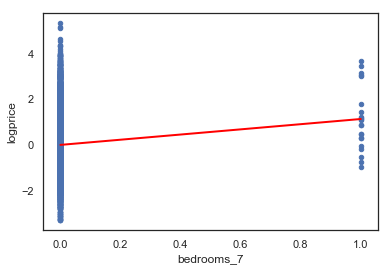

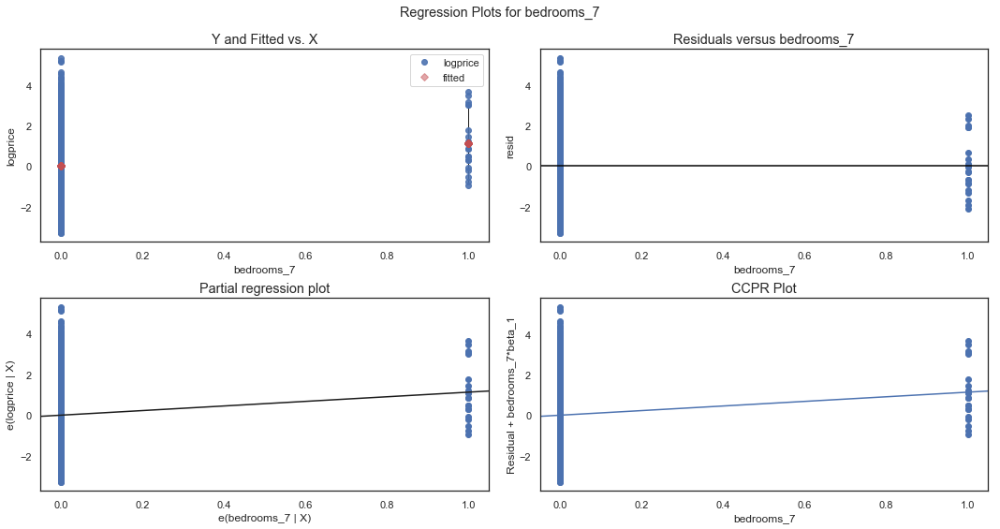

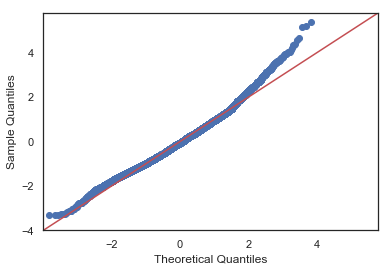

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bedrooms_7', 0.0018249624628129402, -0.0016142291762160504, 1.1320882710215623, 1.1062640908429324e-07]
King City Real Estate: logprice~bedrooms_8
----------------------------------------------


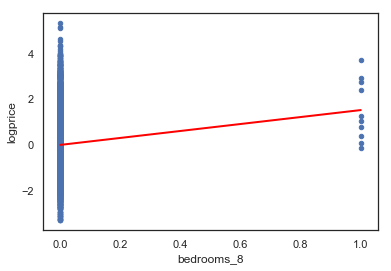

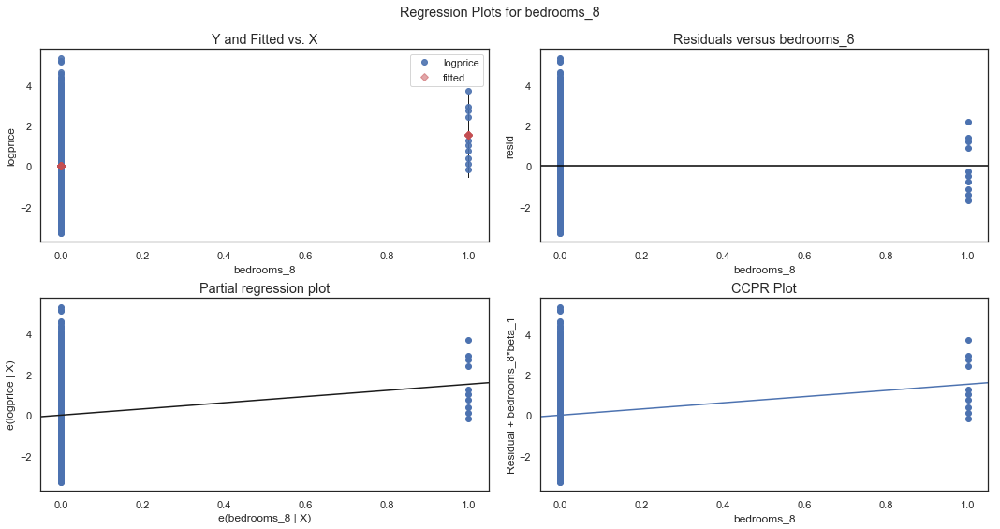

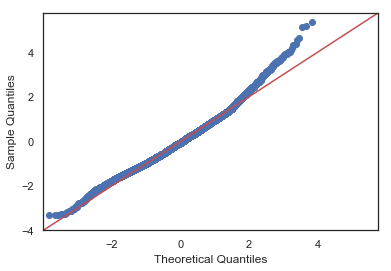

['bedrooms_8', 0.0015012874487457806, -0.000986710496434947, 1.5223956252131623, 1.4775298281008507e-06]
King City Real Estate: logprice~bedrooms_9
----------------------------------------------


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


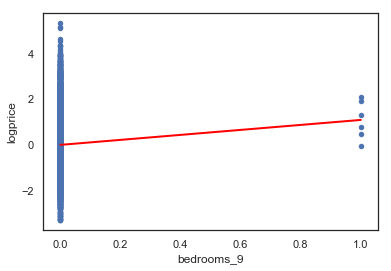

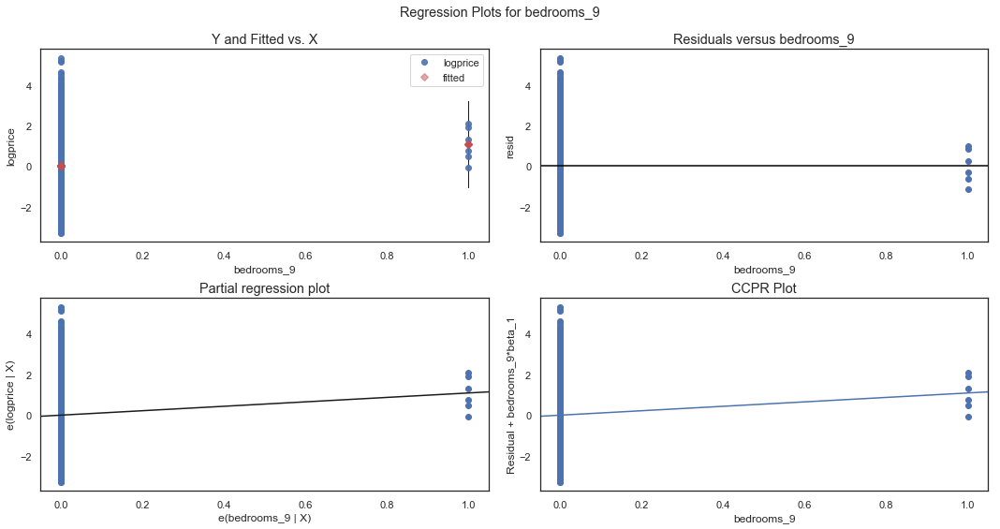

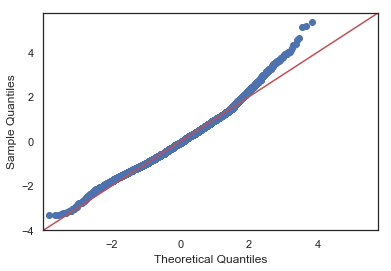

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bedrooms_9', 0.0004624391036236464, -0.0004241352776873028, 1.0906638670123492, 0.00755739653947942]
King City Real Estate: logprice~bathrooms_0_5
----------------------------------------------


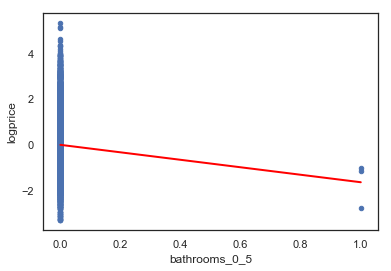

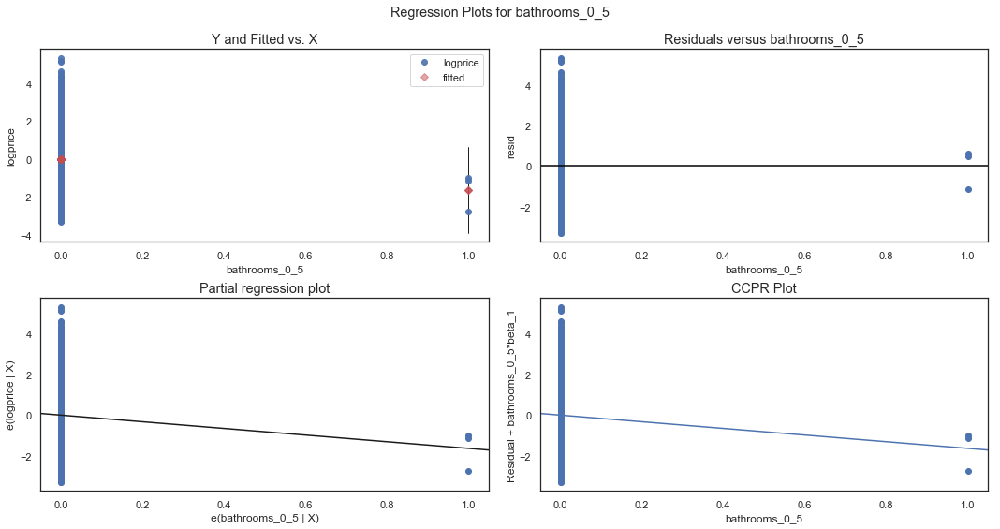

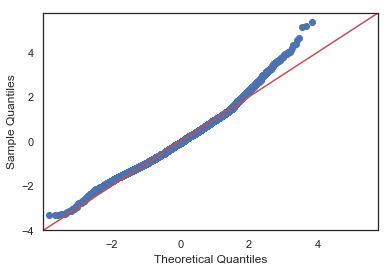

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_0_5', 0.000520071636314734, 0.000318017833108232, -1.6355657147966585, 0.004613673723369196]
King City Real Estate: logprice~bathrooms_0_75
----------------------------------------------


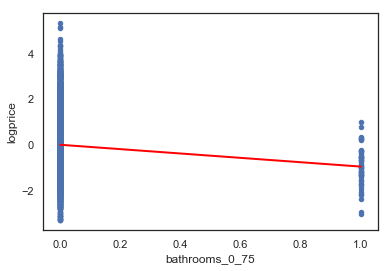

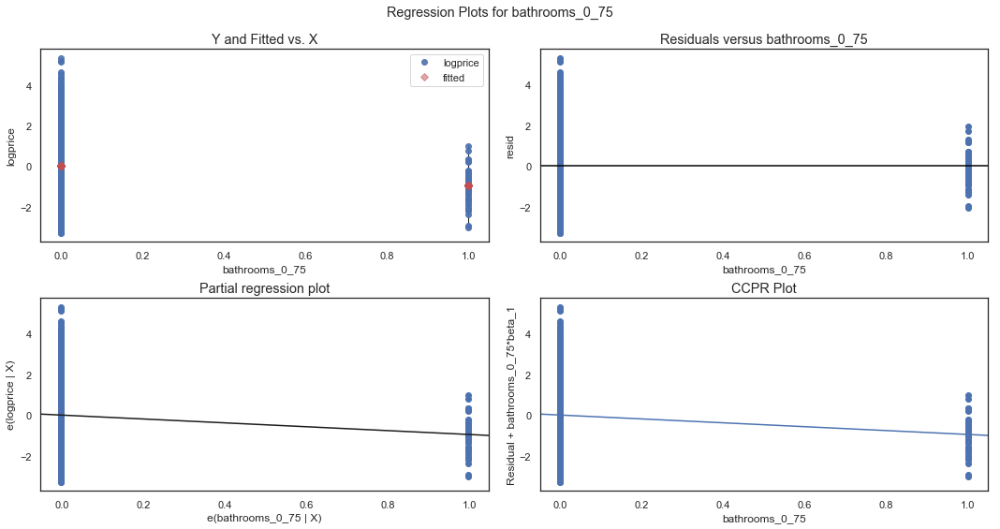

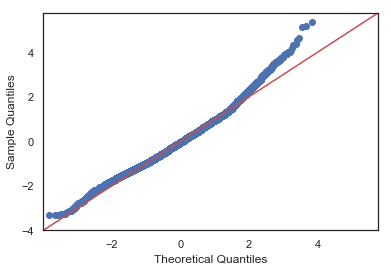

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_0_75', 0.0029378956151054902, 0.003090473754992752, -0.9536583912629226, 1.6160899859875735e-11]
King City Real Estate: logprice~bathrooms_1_0
----------------------------------------------


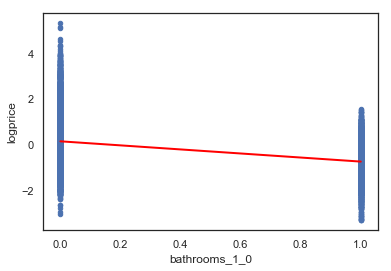

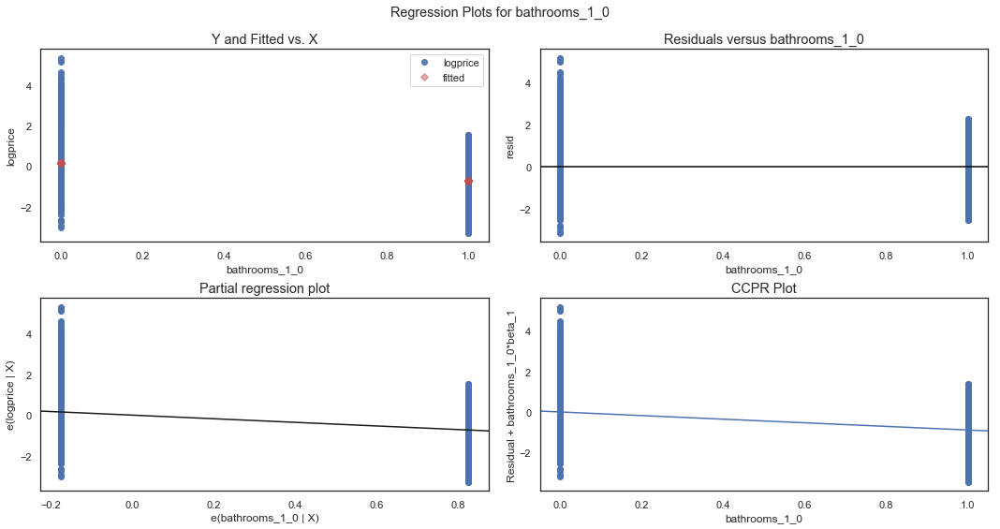

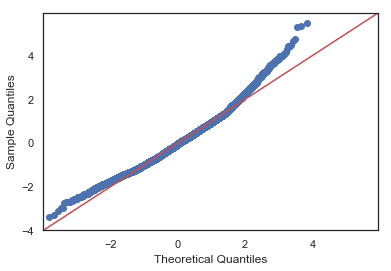

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_1_0', 0.11347266108767207, 0.15496317554035077, -0.8871713674988633, 0.0]
King City Real Estate: logprice~bathrooms_1_25
----------------------------------------------


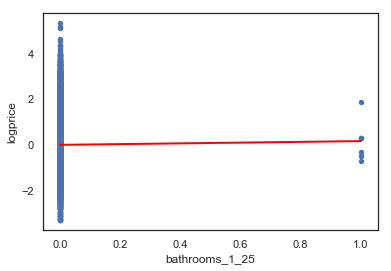

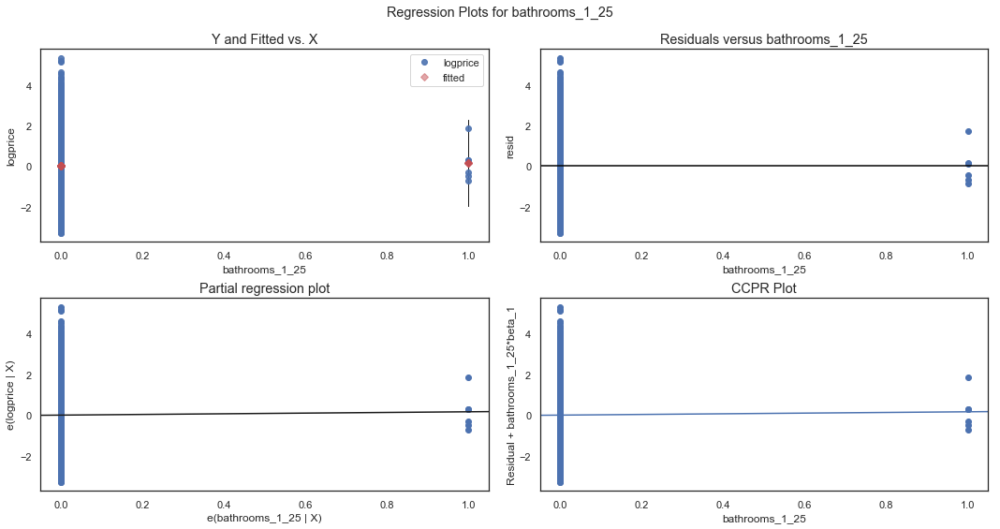

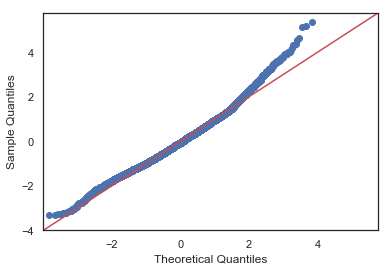

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_1_25', 1.0460247745647244e-05, -6.378933955070339e-05, 0.1640342870940877, 0.6879021073169003]
King City Real Estate: logprice~bathrooms_1_5
----------------------------------------------


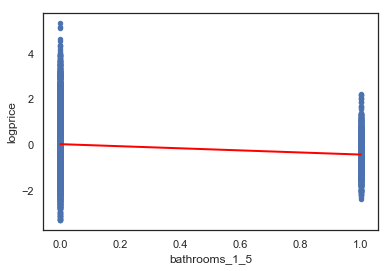

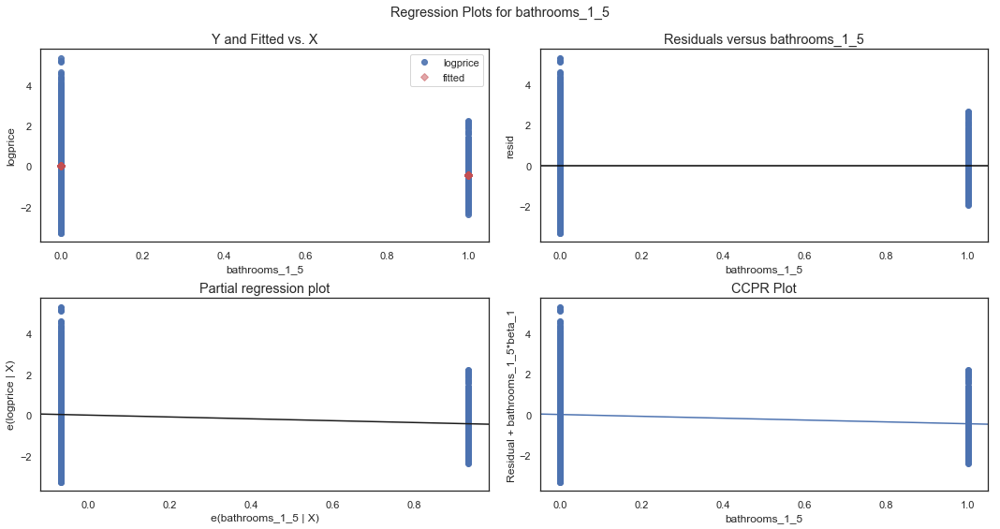

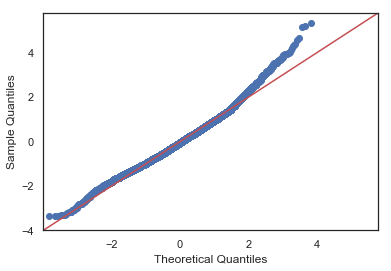

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_1_5', 0.013091862043694835, 0.030807663494668413, -0.4557348418567614, 3.987979754052403e-46]
King City Real Estate: logprice~bathrooms_1_75
----------------------------------------------


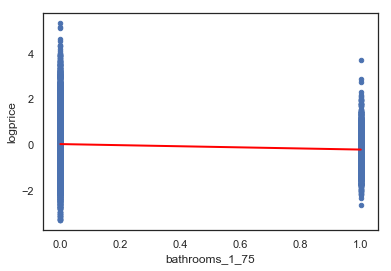

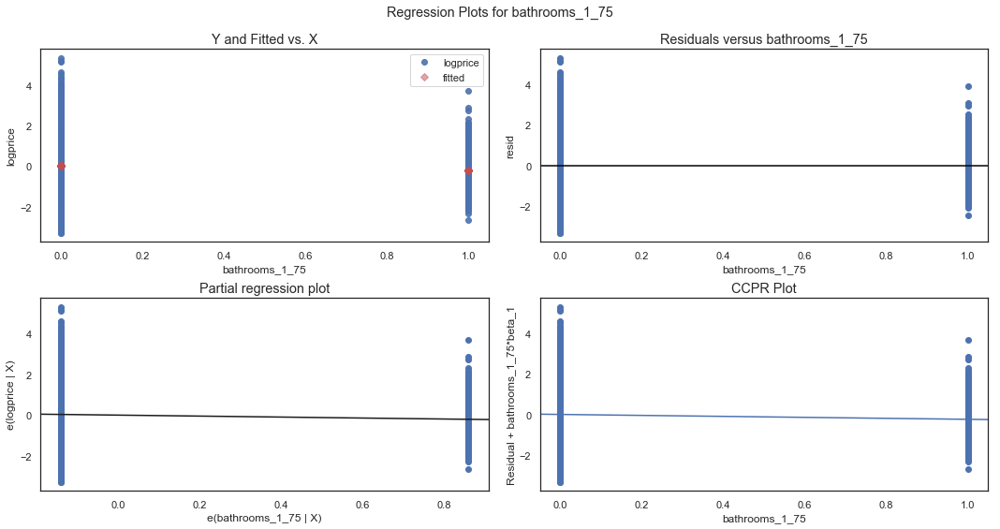

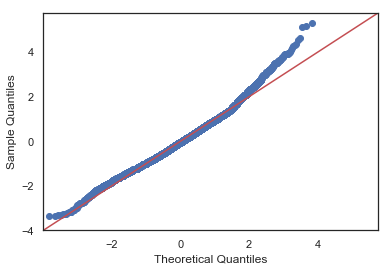

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_1_75', 0.006971861163657889, 0.03384143664439291, -0.2398436040347734, 2.787095341515001e-25]
King City Real Estate: logprice~bathrooms_2_0
----------------------------------------------


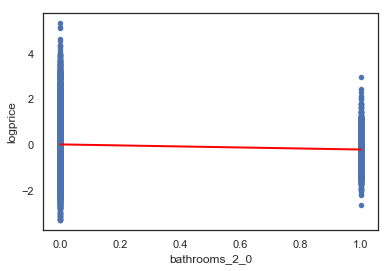

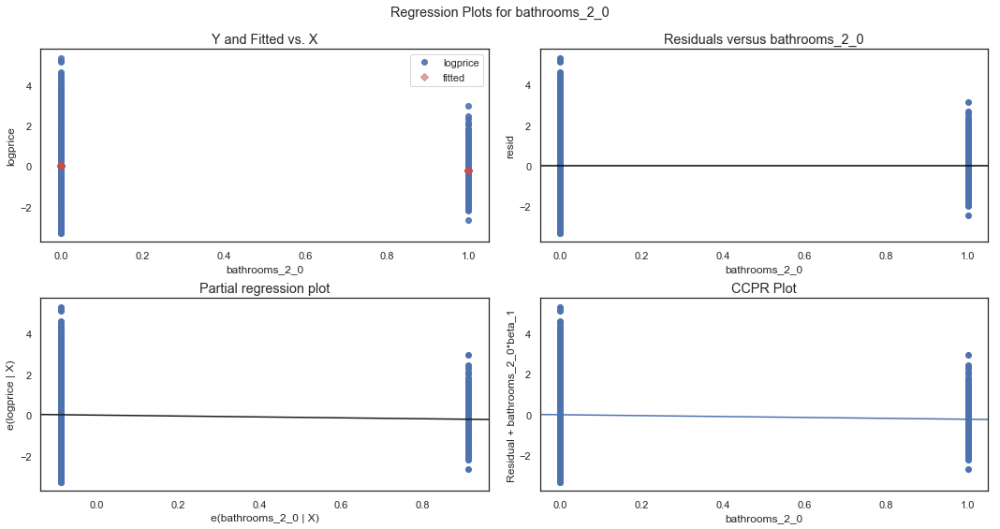

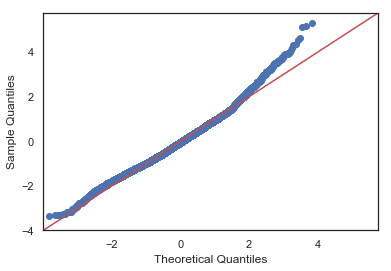

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_2_0', 0.004030821068848001, 0.019762655808329387, -0.22371094384745221, 2.9386059589550494e-15]
King City Real Estate: logprice~bathrooms_2_25
----------------------------------------------


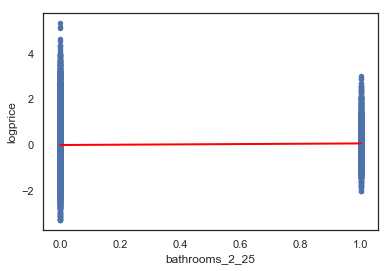

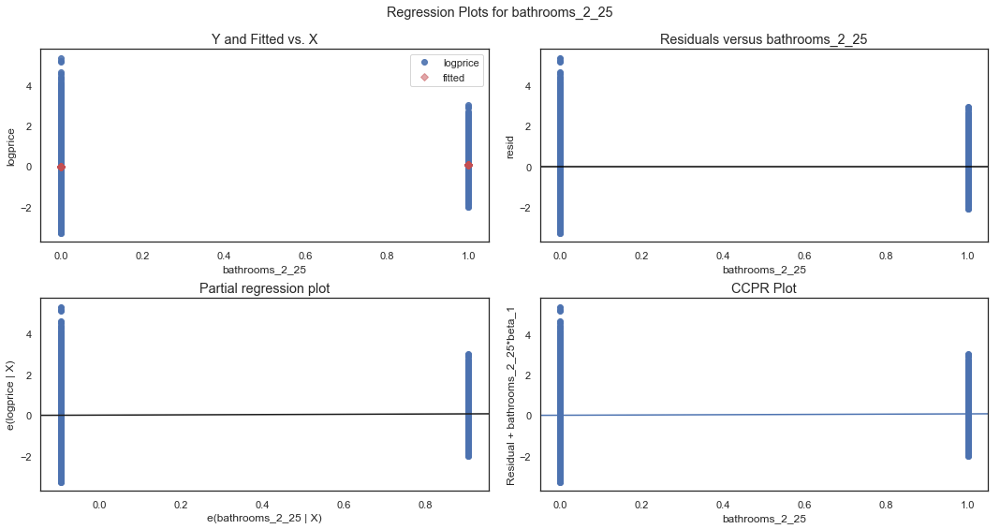

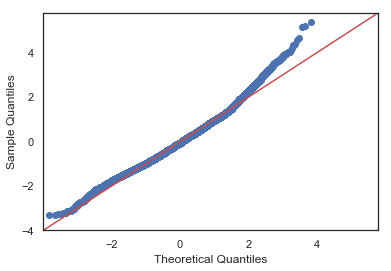

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_2_25', 0.0003999456197046891, -0.006467618471053056, 0.06830176960473285, 0.012986153446229075]
King City Real Estate: logprice~bathrooms_2_5
----------------------------------------------


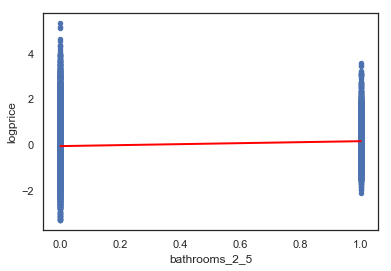

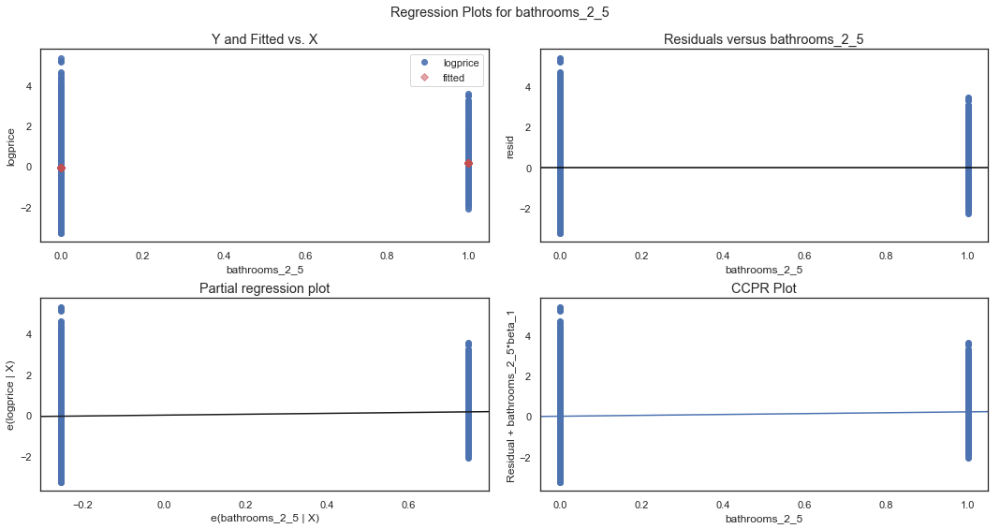

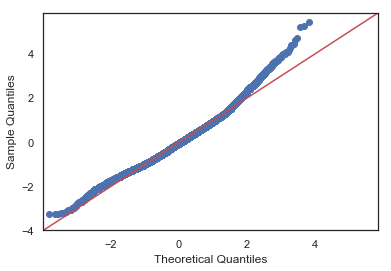

['bathrooms_2_5', 0.008765578002505214, -0.054610682007034575, 0.21511059808250554, 2.186475894334608e-31]
King City Real Estate: logprice~bathrooms_2_75
----------------------------------------------


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


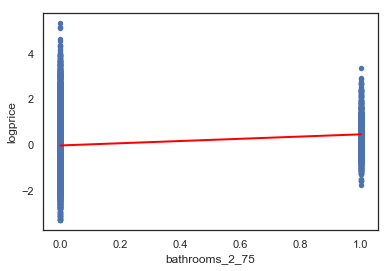

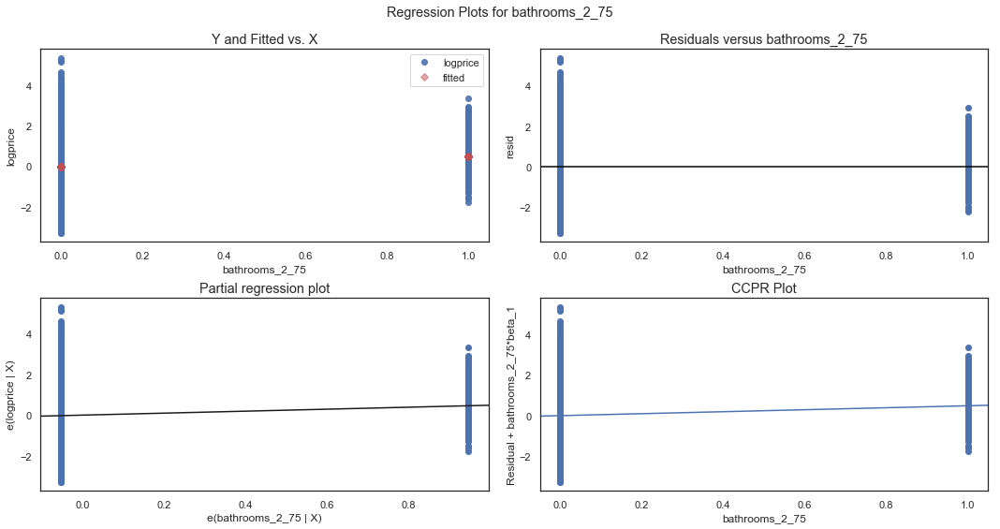

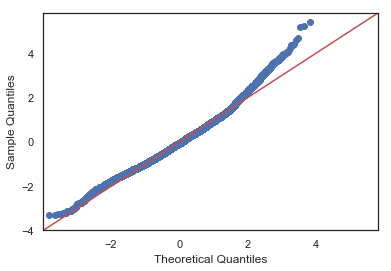

['bathrooms_2_75', 0.012074317309907046, -0.026249606132834065, 0.48620068790652304, 1.1756787604302835e-42]
King City Real Estate: logprice~bathrooms_3_0
----------------------------------------------


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


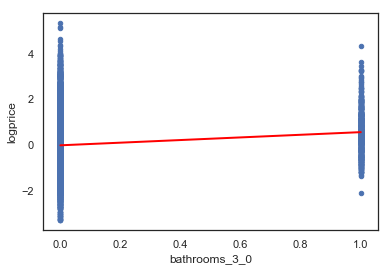

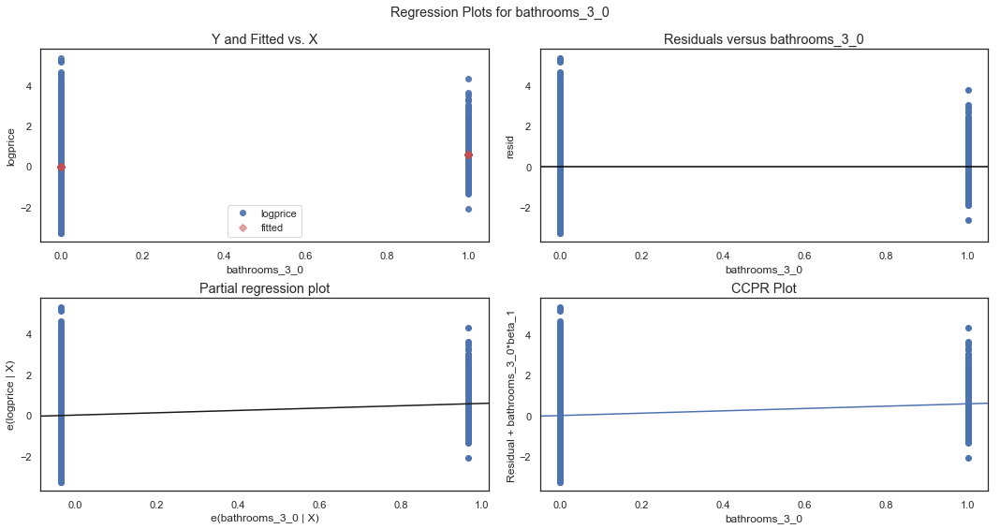

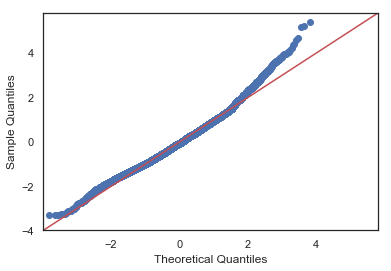

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_3_0', 0.011016851468289124, -0.01981517664448852, 0.5757596242004711, 4.718327288162984e-39]
King City Real Estate: logprice~bathrooms_3_25
----------------------------------------------


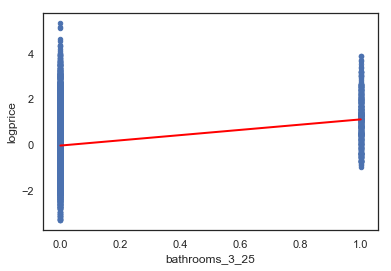

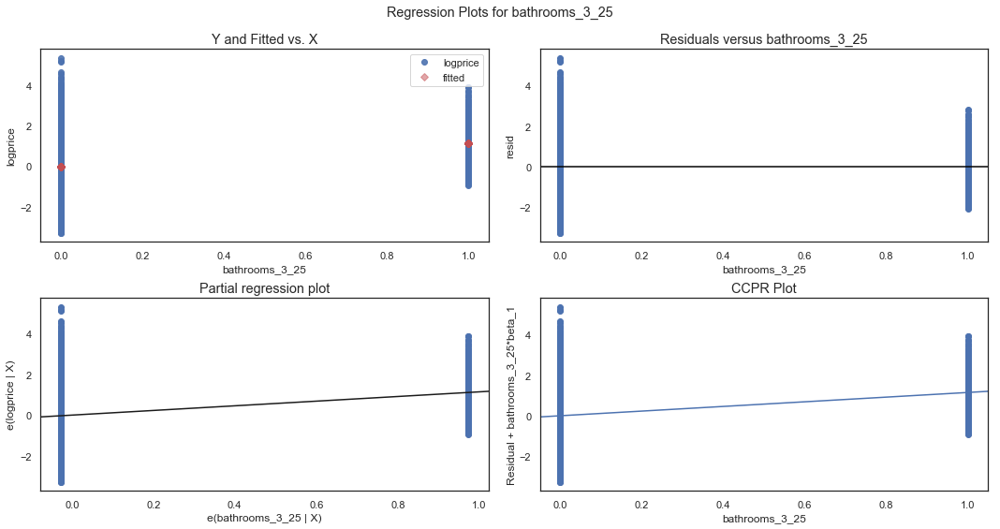

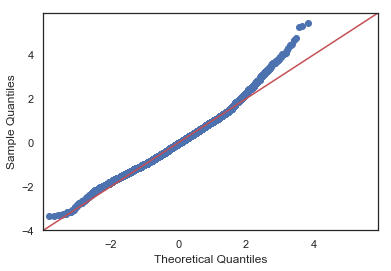

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_3_25', 0.0344614277191958, -0.030938646351287773, 1.1447299150039711, 1.1451615898343811e-119]
King City Real Estate: logprice~bathrooms_3_5
----------------------------------------------


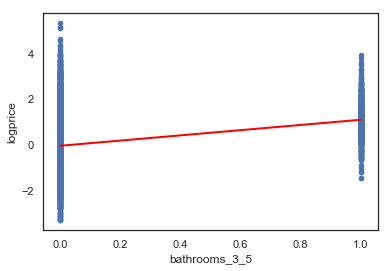

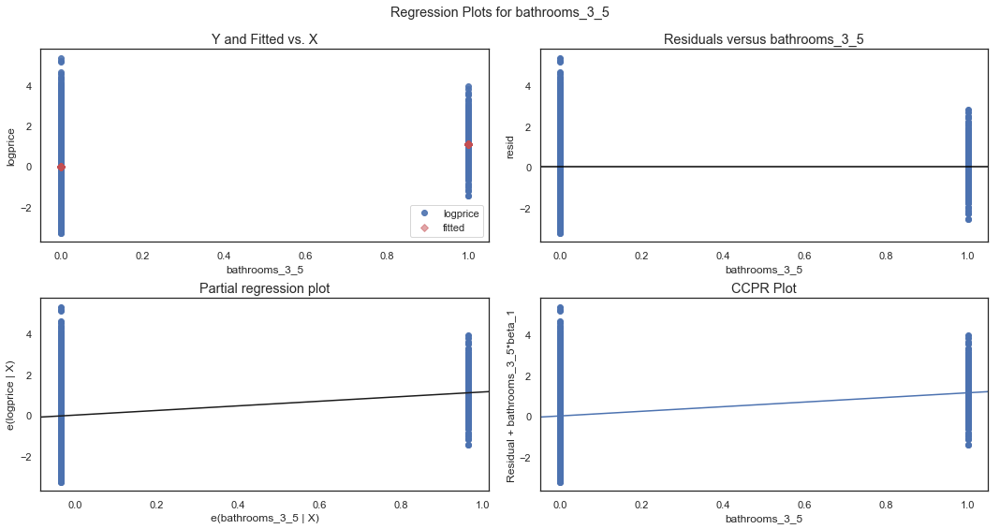

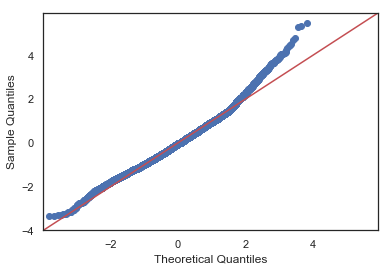

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_3_5', 0.043309437757448443, -0.0394410451410936, 1.137450253242186, 1.478315001836873e-150]
King City Real Estate: logprice~bathrooms_3_75
----------------------------------------------


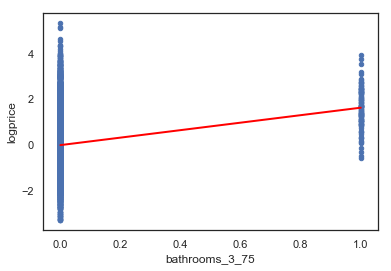

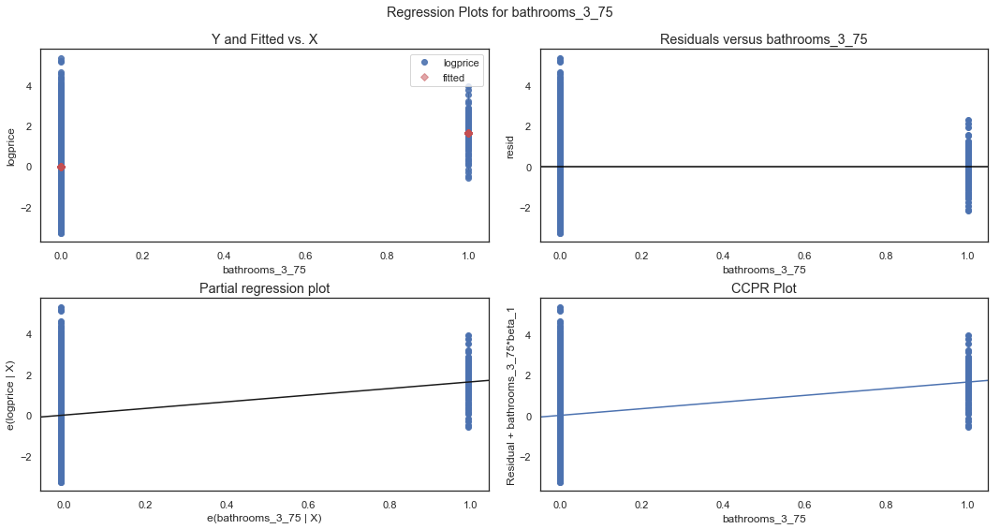

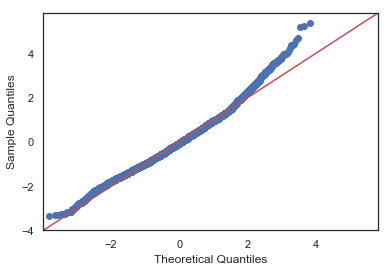

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_3_75', 0.017759074227492344, -0.010924467790373774, 1.636442849905958, 4.521448965276632e-62]
King City Real Estate: logprice~bathrooms_4_0
----------------------------------------------


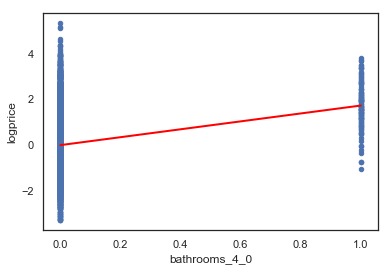

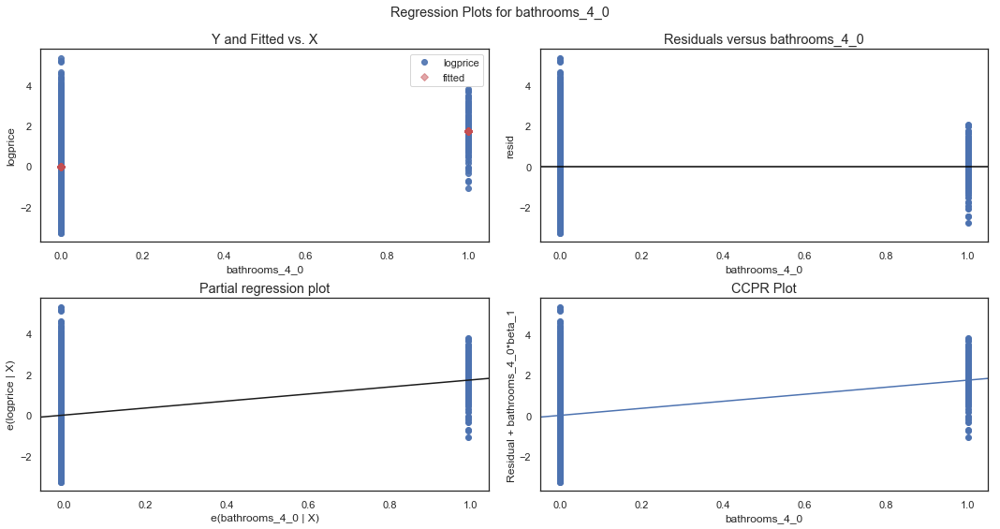

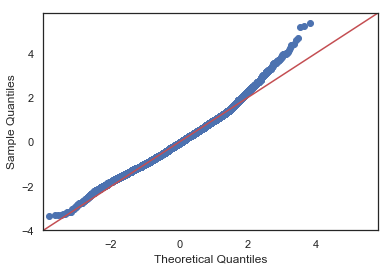

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_4_0', 0.01928284969007954, -0.01121539623001491, 1.7304234843553699, 2.7331115362826537e-67]
King City Real Estate: logprice~bathrooms_4_25
----------------------------------------------


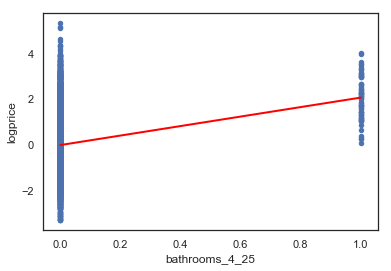

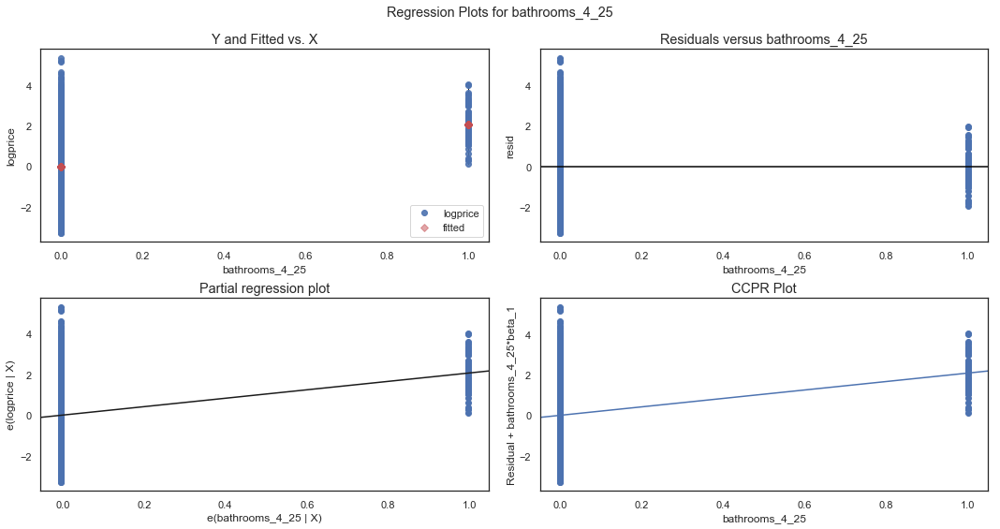

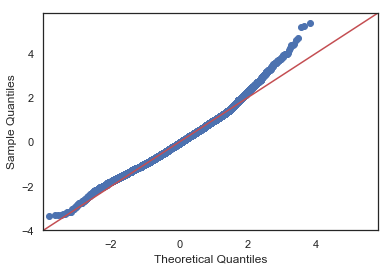

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_4_25', 0.01725027616107877, -0.00834228938046384, 2.076019078287314, 2.4908595747541635e-60]
King City Real Estate: logprice~bathrooms_4_5
----------------------------------------------


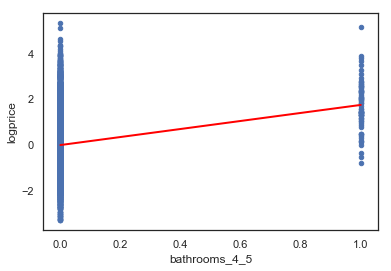

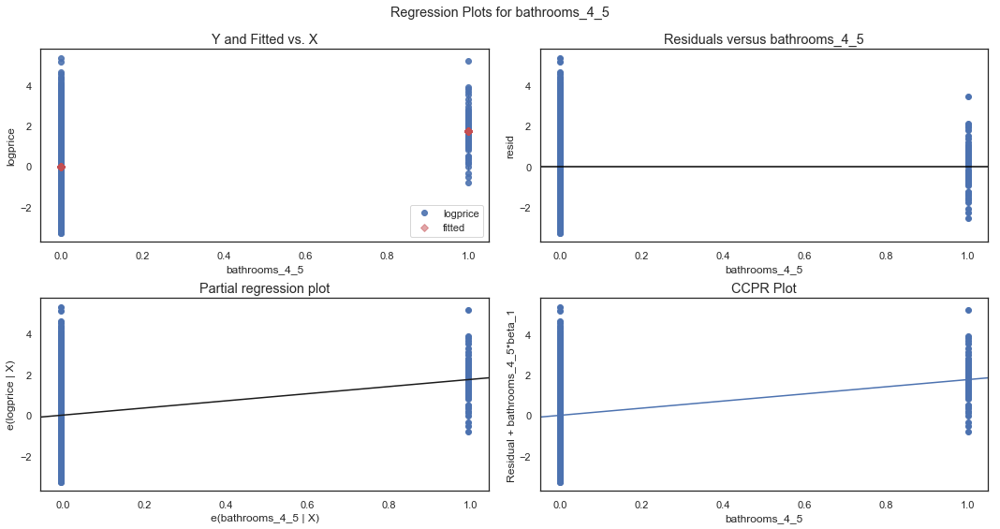

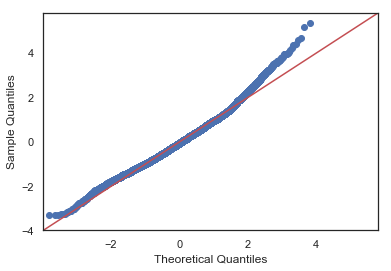

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_4_5', 0.01450167983809747, -0.008302663950820098, 1.7548192068471256, 6.164325489473483e-51]
King City Real Estate: logprice~bathrooms_4_75
----------------------------------------------


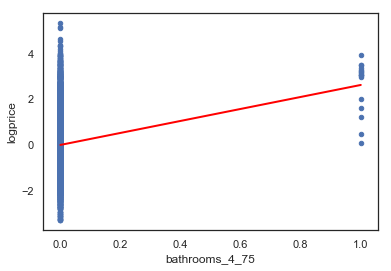

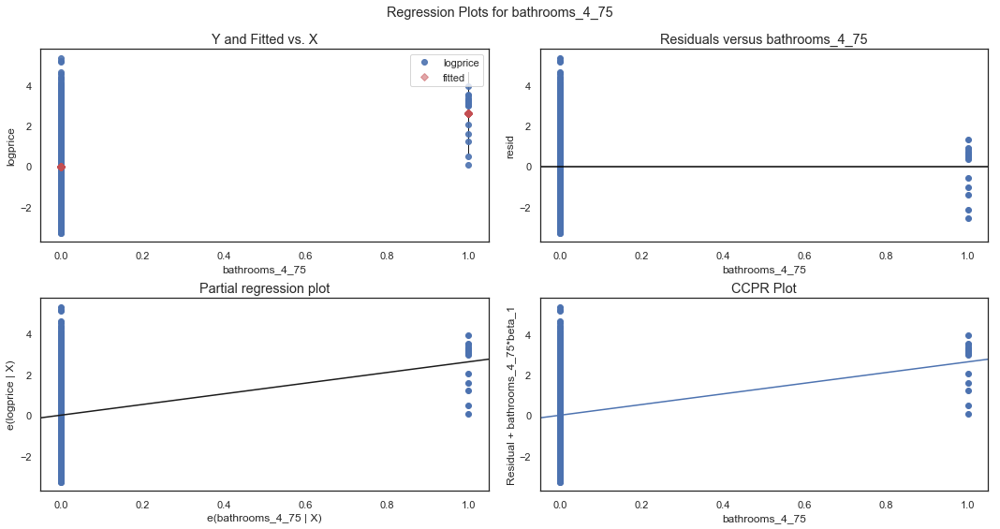

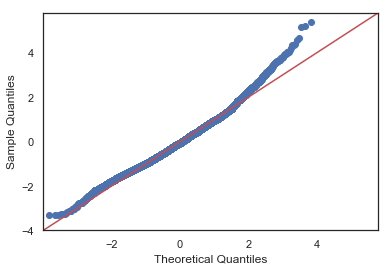

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_4_75', 0.0075715652690883095, -0.002889839488875409, 2.622784322146802, 2.5342943485660503e-27]
King City Real Estate: logprice~bathrooms_5_0
----------------------------------------------


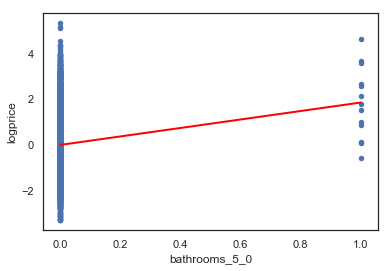

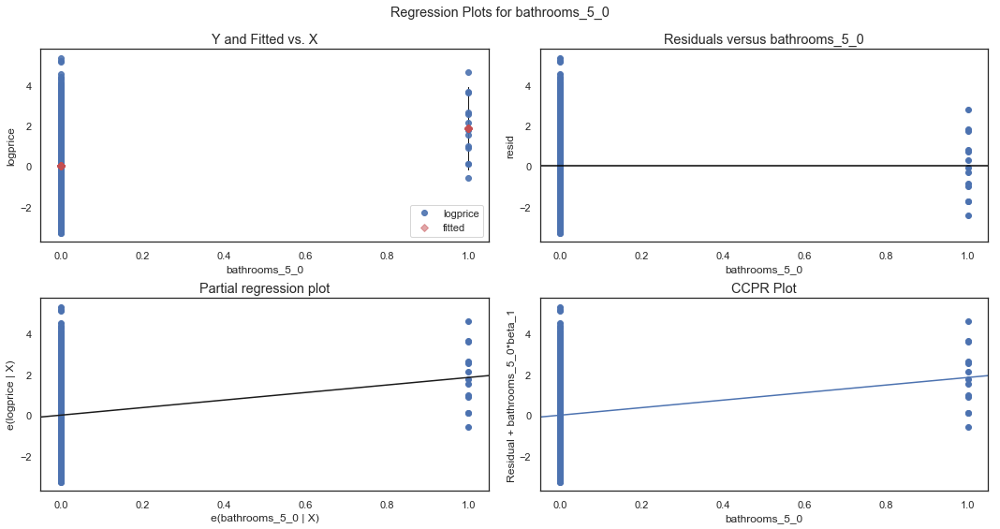

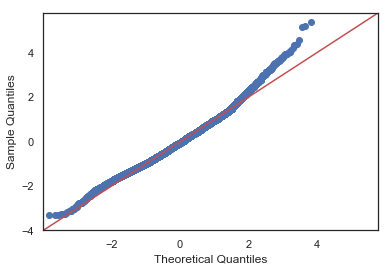

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_5_0', 0.00289034992852355, -0.0015611583756028075, 1.8528548138317182, 2.352915021807808e-11]
King City Real Estate: logprice~bathrooms_5_25
----------------------------------------------


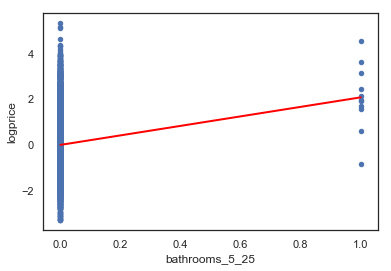

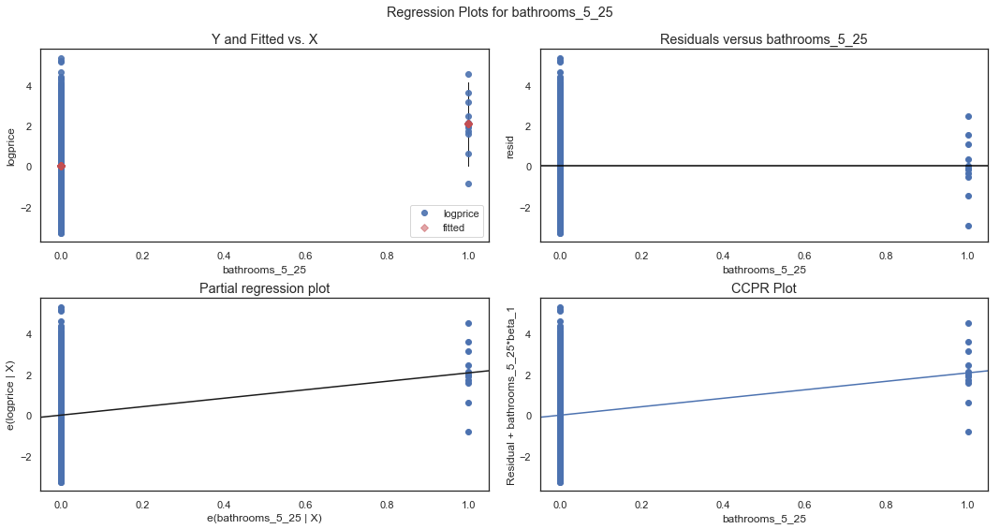

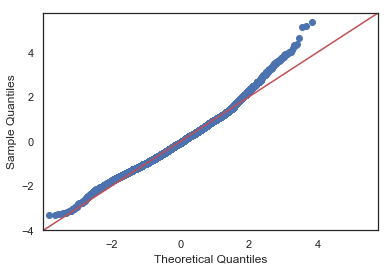

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_5_25', 0.0030800970079588597, -0.0014823489322128604, 2.0791965161589925, 5.257752747070448e-12]
King City Real Estate: logprice~bathrooms_5_5
----------------------------------------------


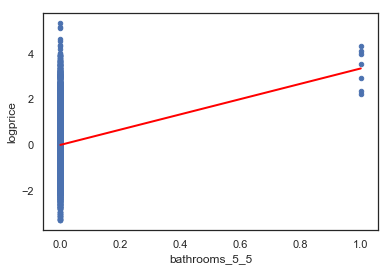

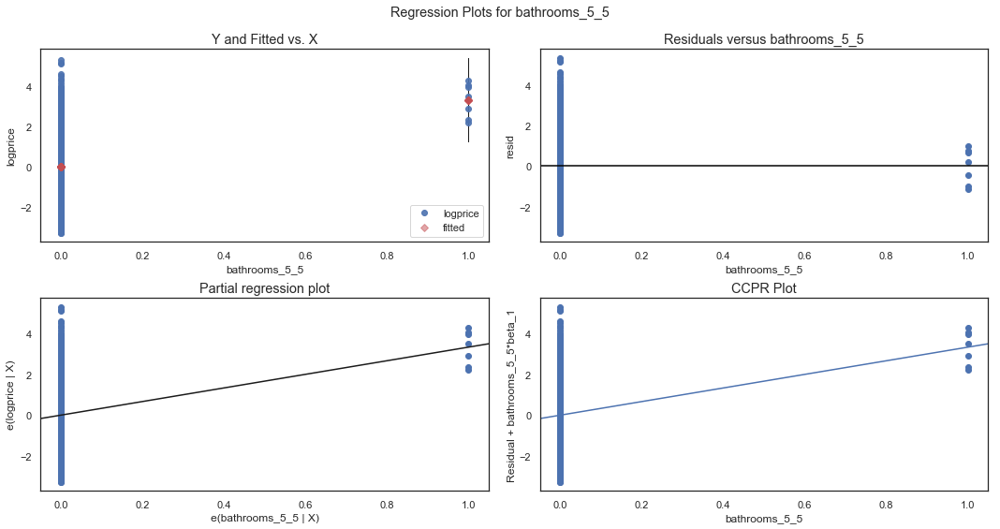

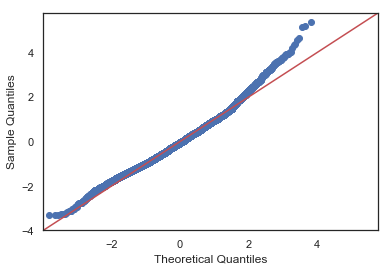

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_5_5', 0.005070395508681824, -0.001516999769214232, 3.3436842059775755, 8.34129374380087e-19]
King City Real Estate: logprice~bathrooms_5_75
----------------------------------------------


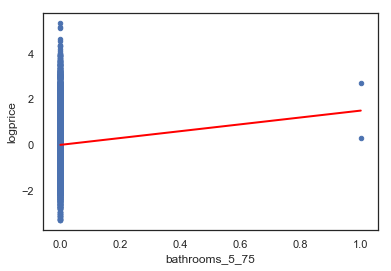

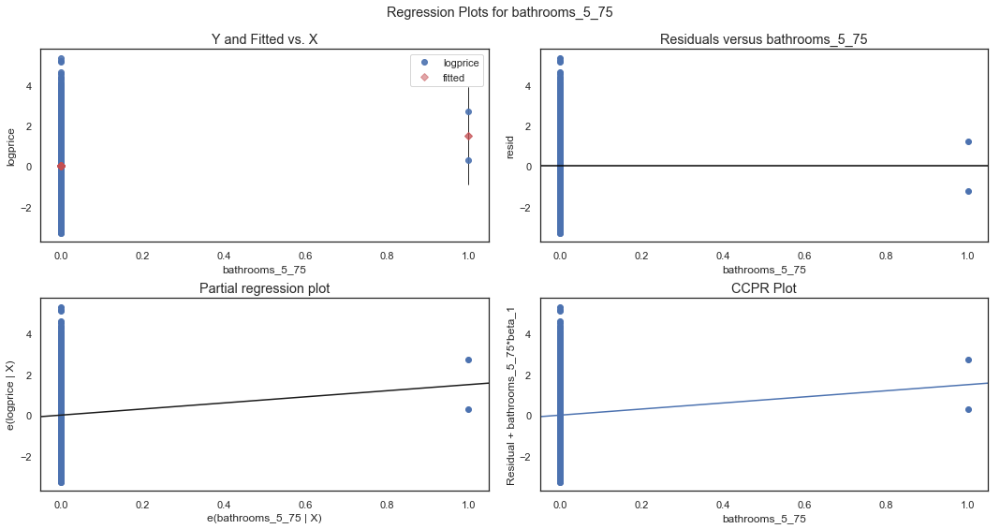

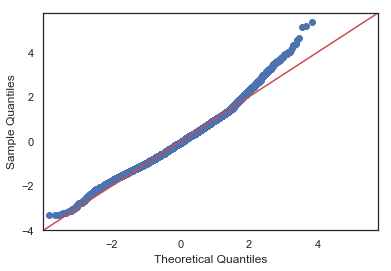

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_5_75', 0.0002911972046845124, -0.00019429149235762784, 1.4988617191113236, 0.03403772780892321]
King City Real Estate: logprice~bathrooms_6_0
----------------------------------------------


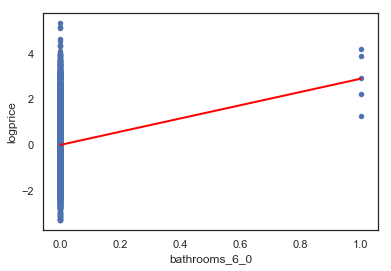

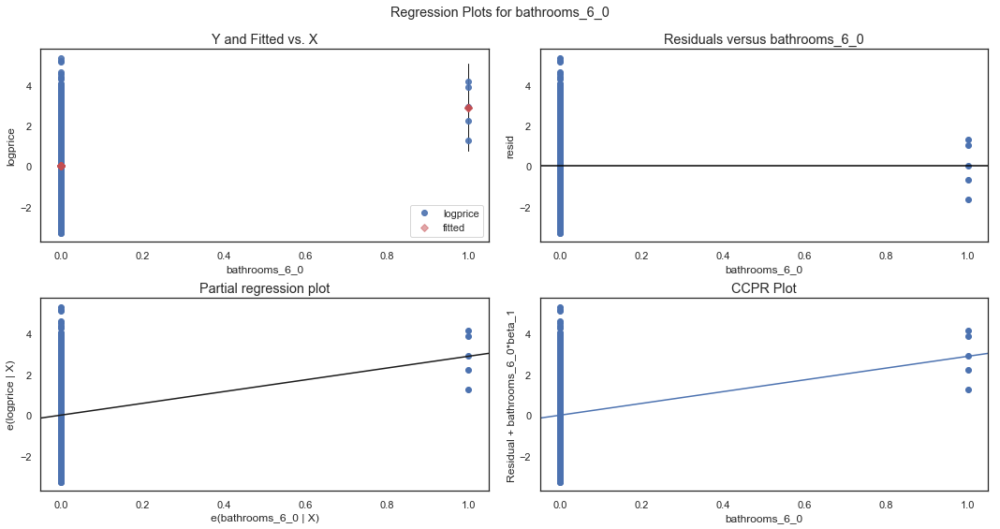

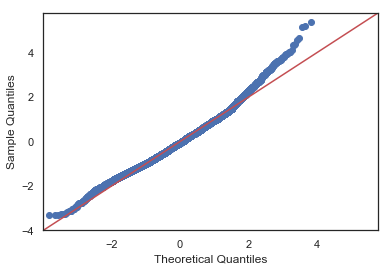

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_6_0', 0.0027138819267711334, -0.0009379245288651614, 2.894247511699507, 9.495814188077691e-11]
King City Real Estate: logprice~bathrooms_6_75
----------------------------------------------


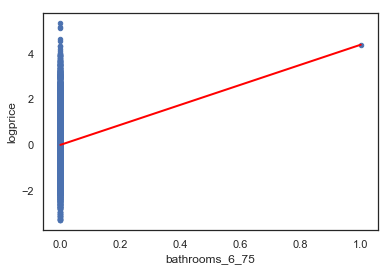

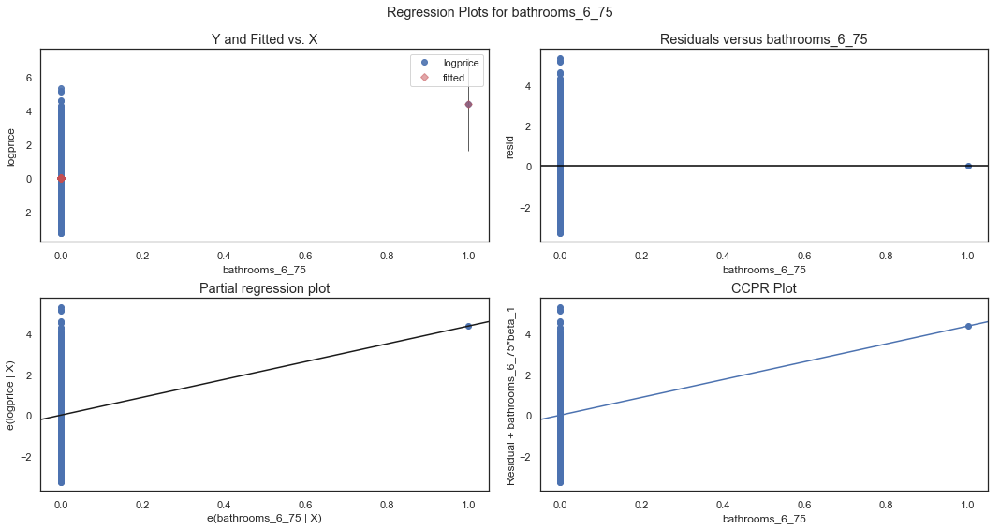

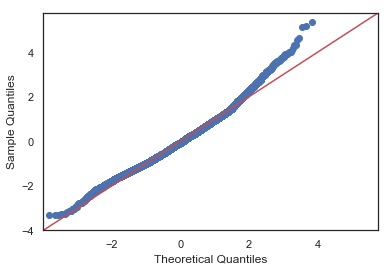

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_6_75', 0.0012442132060286326, -0.00028397395727119794, 4.381434189374124, 1.1735593779530655e-05]
King City Real Estate: logprice~bathrooms_7_5
----------------------------------------------


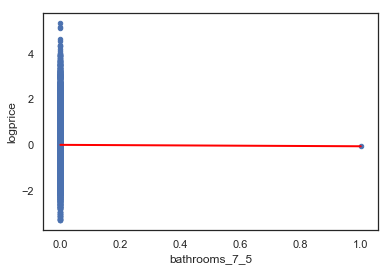

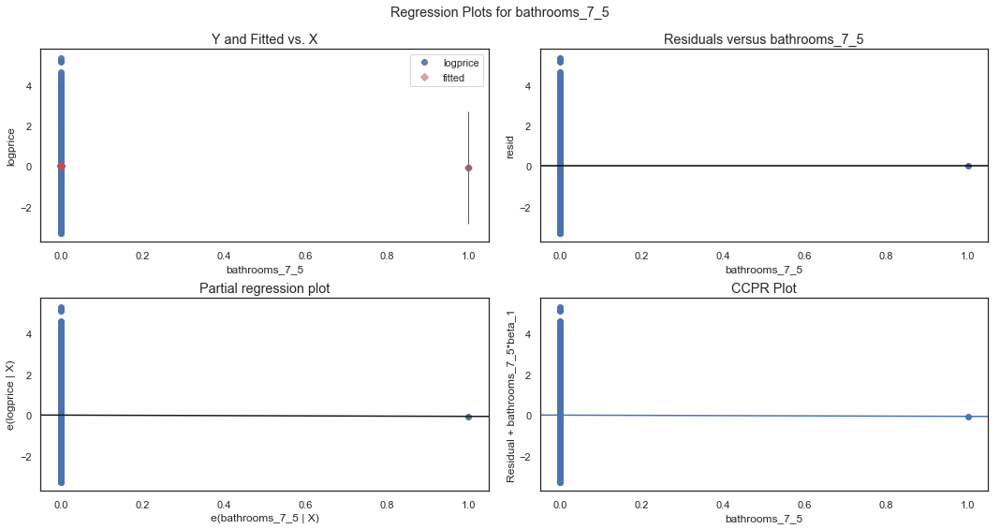

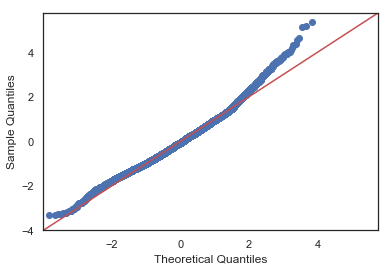

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_7_5', 2.478791341076203e-07, 4.0082159712979265e-06, -0.06184276158433097, 0.950692036895433]
King City Real Estate: logprice~bathrooms_7_75
----------------------------------------------


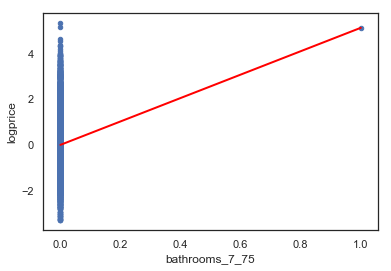

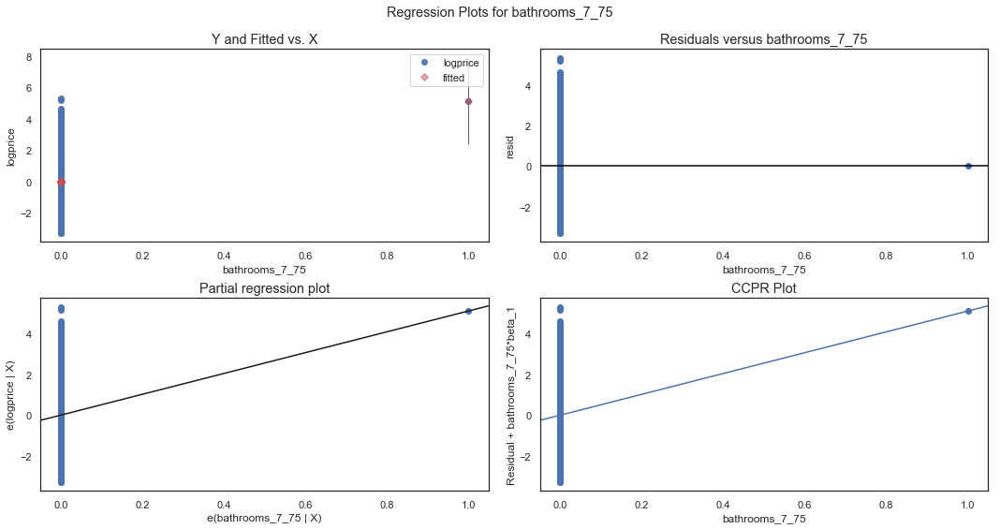

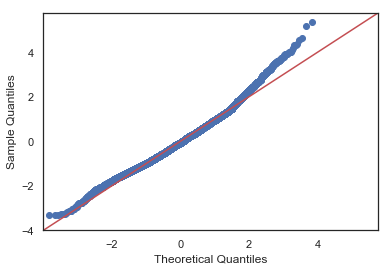

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_7_75', 0.0016990473069212753, -0.0003318439053936525, 5.1200196189555145, 3.026626006663397e-07]
King City Real Estate: logprice~bathrooms_8_0
----------------------------------------------


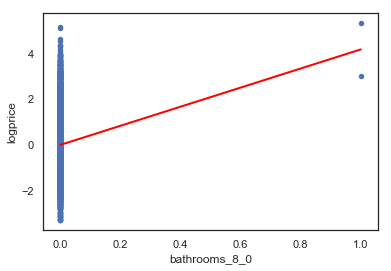

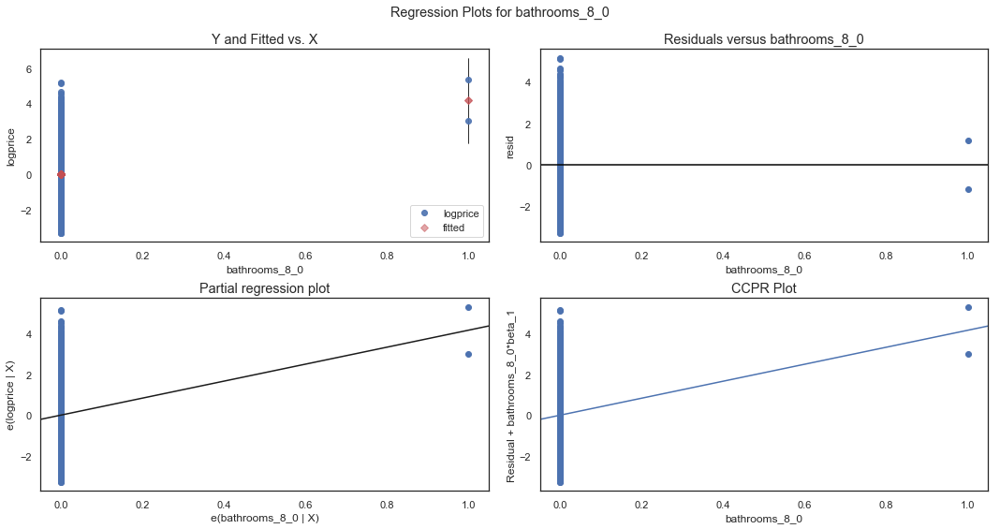

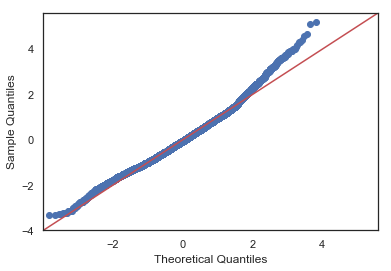

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['bathrooms_8_0', 0.0022601015066265884, -0.0005412827113852863, 4.175725478300225, 3.4620575957796033e-09]
King City Real Estate: logprice~floors_1_0
----------------------------------------------


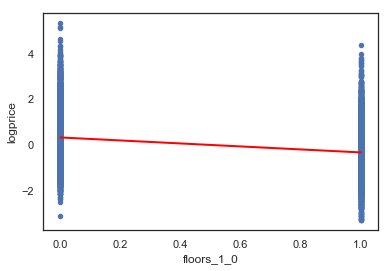

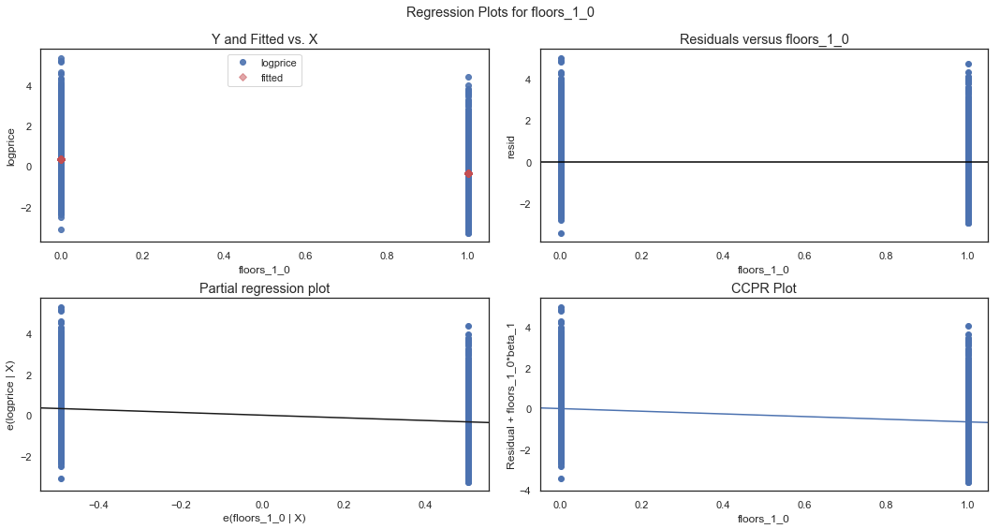

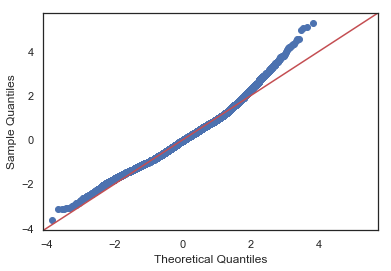

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['floors_1_0', 0.10676906307448586, 0.3227664723553059, -0.6535385698119915, 0.0]
King City Real Estate: logprice~floors_1_5
----------------------------------------------


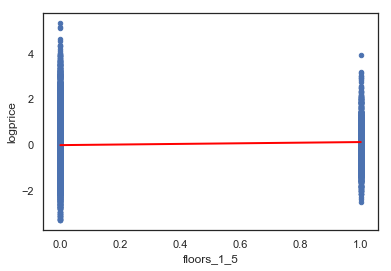

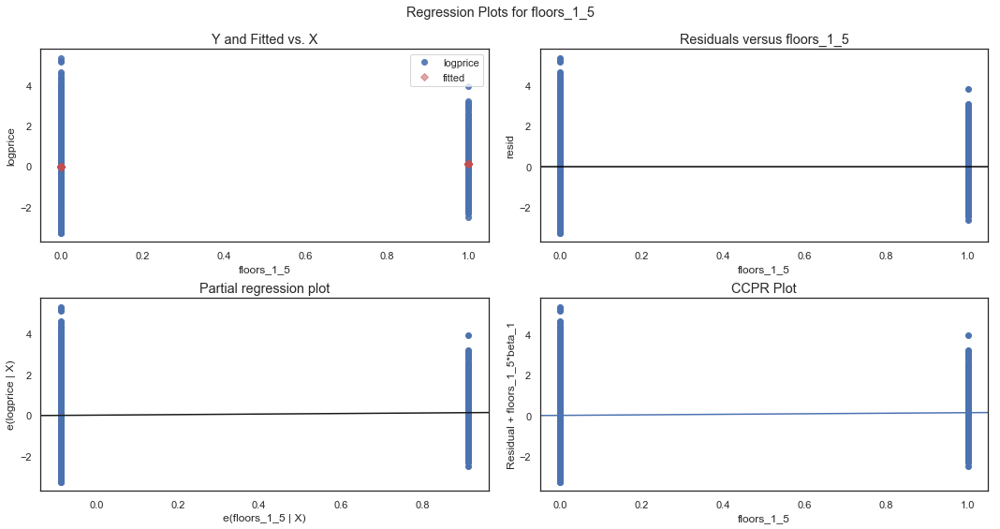

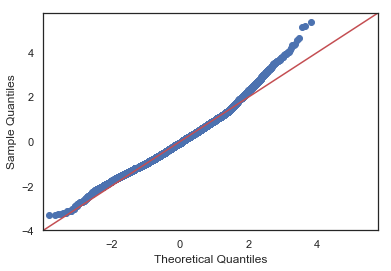

['floors_1_5', 0.001417263589343909, -0.011605023720003351, 0.13372211424837066, 2.9040592738425973e-06]
King City Real Estate: logprice~floors_2_0
----------------------------------------------


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


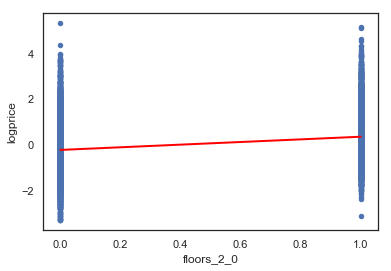

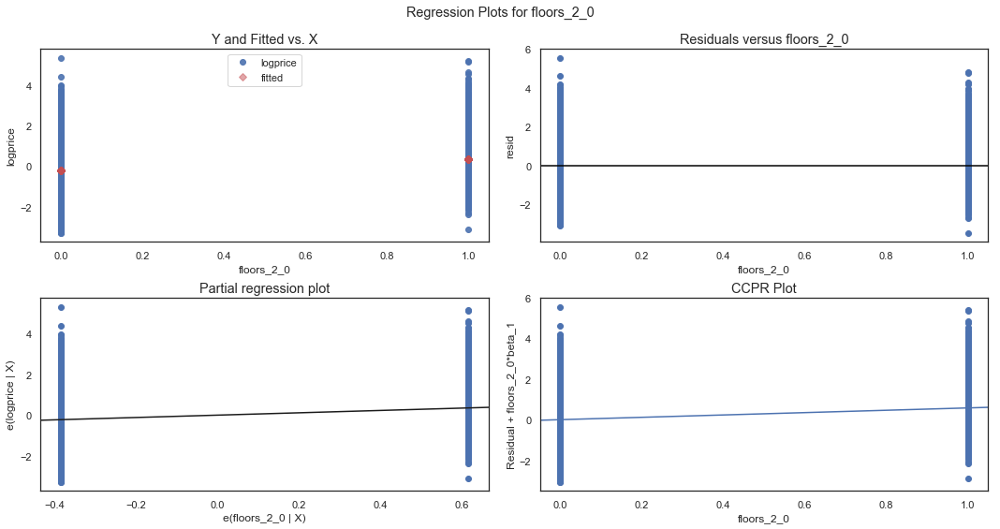

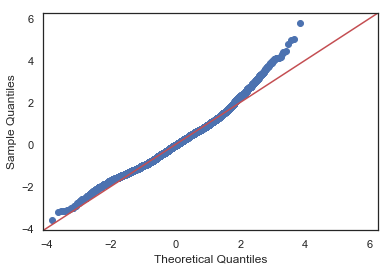

['floors_2_0', 0.07883033781491022, -0.2217088750465425, 0.5772437112885154, 1.9625740029001242e-277]
King City Real Estate: logprice~floors_2_5
----------------------------------------------


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


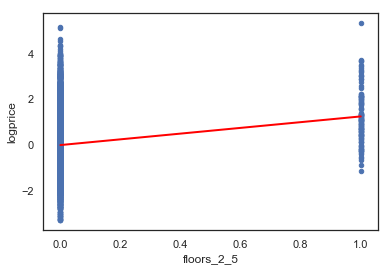

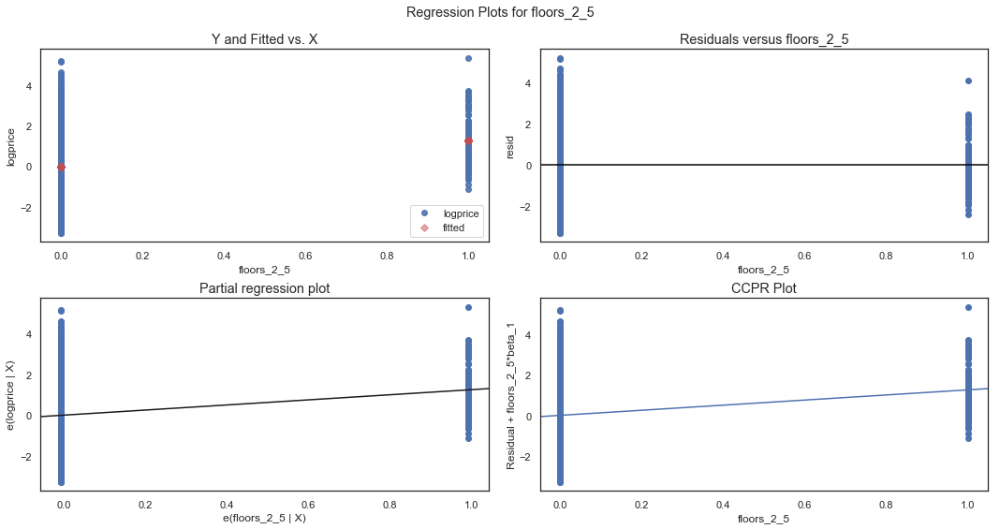

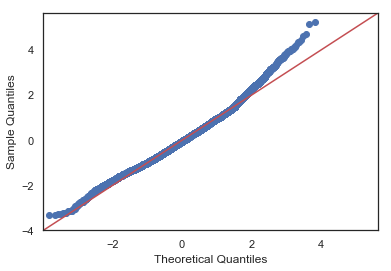

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['floors_2_5', 0.01130762279959463, -0.00909271831366356, 1.2526031327156408, 4.820985495203015e-40]
King City Real Estate: logprice~floors_3_0
----------------------------------------------


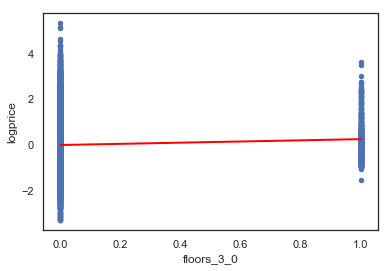

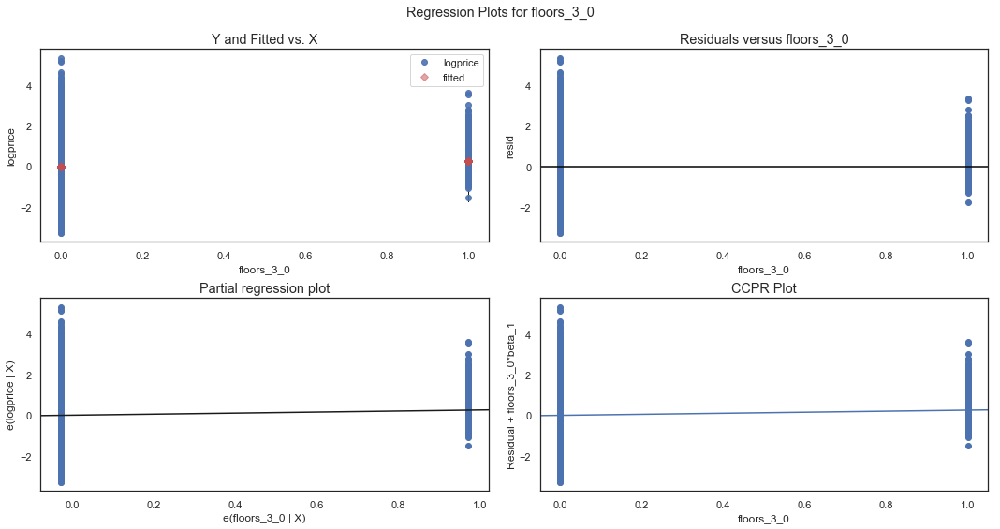

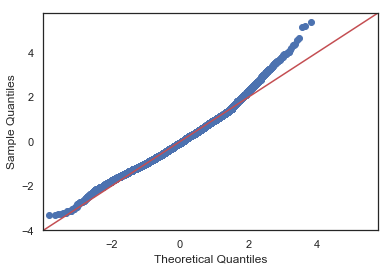

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['floors_3_0', 0.001770879887913912, -0.007090816119423077, 0.2568173753737448, 1.7040687416181338e-07]
King City Real Estate: logprice~floors_3_5
----------------------------------------------


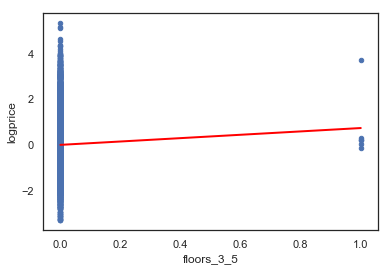

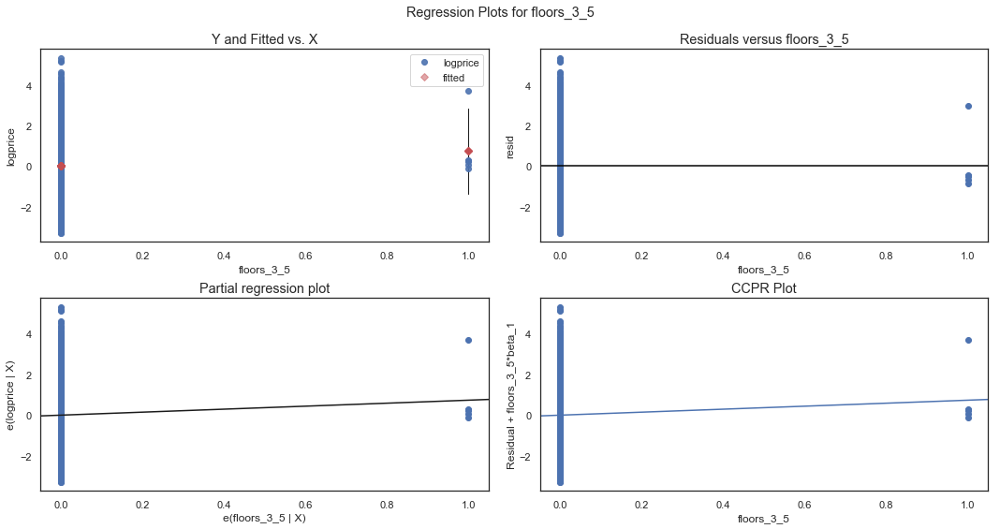

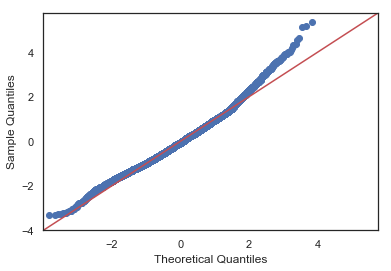

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['floors_3_5', 0.00021041329698268108, -0.00028609726883100164, 0.7356991272383699, 0.07158565572275122]
King City Real Estate: logprice~waterfront_0_0
----------------------------------------------


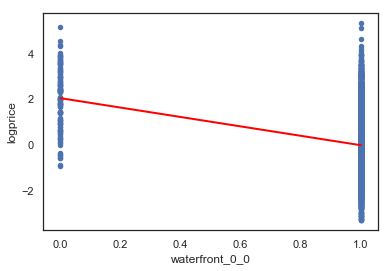

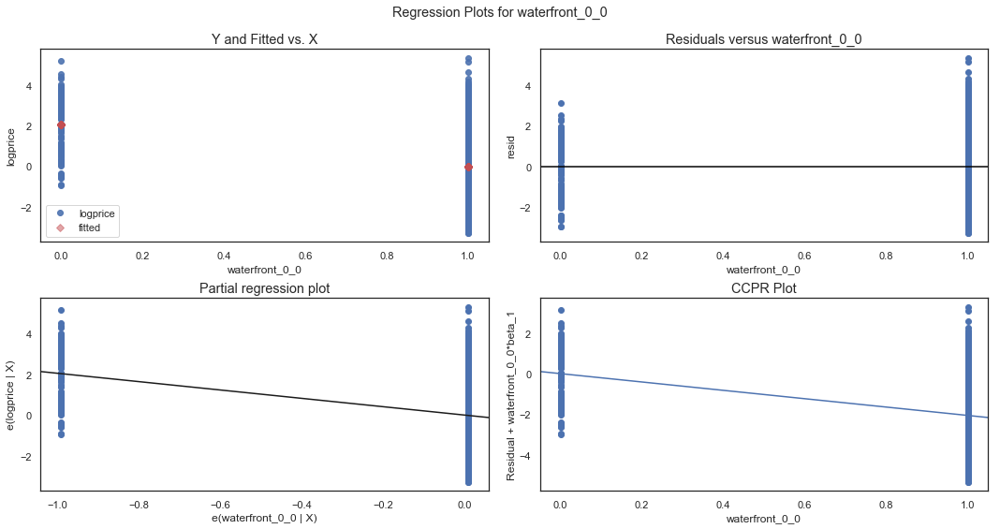

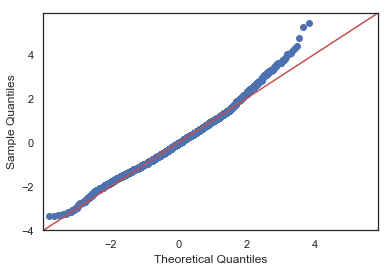

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['waterfront_0_0', 0.03158712494346483, 2.041935978378107, -2.057404180134082, 1.0845950584183308e-109]
King City Real Estate: logprice~waterfront_1_0
----------------------------------------------


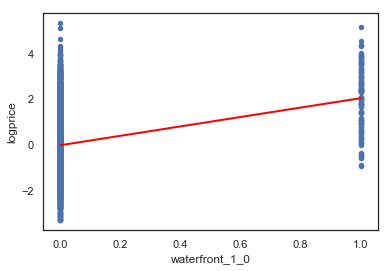

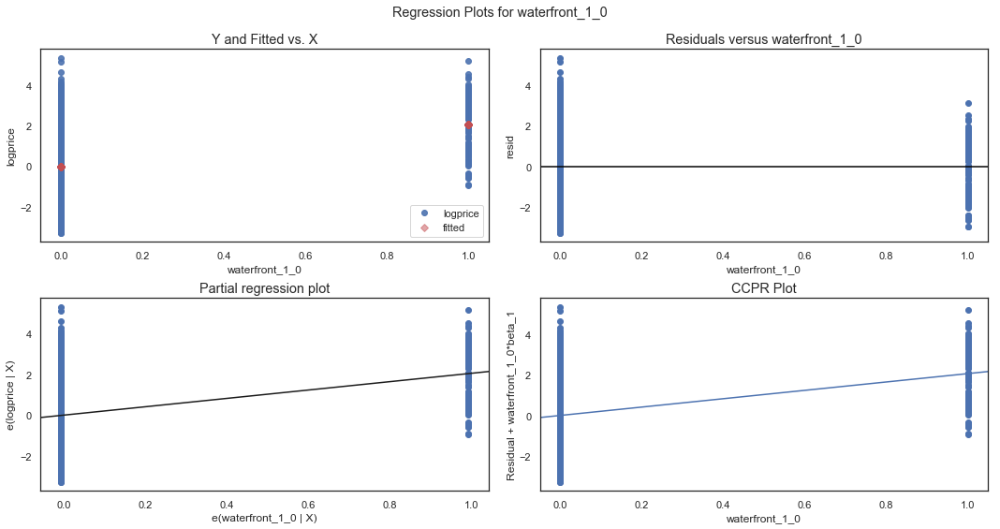

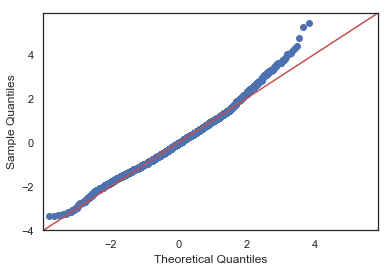

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['waterfront_1_0', 0.03158712494346483, -0.015468201755973578, 2.057404180134081, 1.084595058418238e-109]
King City Real Estate: logprice~view_0_0
----------------------------------------------


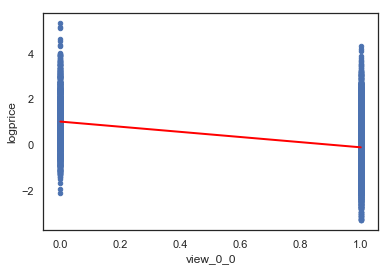

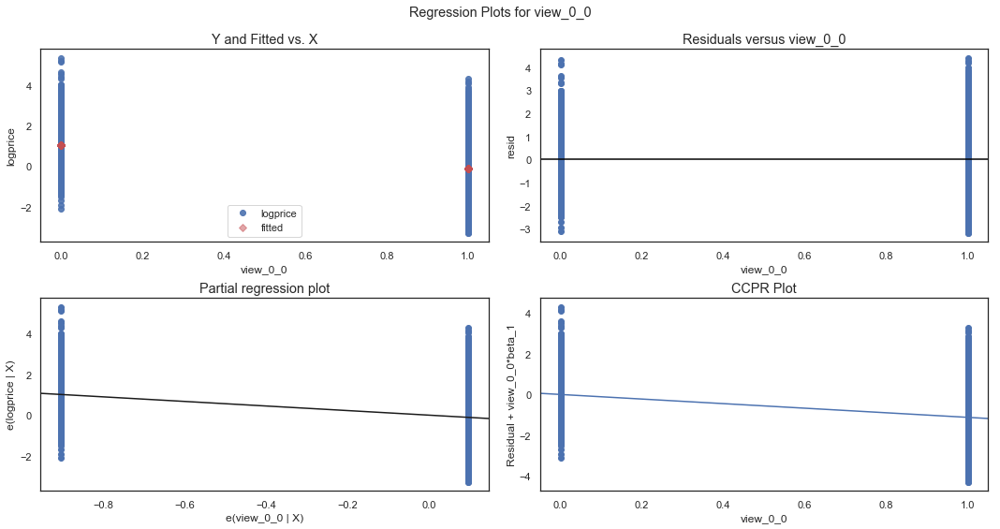

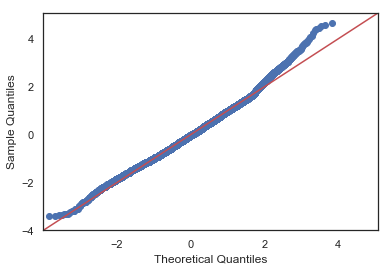

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['view_0_0', 0.11001726857941241, 1.0174958660552447, -1.1256143770964182, 0.0]
King City Real Estate: logprice~view_1_0
----------------------------------------------


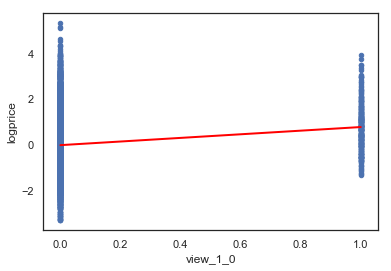

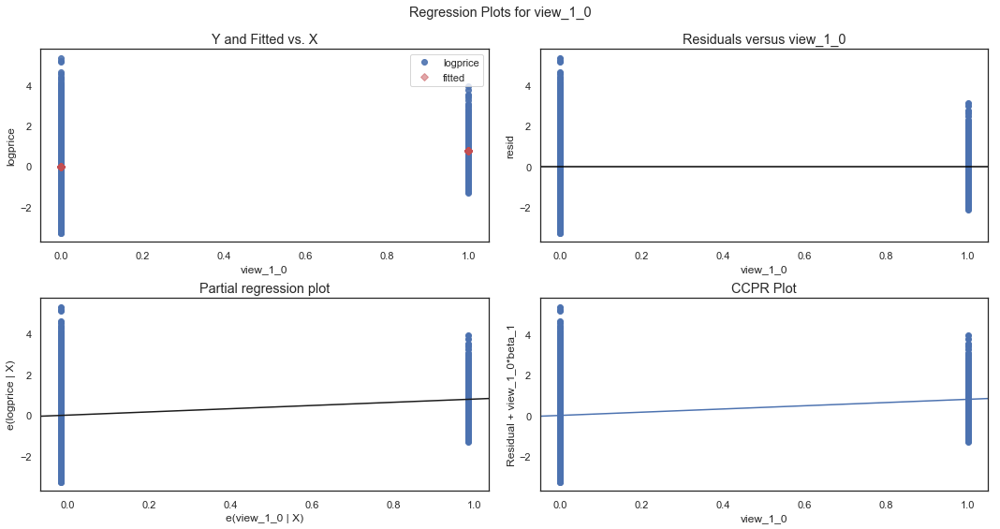

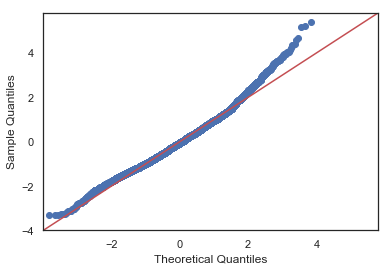

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['view_1_0', 0.009669813327832677, -0.012412711377645956, 0.7913872886294893, 1.8256150870482055e-34]
King City Real Estate: logprice~view_2_0
----------------------------------------------


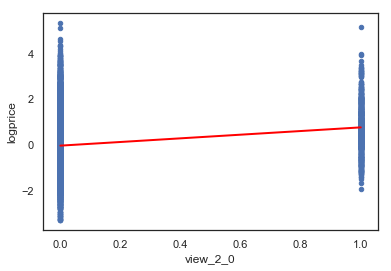

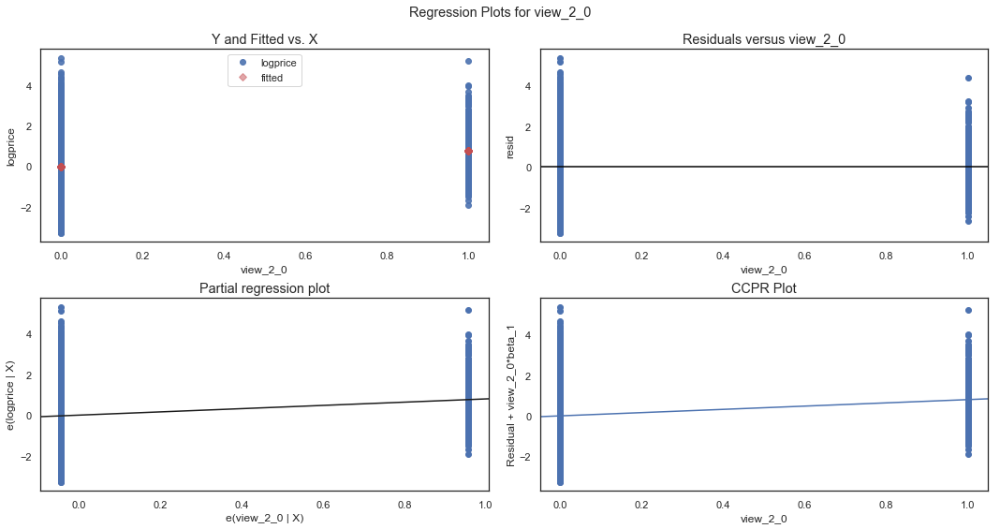

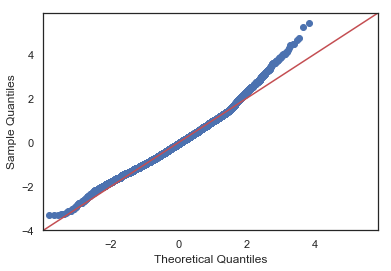

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['view_2_0', 0.026358668594357093, -0.03448239839276046, 0.7988422294362433, 1.2941824672114283e-91]
King City Real Estate: logprice~view_3_0
----------------------------------------------


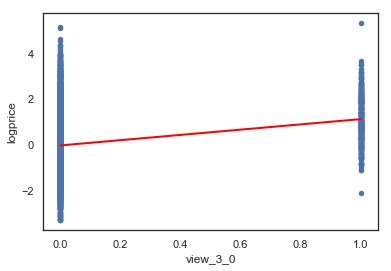

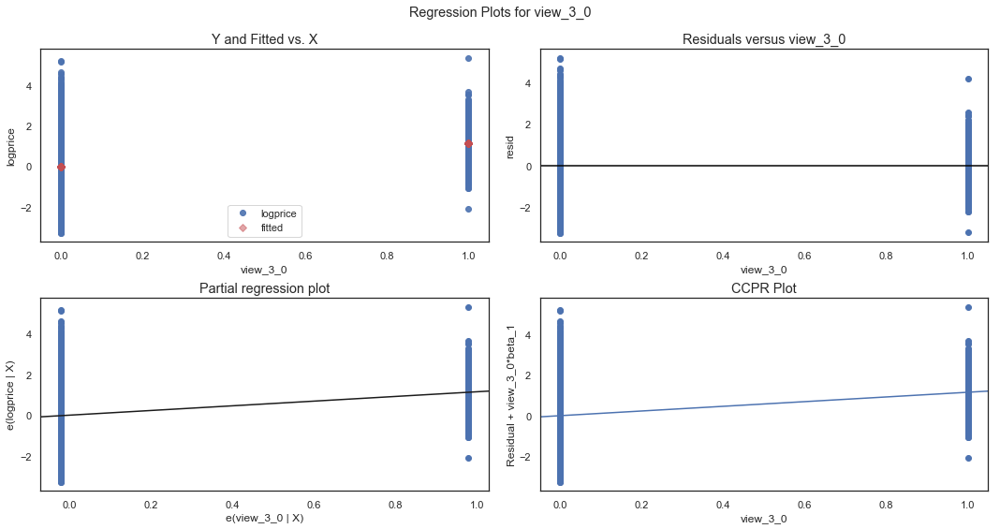

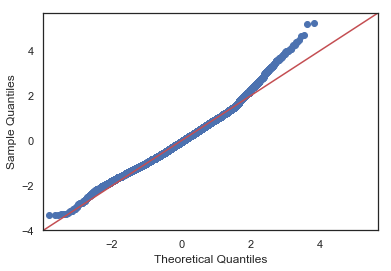

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['view_3_0', 0.02845965322576327, -0.025284592388573945, 1.1507845898700415, 7.226345871290294e-99]
King City Real Estate: logprice~view_4_0
----------------------------------------------


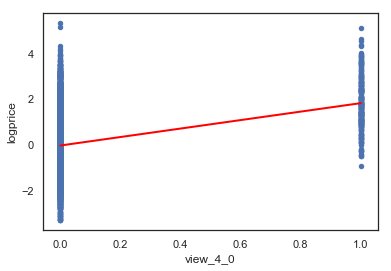

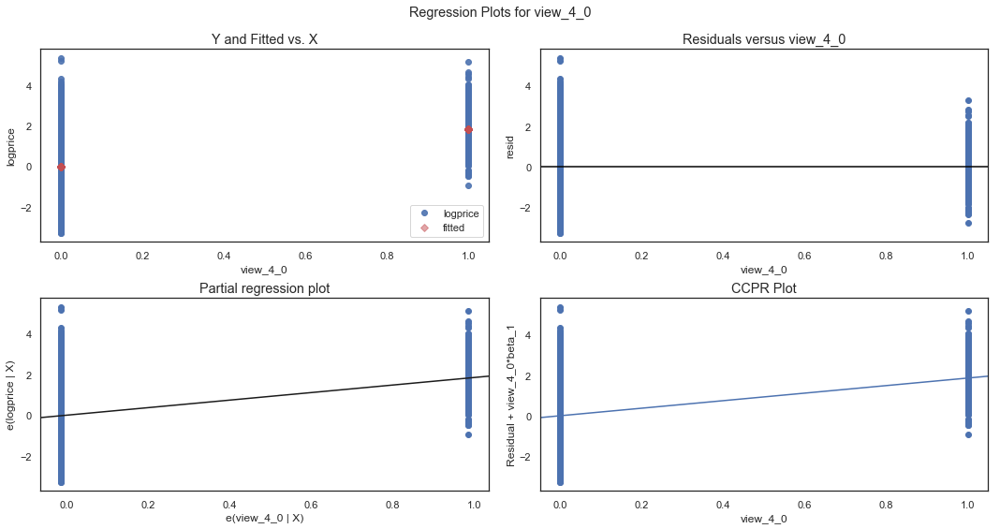

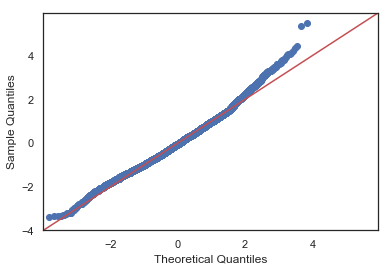

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['view_4_0', 0.05150100494885046, -0.028222250834217314, 1.8529408856330878, 2.114966645358577e-179]
King City Real Estate: logprice~condition_1
----------------------------------------------


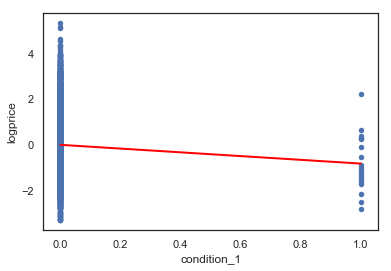

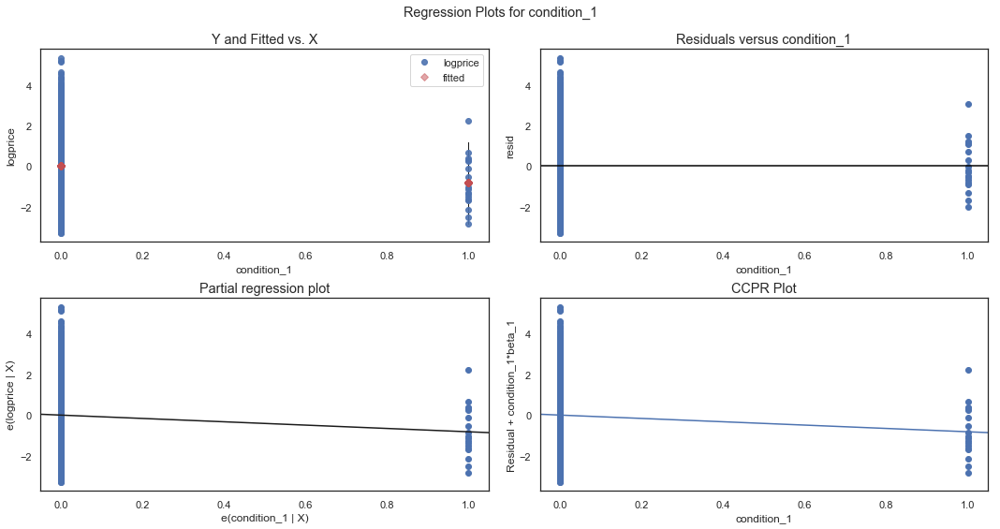

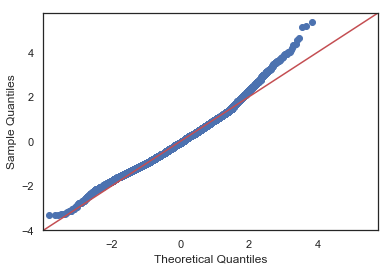

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['condition_1', 0.0007843165832236432, 0.0009570893128603101, -0.8203850558602765, 0.0005031358085760627]
King City Real Estate: logprice~condition_2
----------------------------------------------


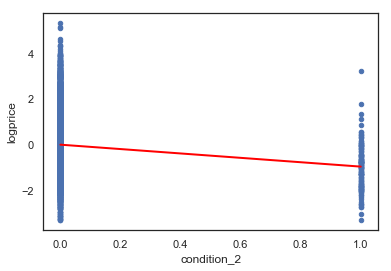

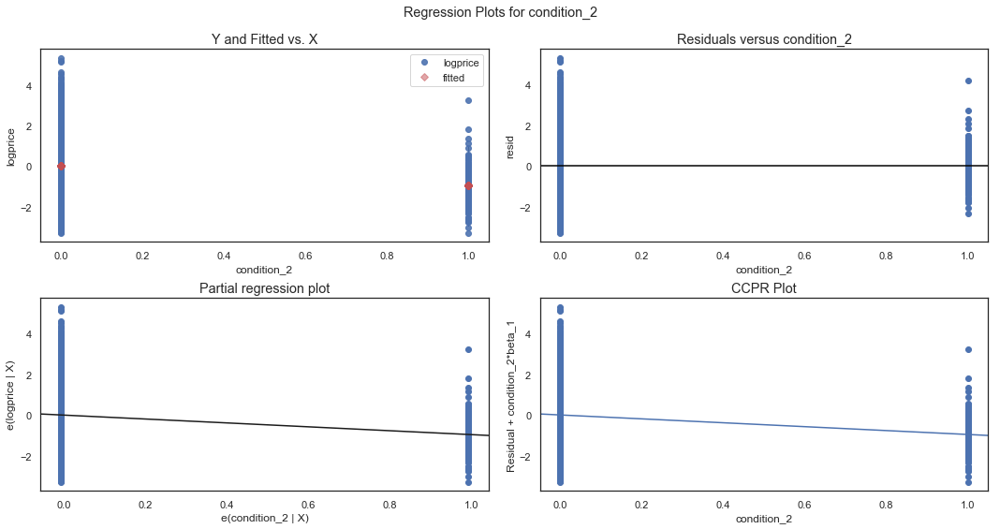

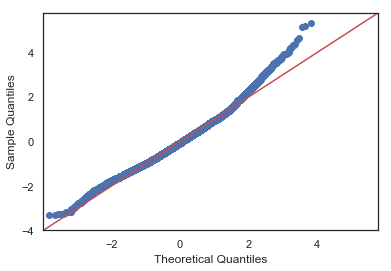

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['condition_2', 0.007523344415144684, 0.007901674933227978, -0.9599601774971468, 3.6981669785313564e-27]
King City Real Estate: logprice~condition_3
----------------------------------------------


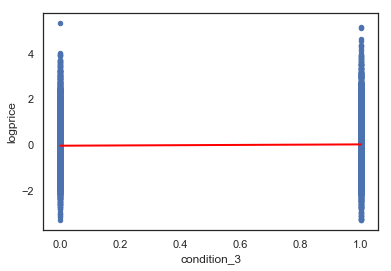

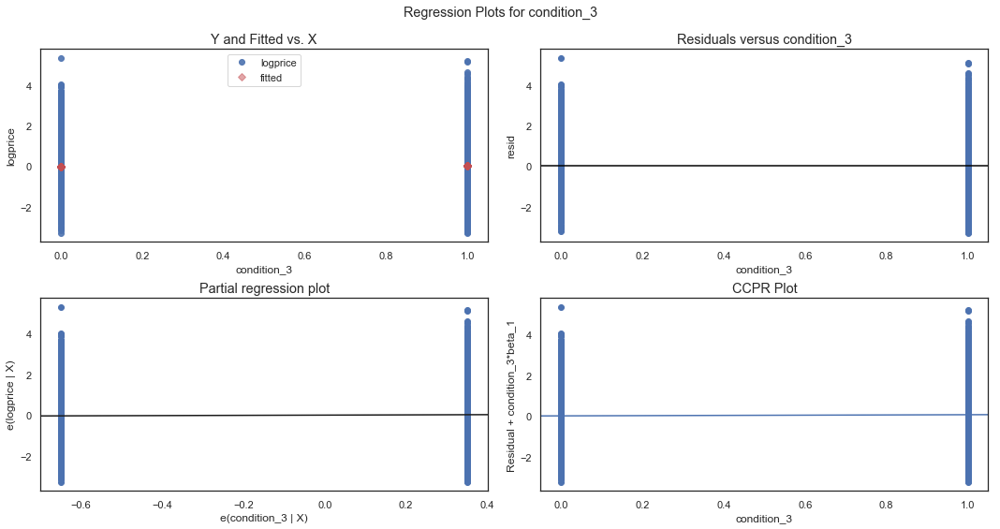

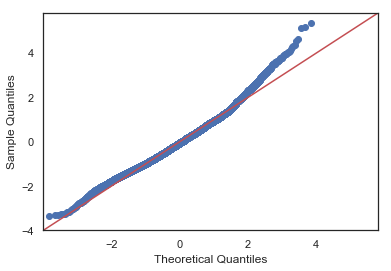

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['condition_3', 0.0007448301066368401, -0.03708602086906648, 0.057168569886248674, 0.0006980608028008341]
King City Real Estate: logprice~condition_4
----------------------------------------------


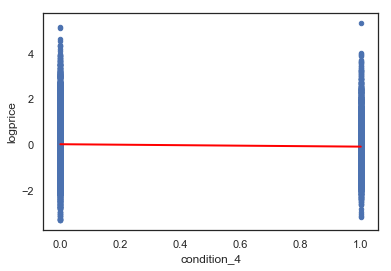

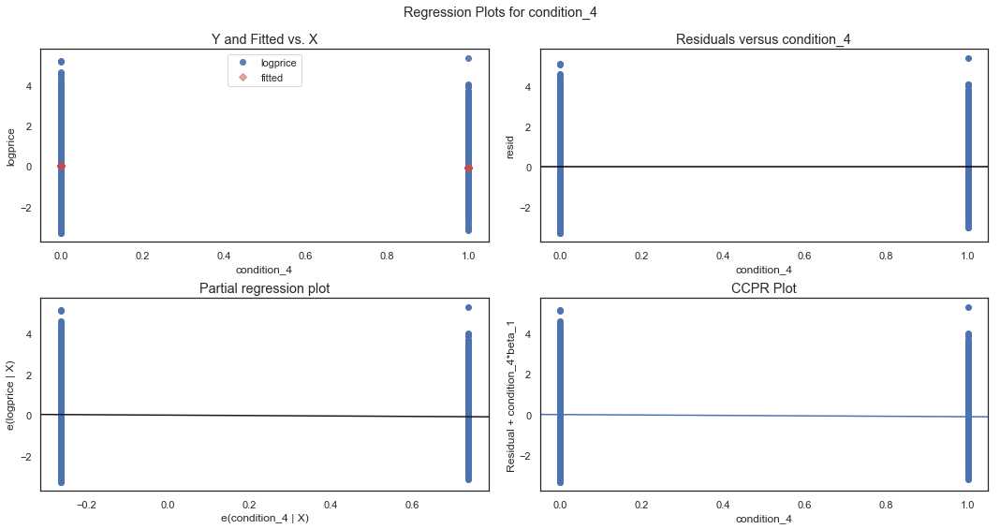

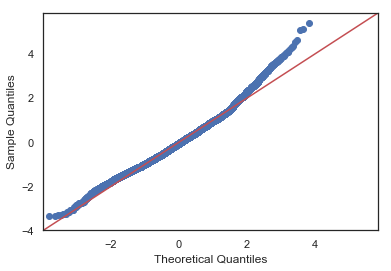

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['condition_4', 0.0021584599936991244, 0.02769762293551025, -0.10562200303246447, 7.763487974102138e-09]
King City Real Estate: logprice~condition_5
----------------------------------------------


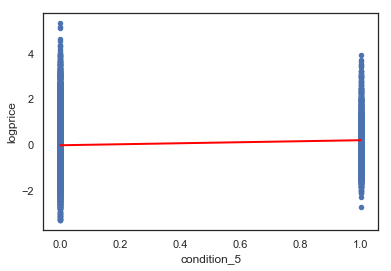

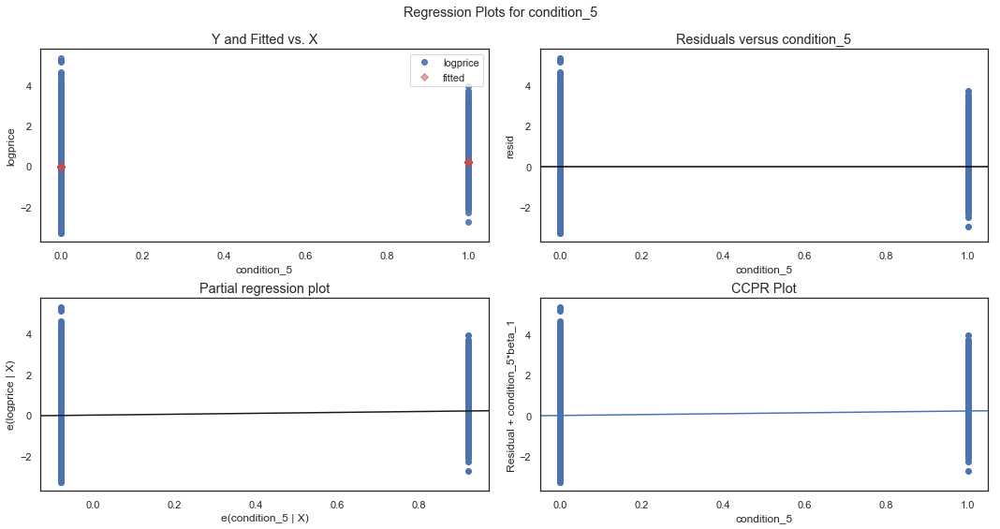

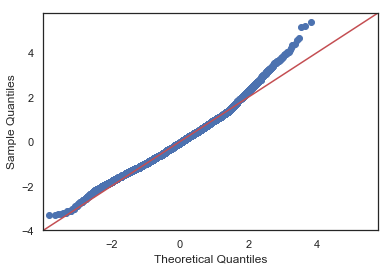

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['condition_5', 0.0035797180807429774, -0.017601193097378037, 0.22096729723521757, 1.0233789711273589e-13]
King City Real Estate: logprice~grade_10
----------------------------------------------


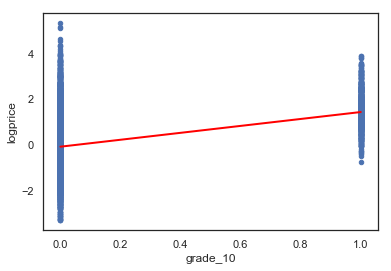

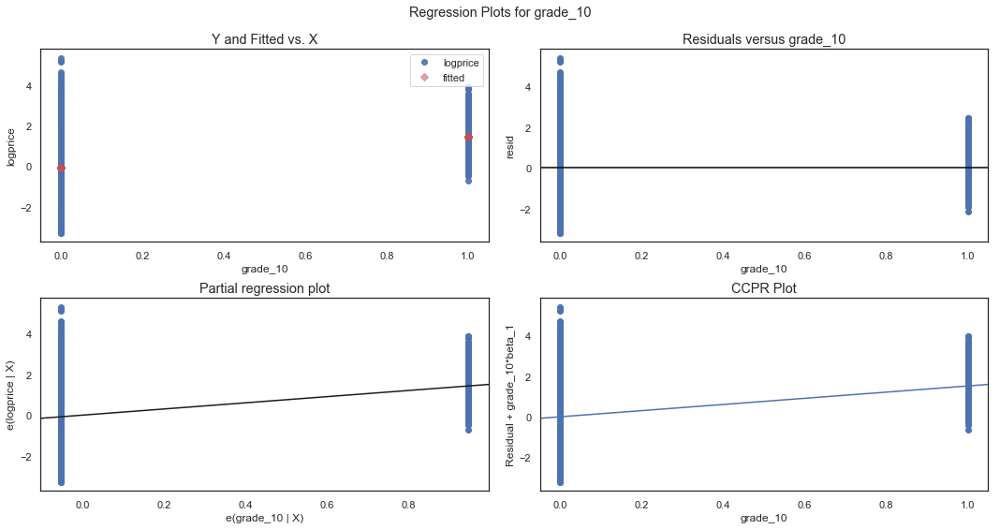

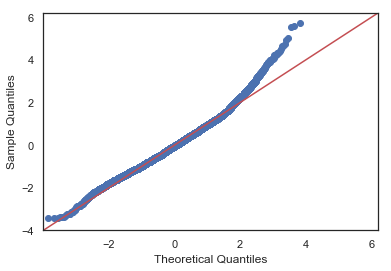

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_10', 0.1150715361294411, -0.08015770384756593, 1.5156289370915819, 0.0]
King City Real Estate: logprice~grade_11
----------------------------------------------


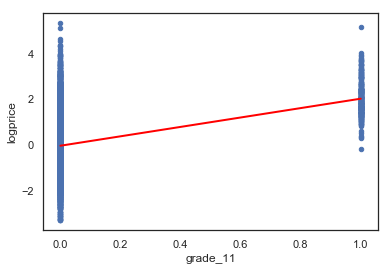

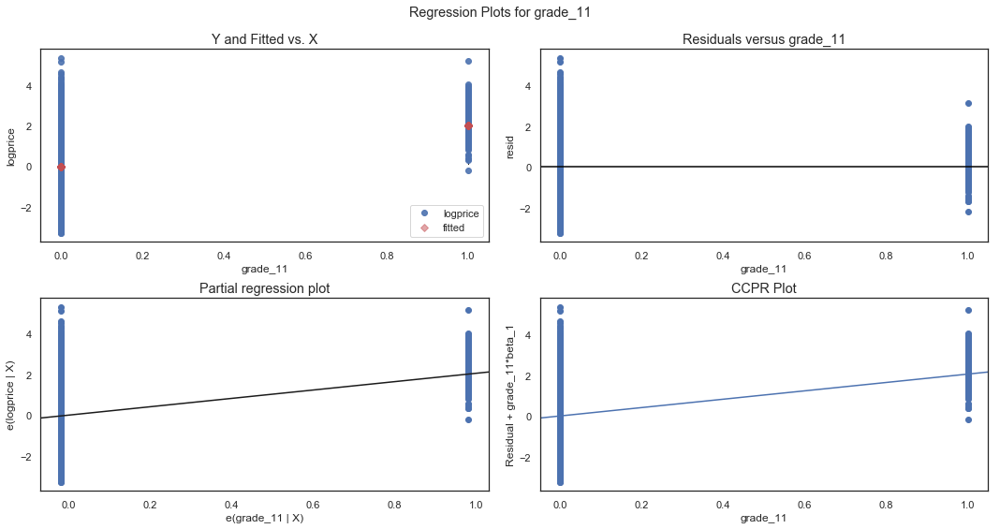

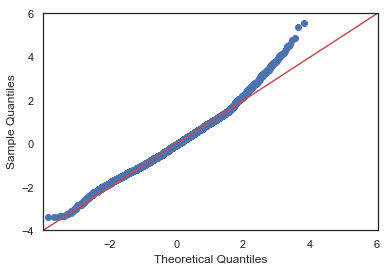

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_11', 0.0770383354801989, -0.038143138626197726, 2.0577289715602856, 6.431106212144285e-271]
King City Real Estate: logprice~grade_12
----------------------------------------------


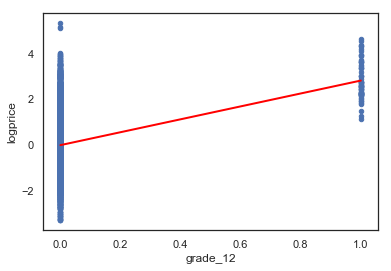

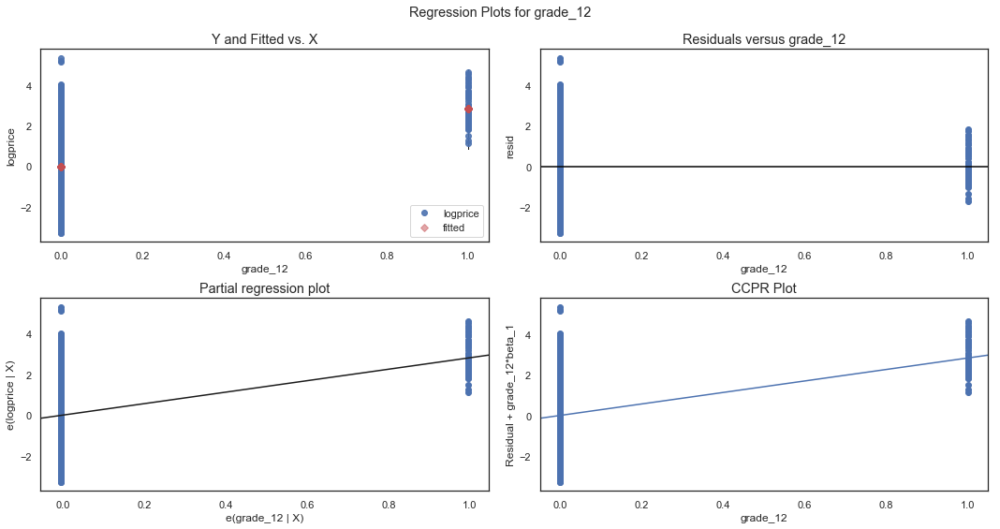

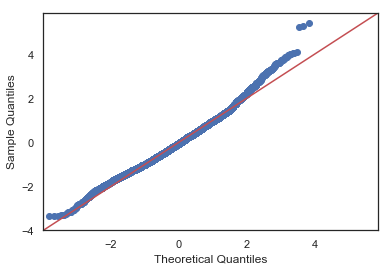

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_12', 0.03397044573758845, -0.012080099203267953, 2.823997736513002, 5.8209955078930955e-118]
King City Real Estate: logprice~grade_13
----------------------------------------------


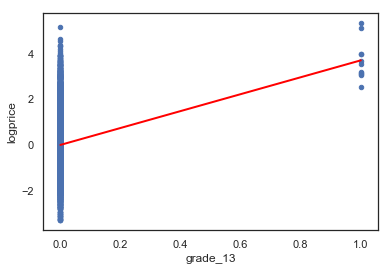

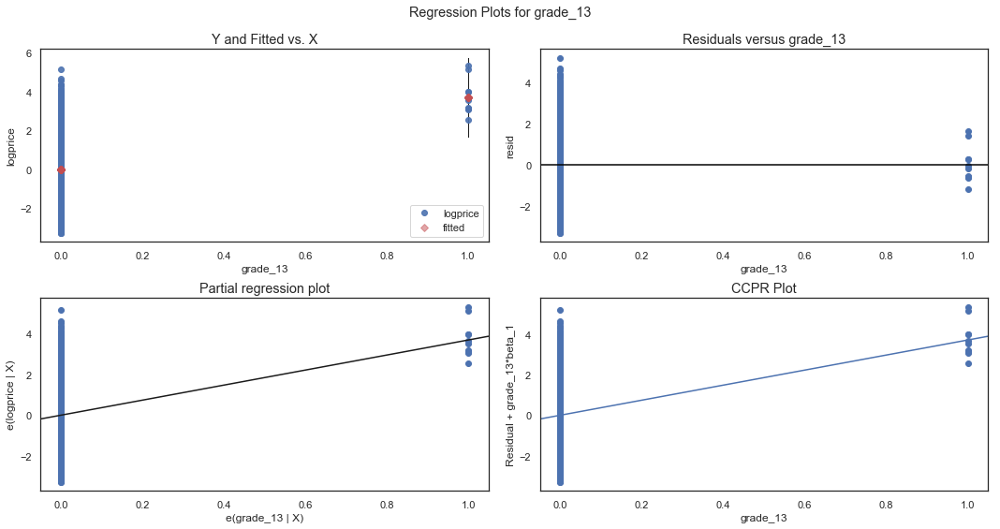

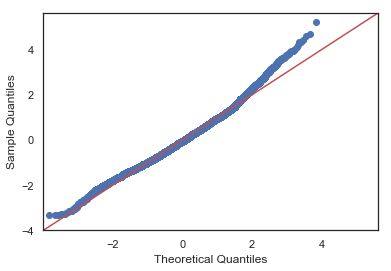

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_13', 0.00974894181053143, -0.002637223800665103, 3.6990660020998765, 9.817220391608724e-35]
King City Real Estate: logprice~grade_3
----------------------------------------------


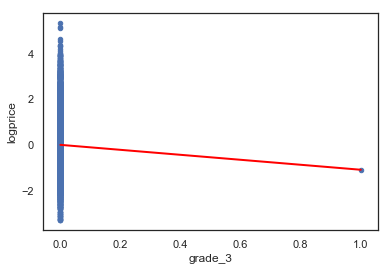

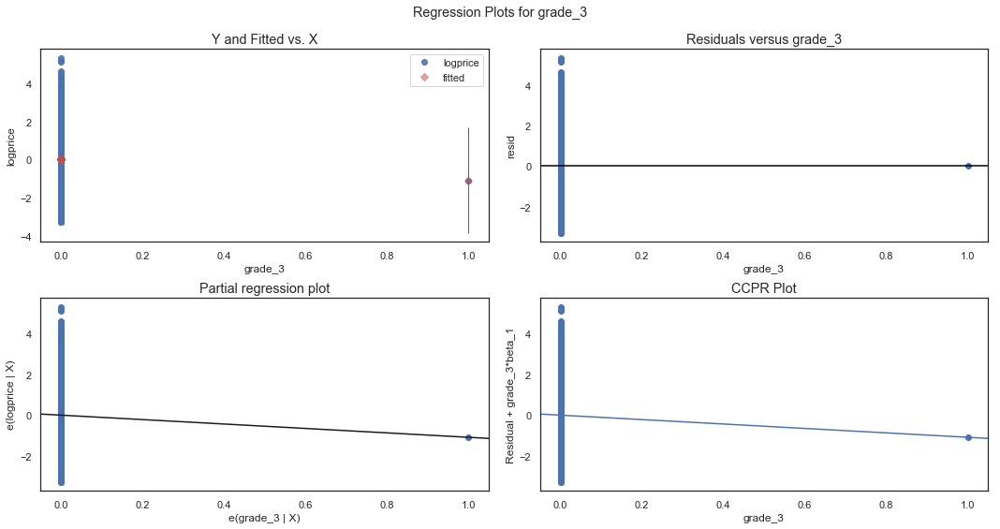

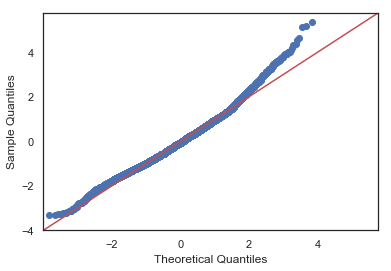

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_3', 7.687376599063711e-05, 7.058626304285755e-05, -1.0890754498514268, 0.27615029462929613]
King City Real Estate: logprice~grade_4
----------------------------------------------


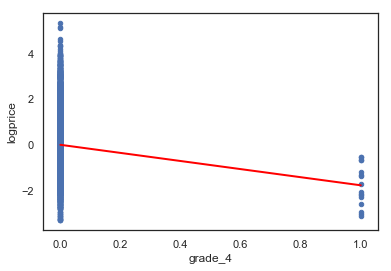

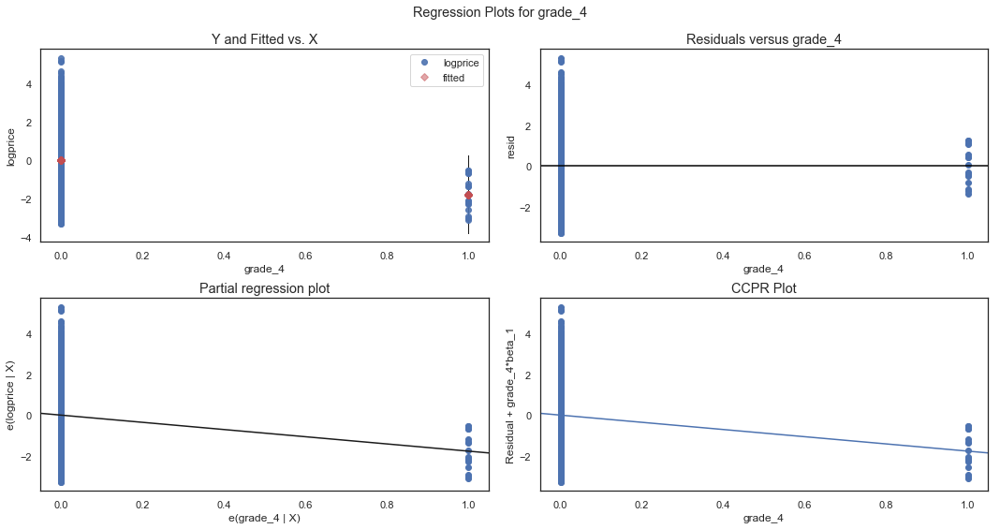

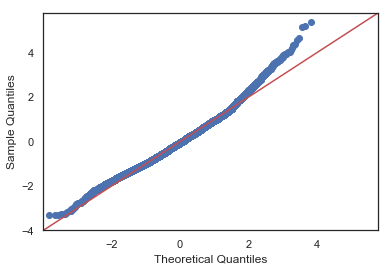

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_4', 0.0032498161335838827, 0.001836672497736589, -1.7711262478088325, 1.3779557268020435e-12]
King City Real Estate: logprice~grade_5
----------------------------------------------


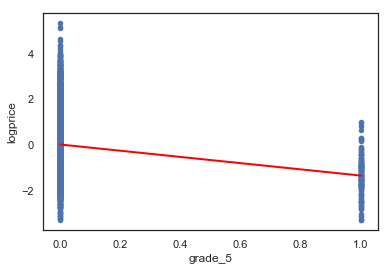

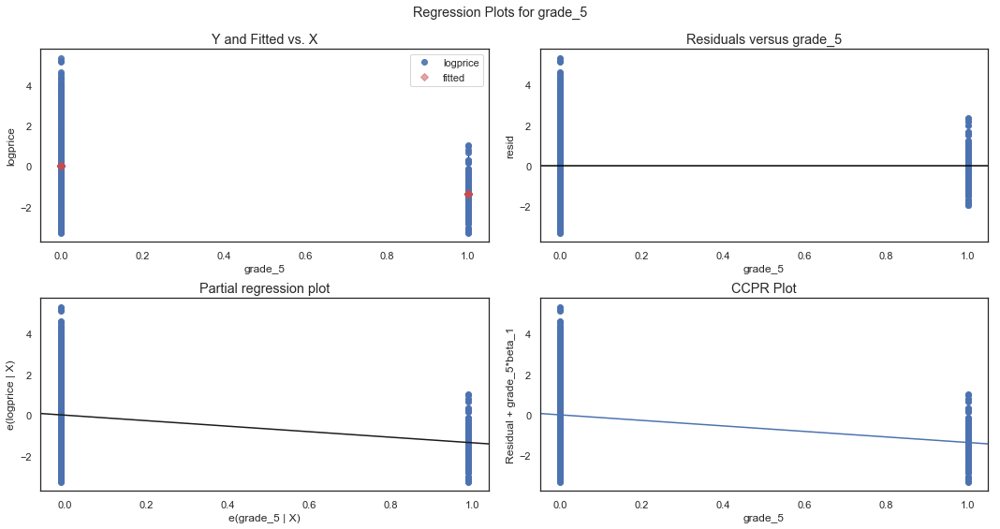

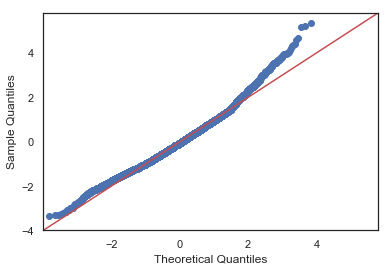

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_5', 0.0190416320884228, 0.014169674463752698, -1.3579124676931926, 1.833249944497296e-66]
King City Real Estate: logprice~grade_6
----------------------------------------------


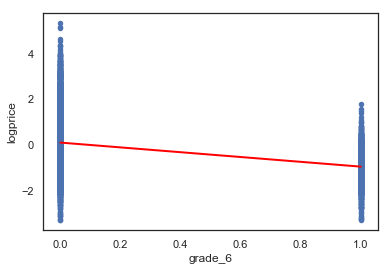

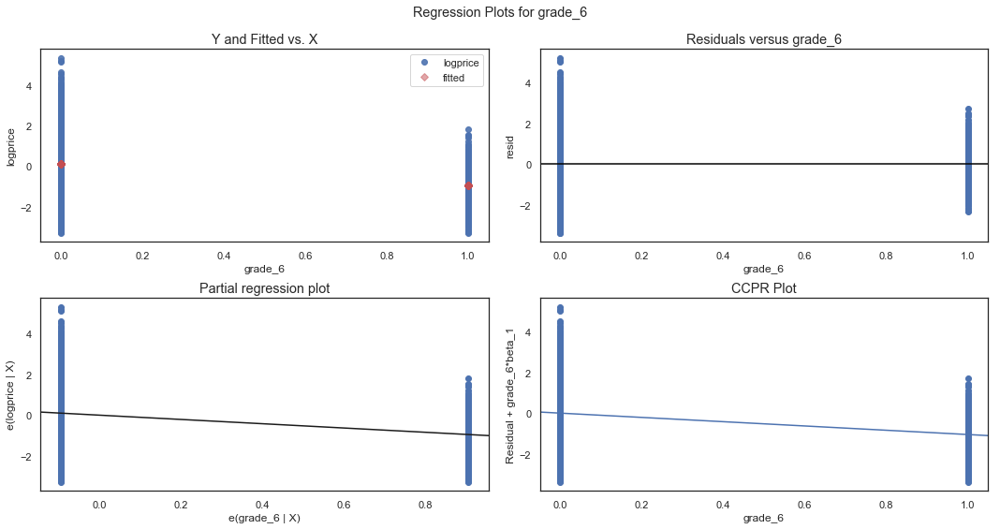

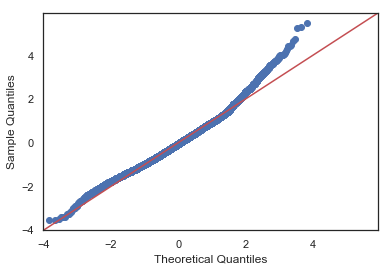

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_6', 0.09446488941880304, 0.09913509584770169, -1.0519638196915773, 0.0]
King City Real Estate: logprice~grade_7
----------------------------------------------


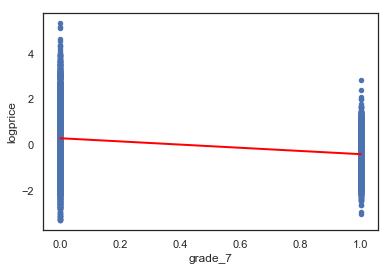

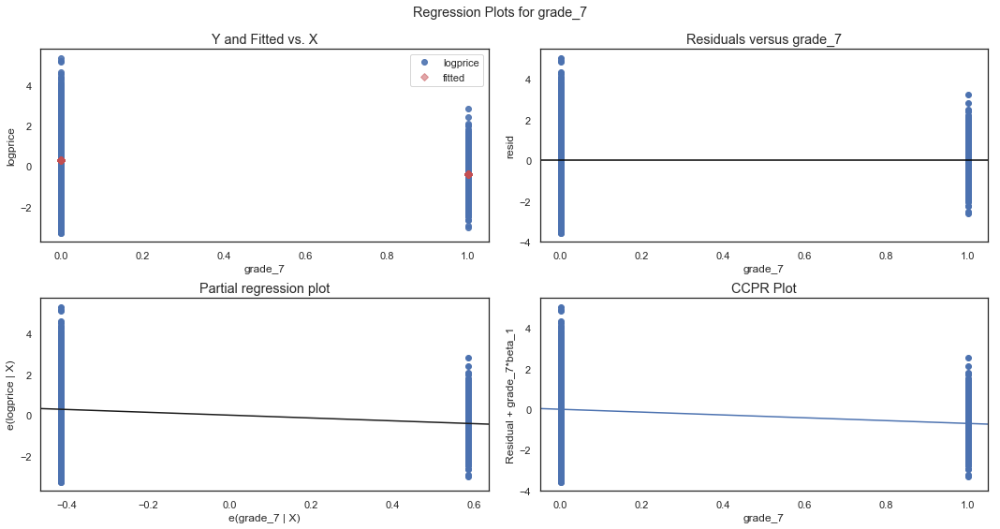

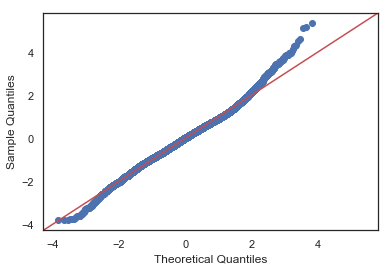

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_7', 0.11797280985641734, 0.28935894414781305, -0.6970365572605735, 0.0]
King City Real Estate: logprice~grade_8
----------------------------------------------


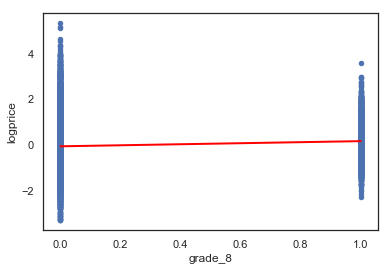

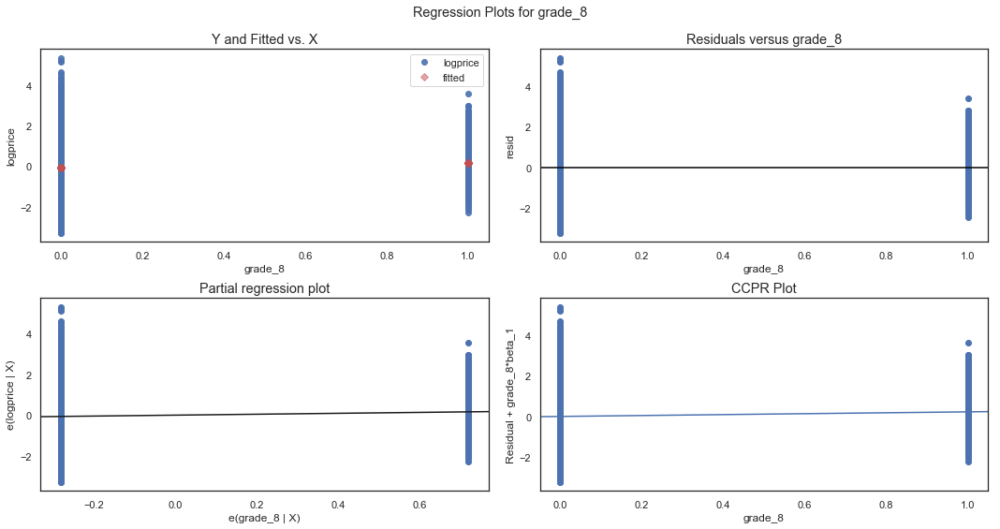

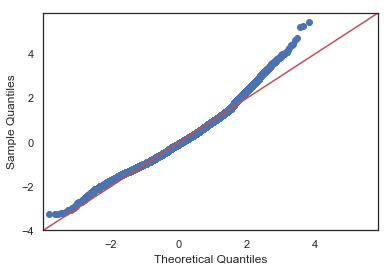

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_8', 0.010323181238898749, -0.06354071870804223, 0.2259957927498894, 1.0878080543763422e-36]
King City Real Estate: logprice~grade_9
----------------------------------------------


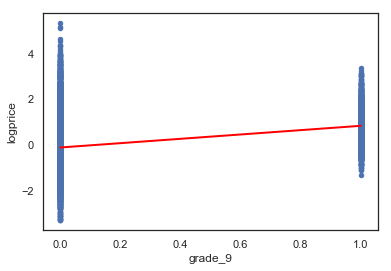

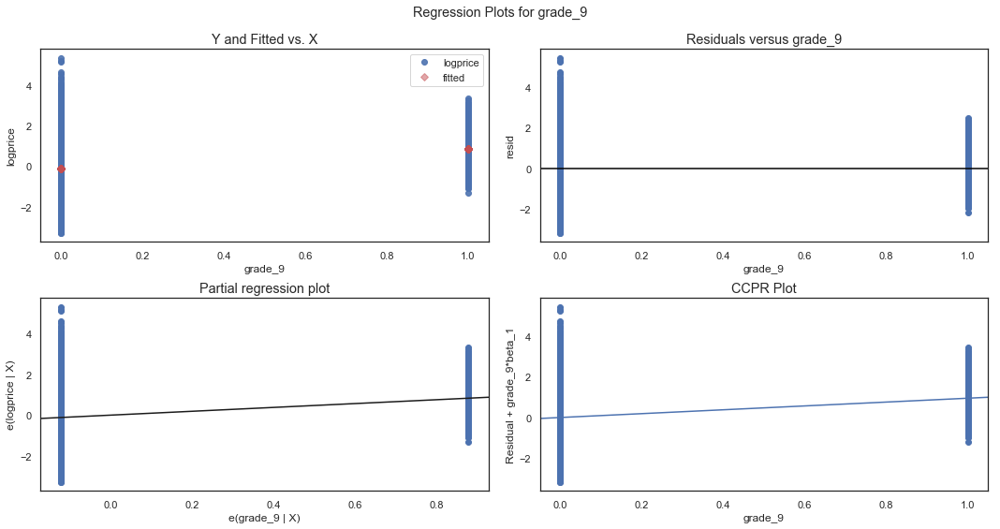

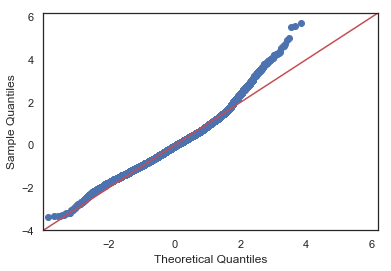

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['grade_9', 0.09606087662350282, -0.1152726012890066, 0.9485551814883852, 0.0]
King City Real Estate: logprice~Built_binned__1899_999__1910_0_
----------------------------------------------


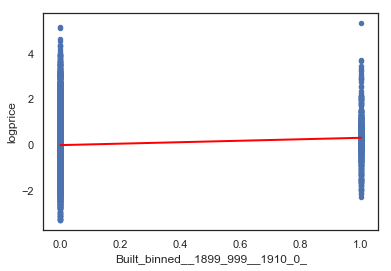

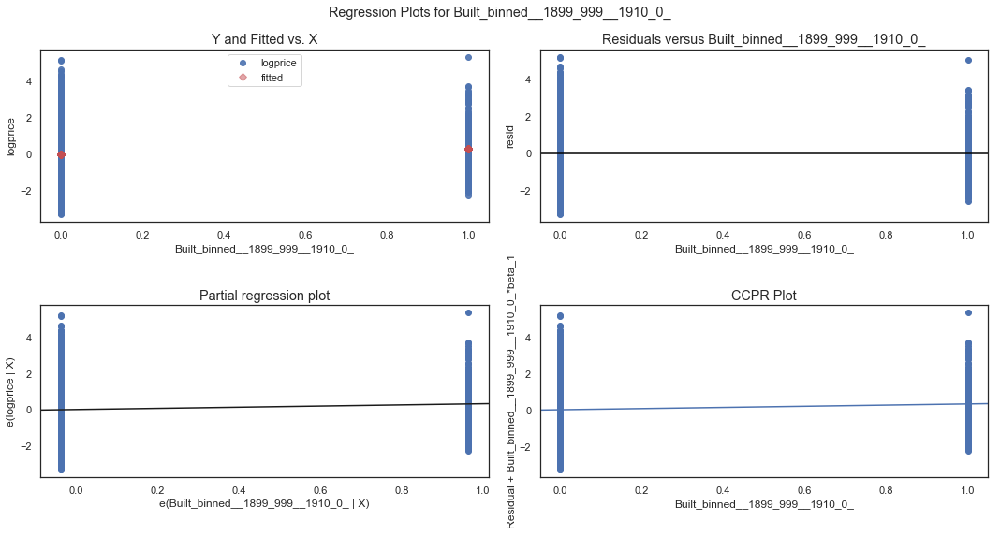

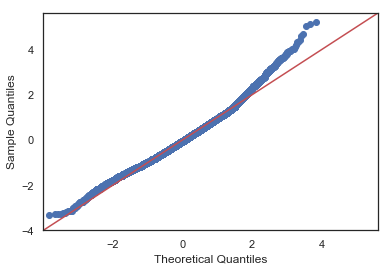

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__1899_999__1910_0_', 0.0035828671886956043, -0.011615941422244317, 0.32003992894007927, 9.983083350835892e-14]
King City Real Estate: logprice~Built_binned__1910_0__1920_0_
----------------------------------------------


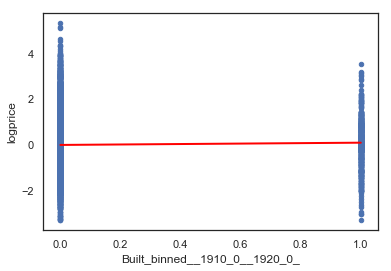

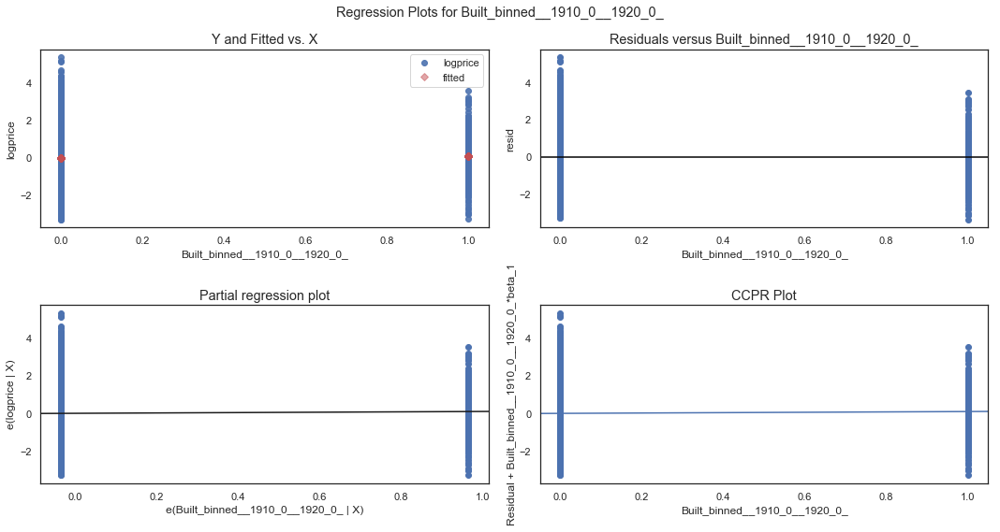

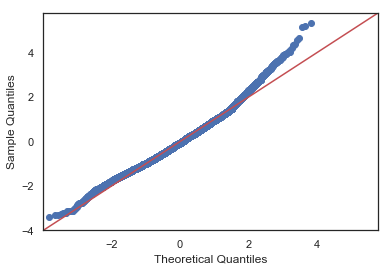

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__1910_0__1920_0_', 0.0003249382992227545, -0.00342292202660246, 0.09834686024410855, 0.02515076925977313]
King City Real Estate: logprice~Built_binned__1920_0__1930_0_
----------------------------------------------


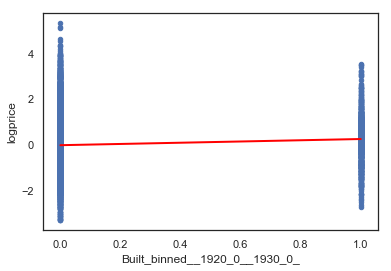

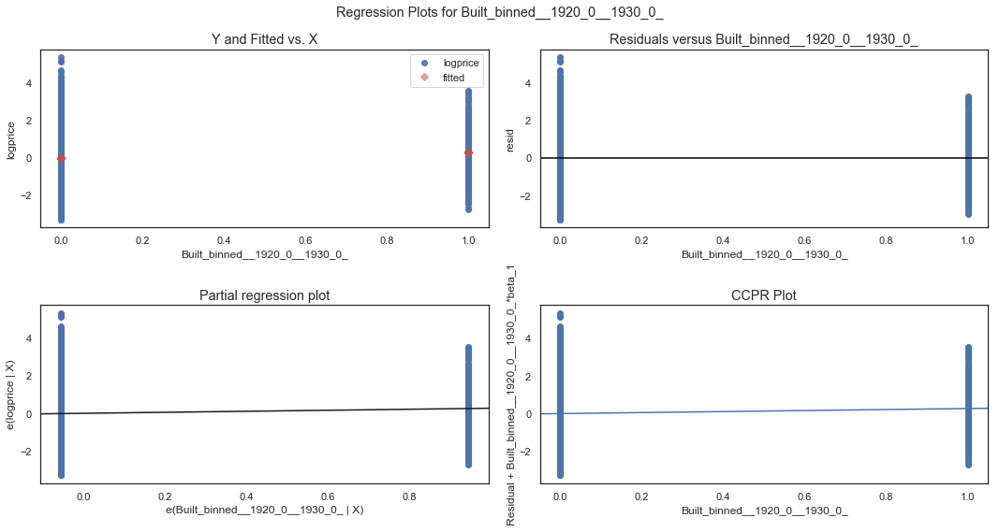

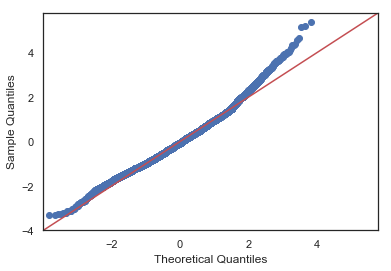

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__1920_0__1930_0_', 0.0037808525421100247, -0.014809573075464738, 0.2700909018723192, 2.1002759966109514e-14]
King City Real Estate: logprice~Built_binned__1930_0__1940_0_
----------------------------------------------


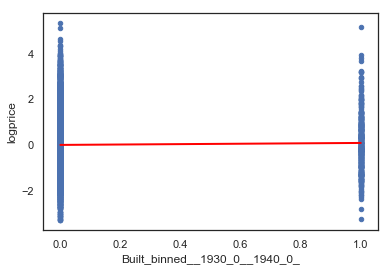

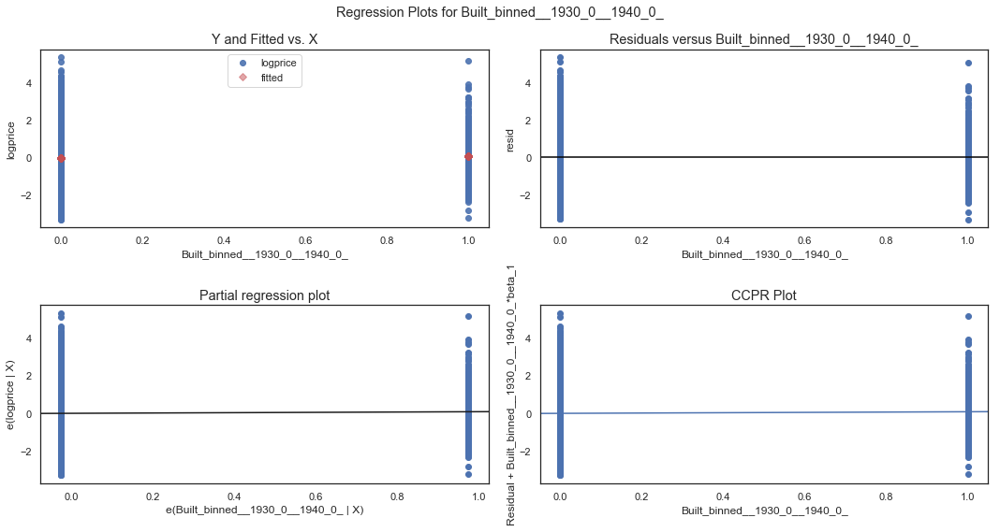

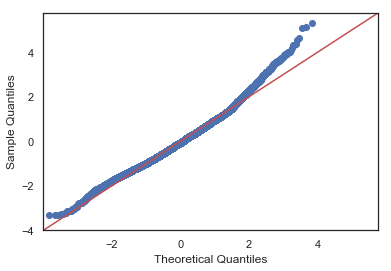

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__1930_0__1940_0_', 0.00019239284707150972, -0.002300267176292864, 0.08593419434784305, 0.08491451615994962]
King City Real Estate: logprice~Built_binned__1940_0__1950_0_
----------------------------------------------


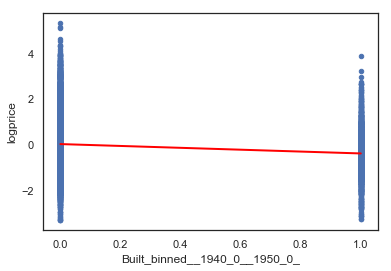

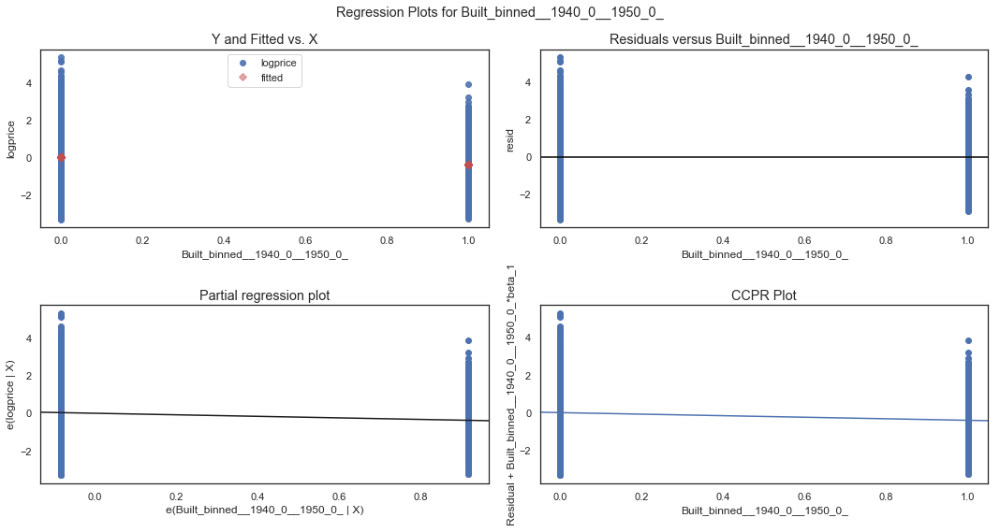

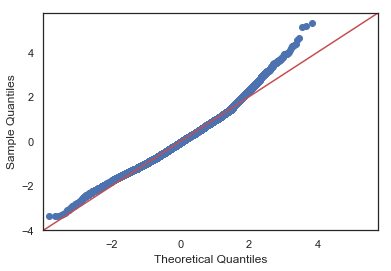

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__1940_0__1950_0_', 0.0127549695308663, 0.03395335471714592, -0.40959054724644856, 5.619541852576399e-45]
King City Real Estate: logprice~Built_binned__1950_0__1960_0_
----------------------------------------------


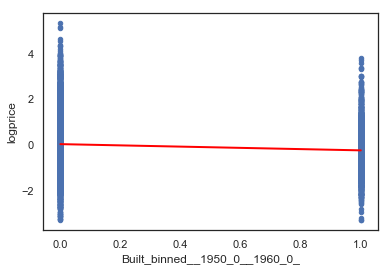

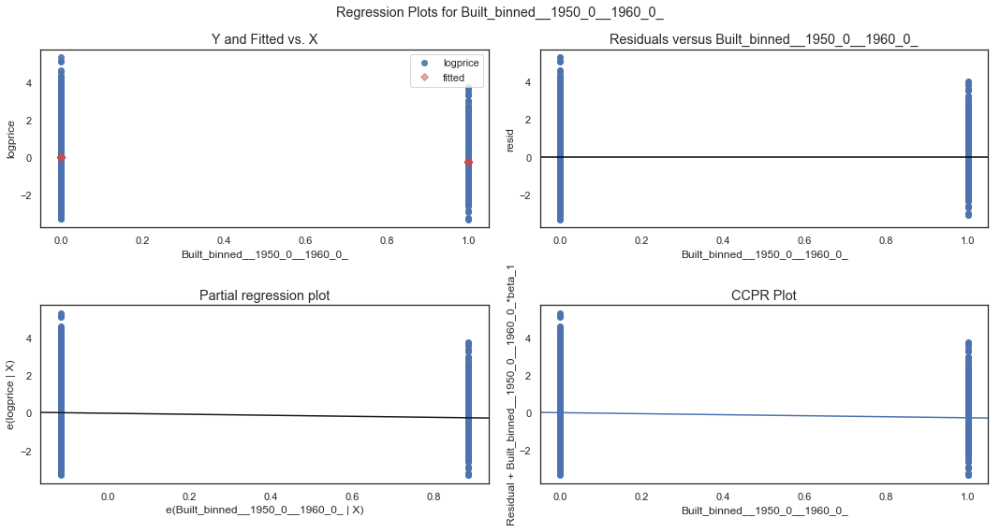

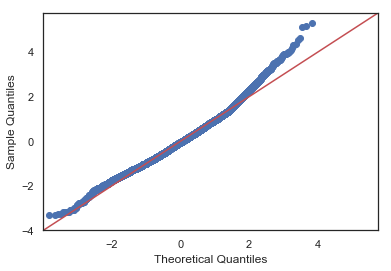

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__1950_0__1960_0_', 0.007632489003168819, 0.03168857190089171, -0.27253231653078125, 1.5721414920369077e-27]
King City Real Estate: logprice~Built_binned__1960_0__1970_0_
----------------------------------------------


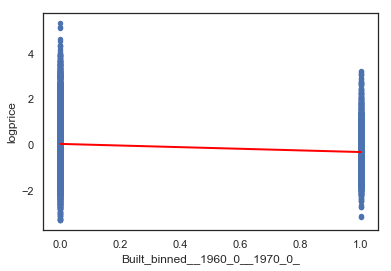

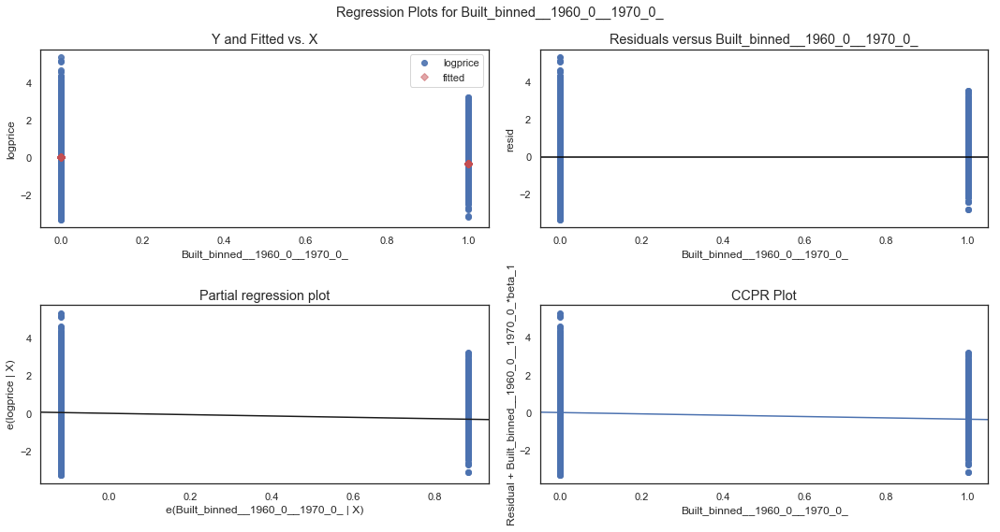

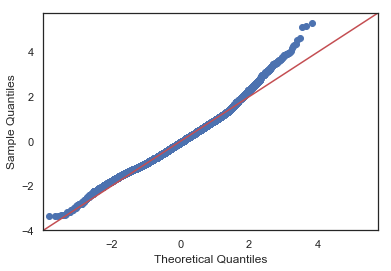

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__1960_0__1970_0_', 0.013071448520089901, 0.04156124779872882, -0.356051356071044, 4.681433247984385e-46]
King City Real Estate: logprice~Built_binned__1970_0__1980_0_
----------------------------------------------


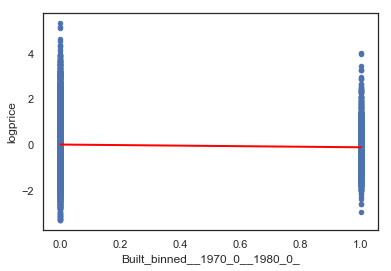

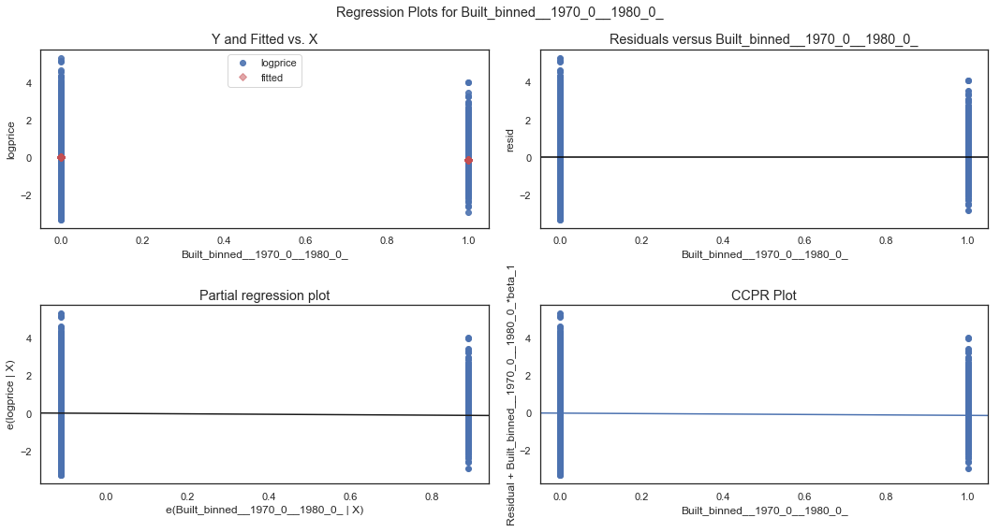

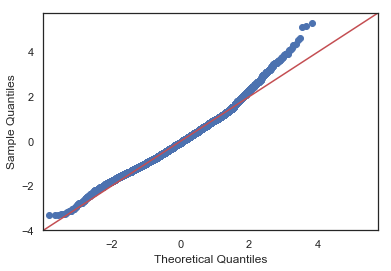

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__1970_0__1980_0_', 0.0014120837813184073, 0.01334044587709993, -0.11918340442104121, 3.0277286363746485e-06]
King City Real Estate: logprice~Built_binned__1980_0__1990_0_
----------------------------------------------


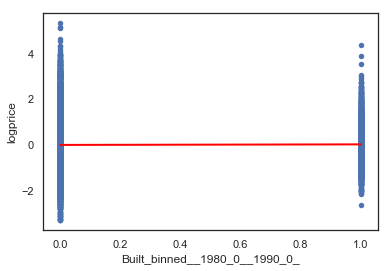

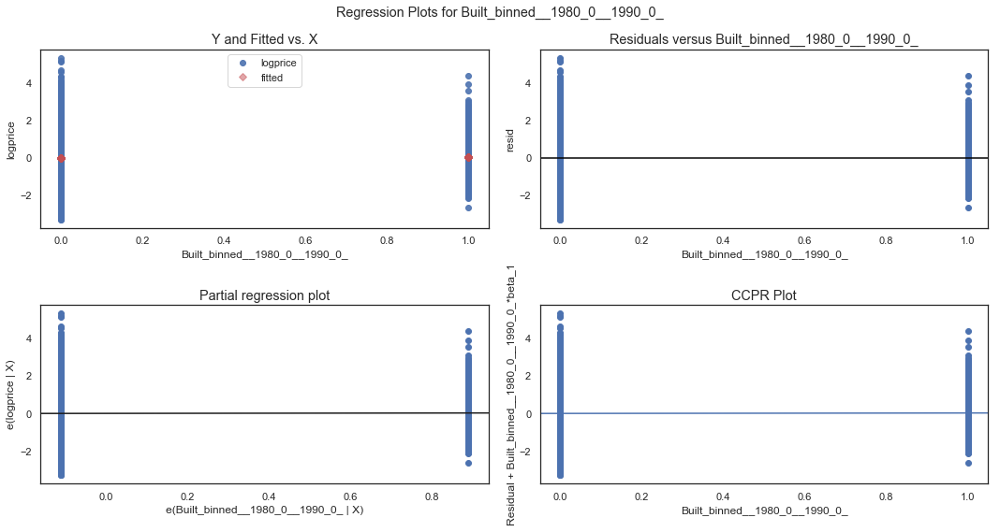

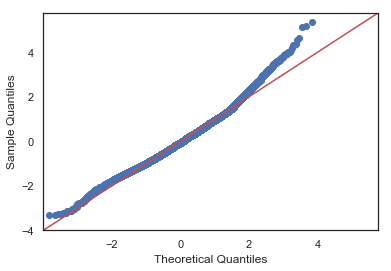

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__1980_0__1990_0_', 5.4813786071639115e-05, -0.002602584563573866, 0.023662508682391253, 0.35779777646453526]
King City Real Estate: logprice~Built_binned__1990_0__2000_0_
----------------------------------------------


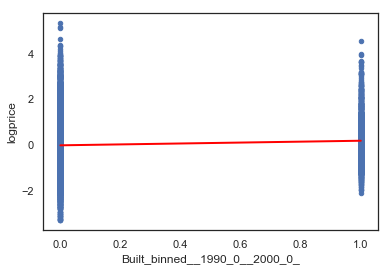

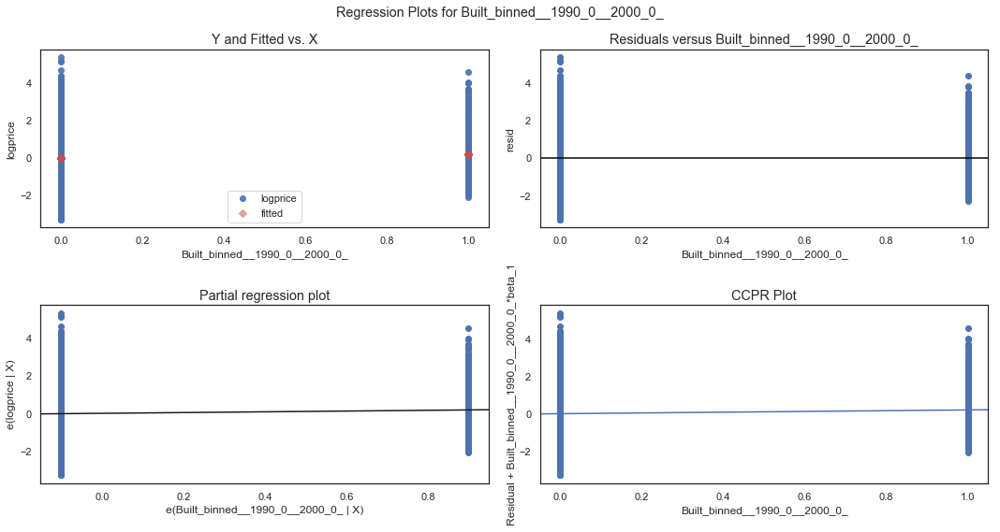

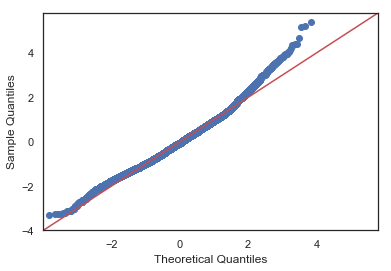

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__1990_0__2000_0_', 0.0036616725631091196, -0.020322826799729788, 0.20048650555988978, 5.3671503240120526e-14]
King City Real Estate: logprice~Built_binned__2000_0__2010_0_
----------------------------------------------


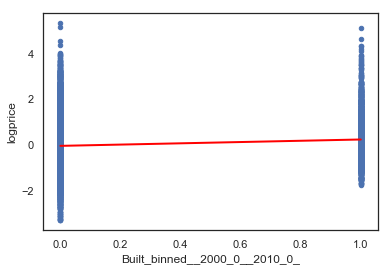

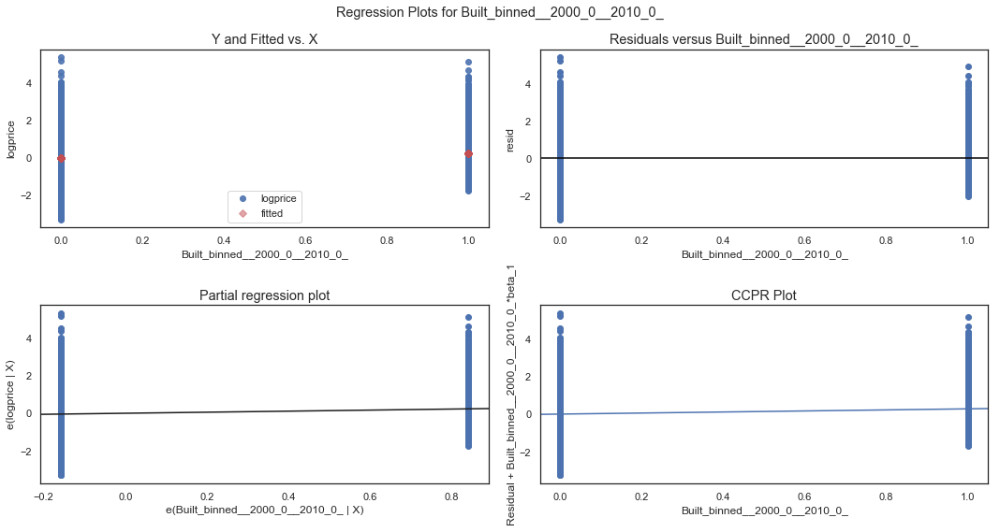

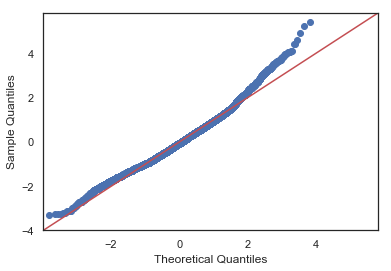

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__2000_0__2010_0_', 0.010327351429292642, -0.044044071428207404, 0.2785065483887084, 1.0528100968177424e-36]
King City Real Estate: logprice~Built_binned__2010_0__2020_0_
----------------------------------------------


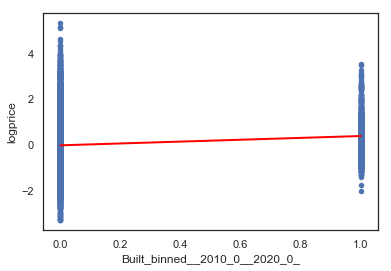

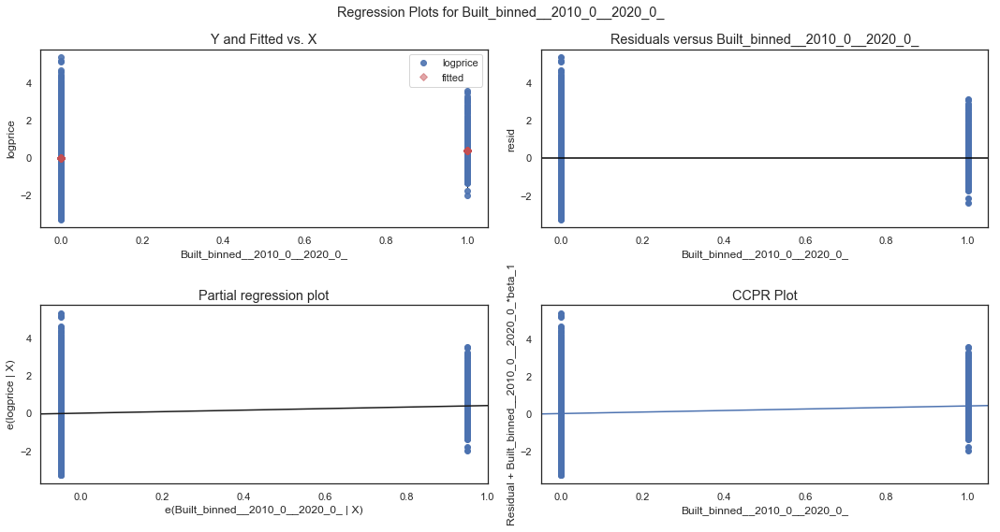

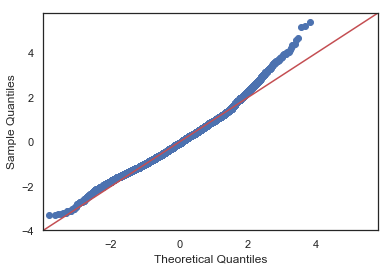

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['Built_binned__2010_0__2020_0_', 0.007852953576589106, -0.020323208418877928, 0.4067014042769187, 2.793211051276023e-28]
King City Real Estate: logprice~Built_binned__2020_0__2040_0_
----------------------------------------------


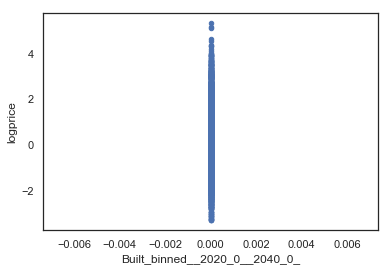

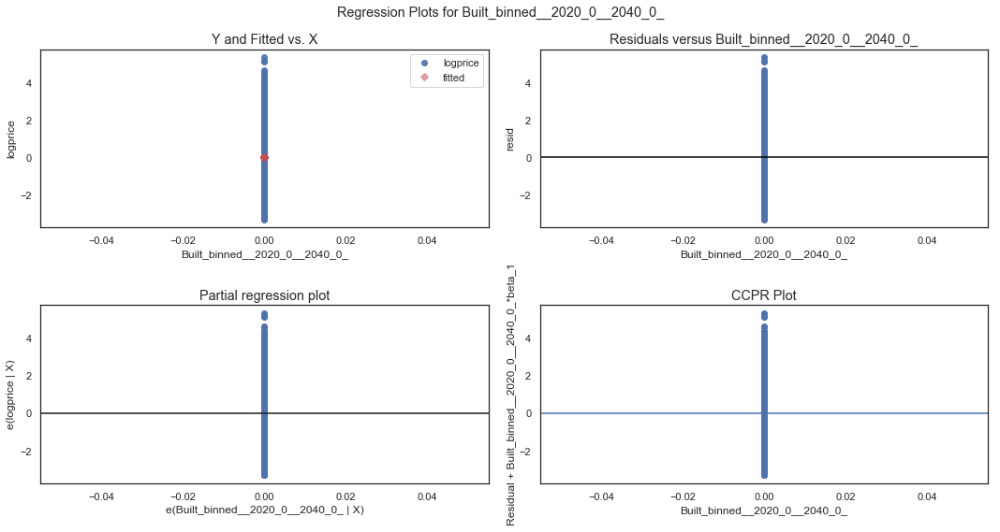

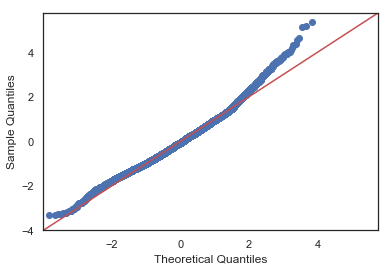

/Users/paulraymond/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1100: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/Users/paulraymond/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/Users/paulraymond/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/Users/paulraymond/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGB

['Built_binned__2020_0__2040_0_', 0.0, 1.7090148740628308e-13, 0.0, nan]
King City Real Estate: logprice~yr_renovated_upd_binned__1899_999__1910_0_
----------------------------------------------


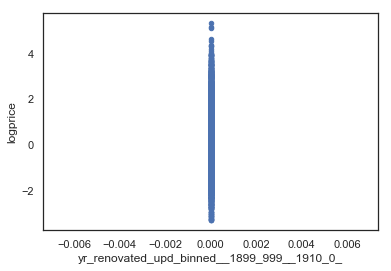

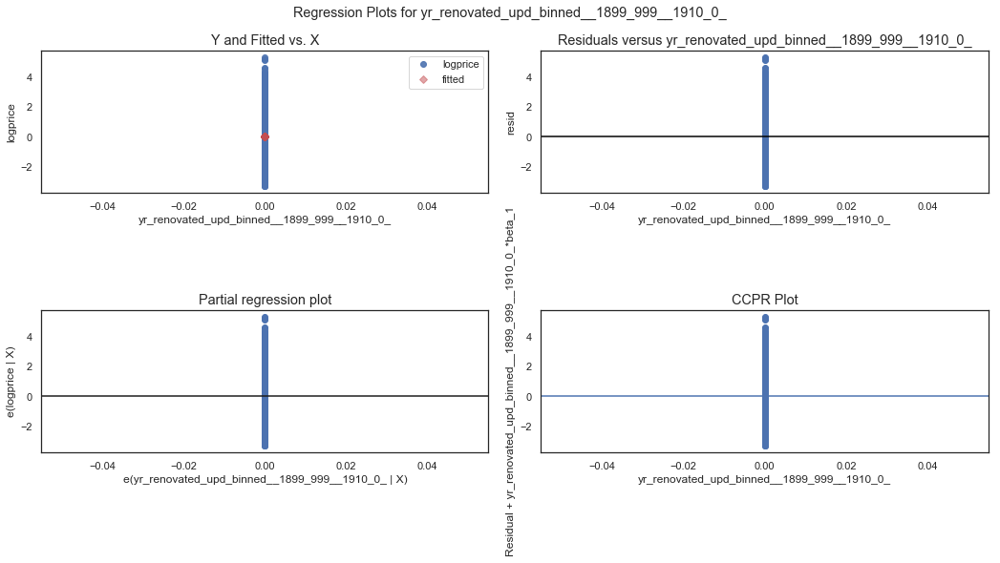

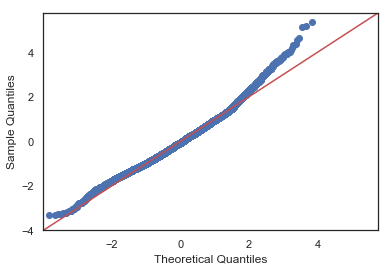

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__1899_999__1910_0_', 0.0, 1.7090148740628308e-13, 0.0, nan]
King City Real Estate: logprice~yr_renovated_upd_binned__1910_0__1920_0_
----------------------------------------------


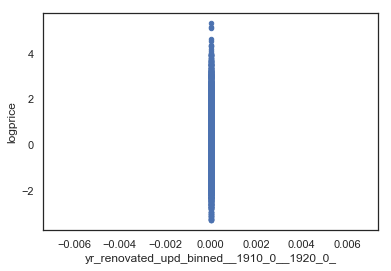

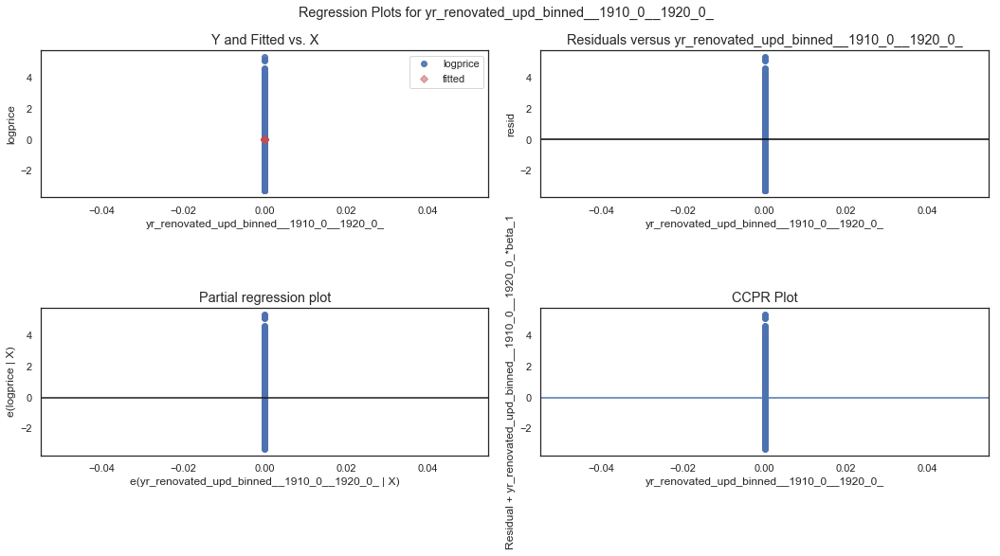

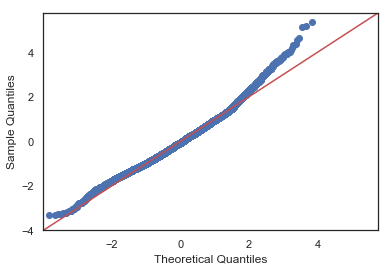

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__1910_0__1920_0_', 0.0, 1.7090148740628308e-13, 0.0, nan]
King City Real Estate: logprice~yr_renovated_upd_binned__1920_0__1930_0_
----------------------------------------------


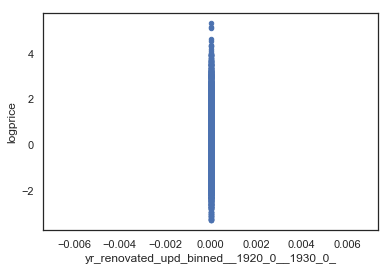

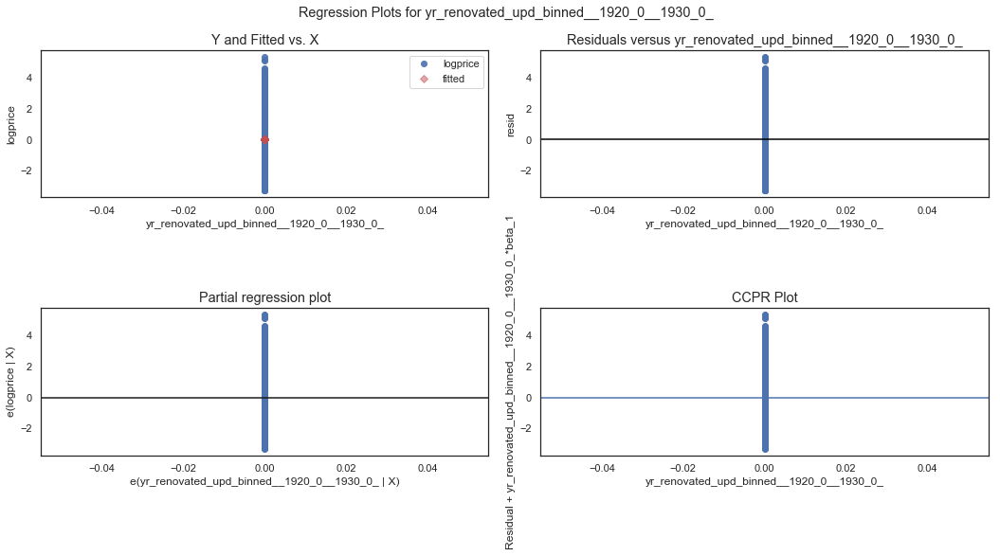

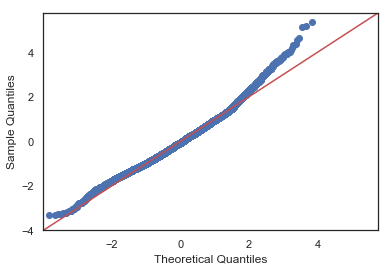

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__1920_0__1930_0_', 0.0, 1.7090148740628308e-13, 0.0, nan]
King City Real Estate: logprice~yr_renovated_upd_binned__1930_0__1940_0_
----------------------------------------------


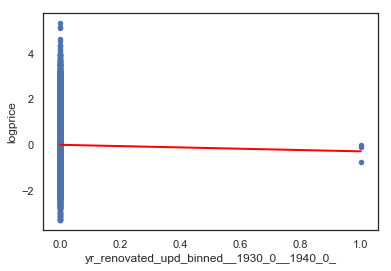

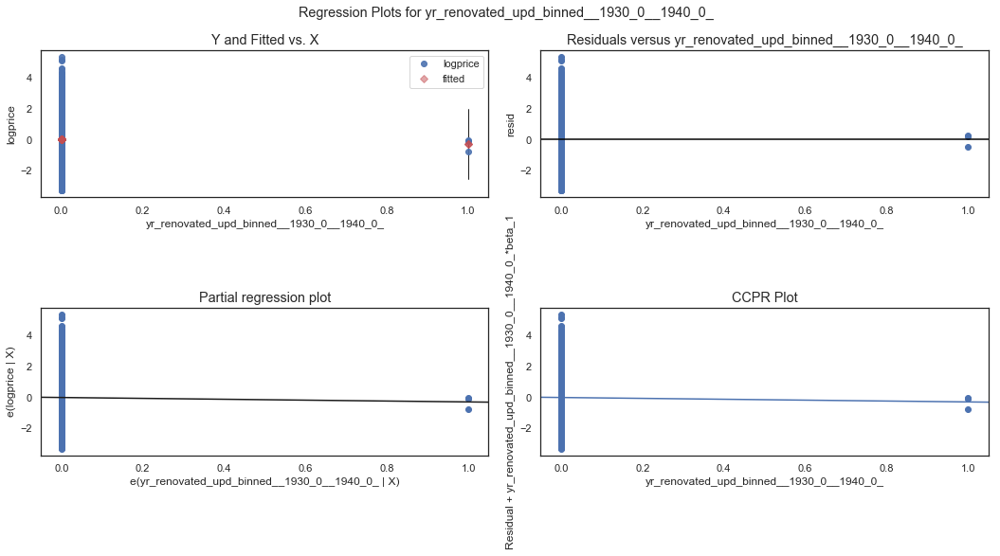

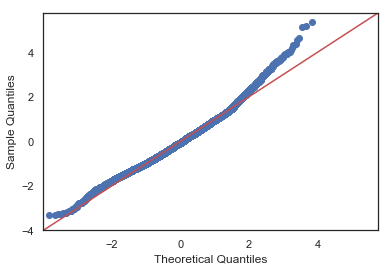

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__1930_0__1940_0_', 1.5953399755352926e-05, 5.569888669646264e-05, -0.286459373400951, 0.6198296368247248]
King City Real Estate: logprice~yr_renovated_upd_binned__1940_0__1950_0_
----------------------------------------------


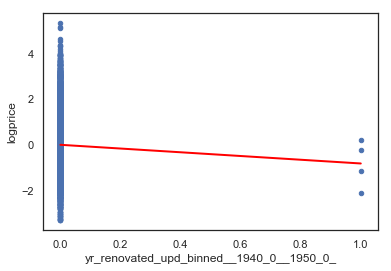

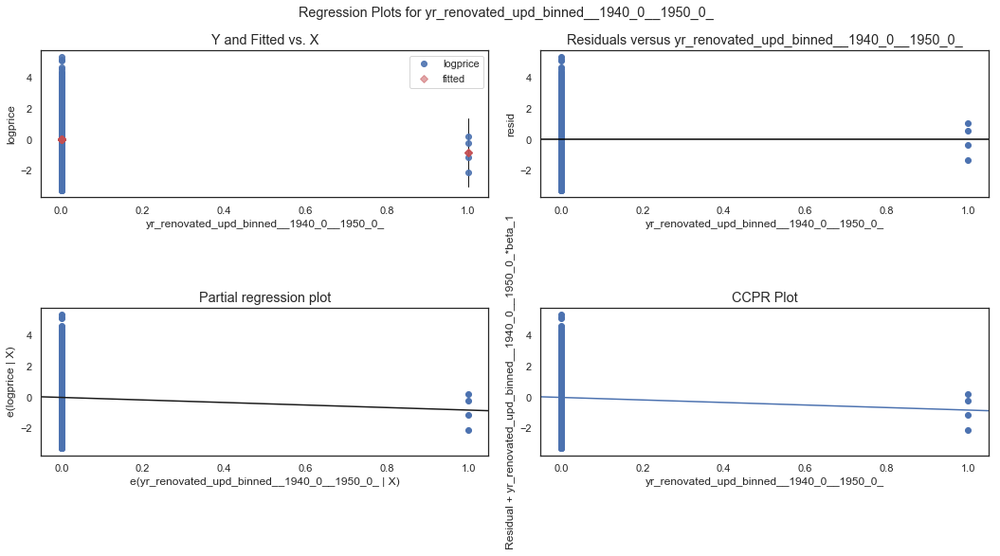

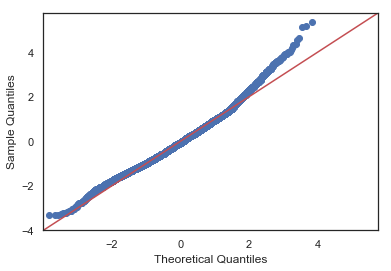

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__1940_0__1950_0_', 0.00017299488062205715, 0.00021179707641289132, -0.8169542723344407, 0.10232438511434166]
King City Real Estate: logprice~yr_renovated_upd_binned__1950_0__1960_0_
----------------------------------------------


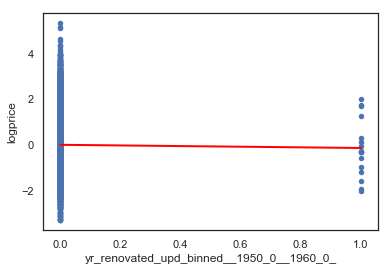

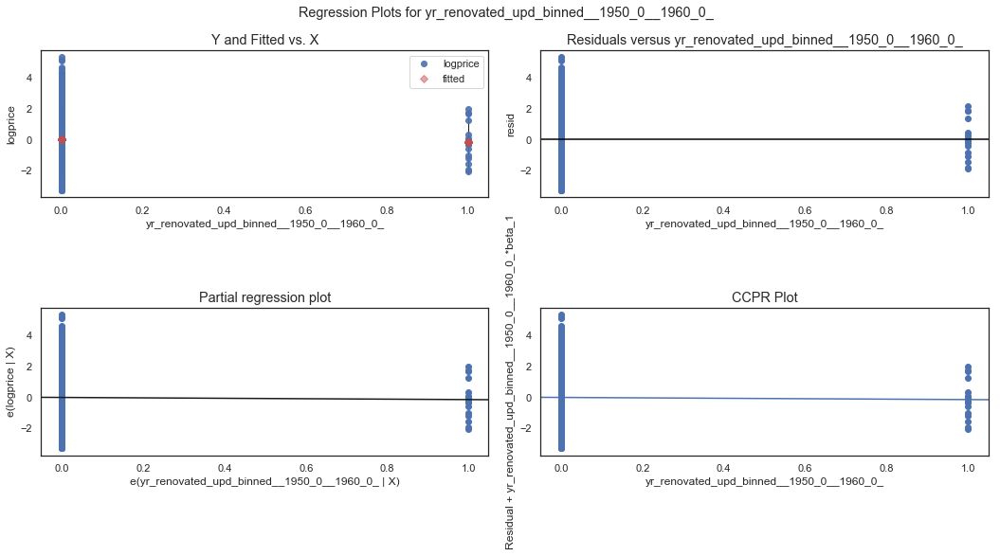

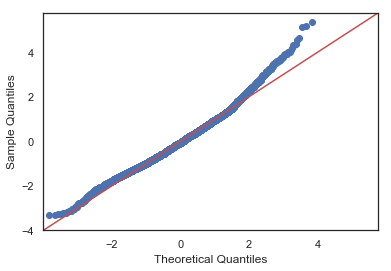

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__1950_0__1960_0_', 2.1410261081489246e-05, 0.0001536709825803416, -0.13946997574088288, 0.5654890059820479]
King City Real Estate: logprice~yr_renovated_upd_binned__1960_0__1970_0_
----------------------------------------------


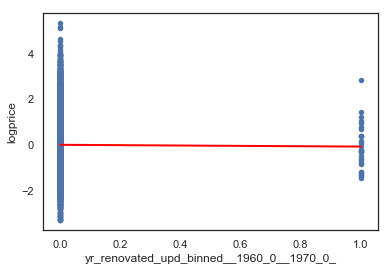

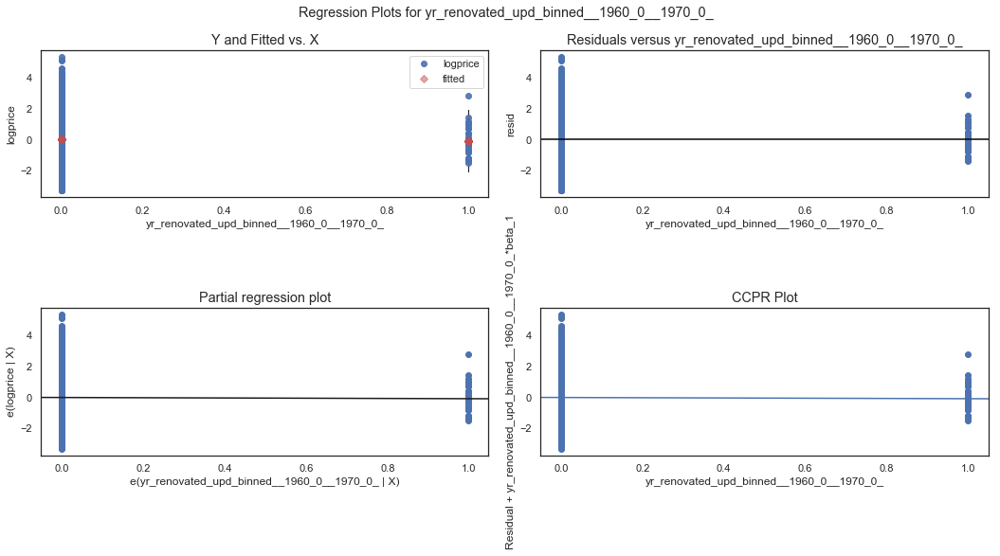

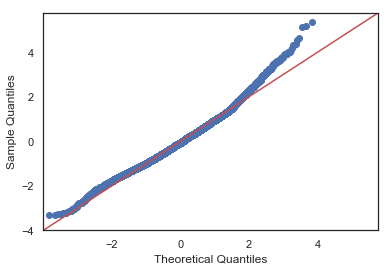

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__1960_0__1970_0_', 1.1415910446621602e-05, 0.00014661548496267864, -0.07800449361560326, 0.6747390450563873]
King City Real Estate: logprice~yr_renovated_upd_binned__1970_0__1980_0_
----------------------------------------------


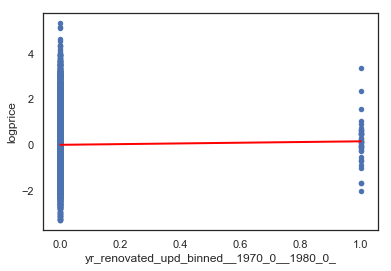

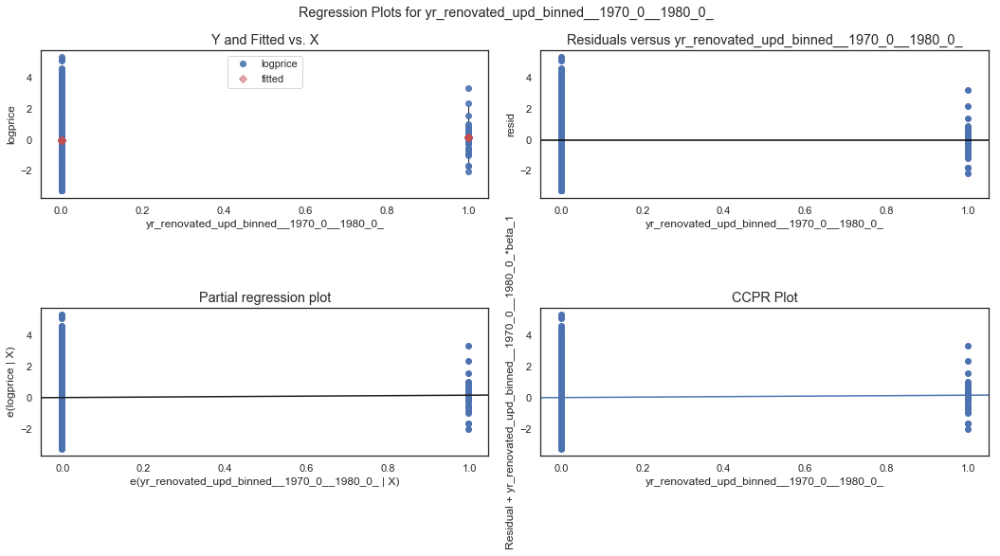

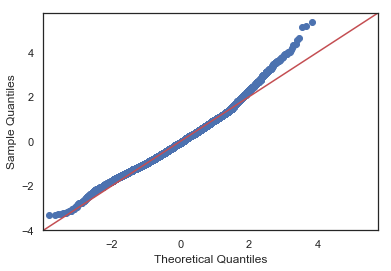

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__1970_0__1980_0_', 5.581041678048848e-05, -0.00036626624237795675, 0.15273302314287723, 0.35346363444428464]
King City Real Estate: logprice~yr_renovated_upd_binned__1980_0__1990_0_
----------------------------------------------


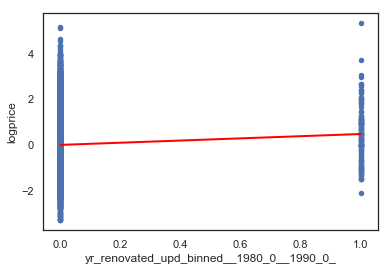

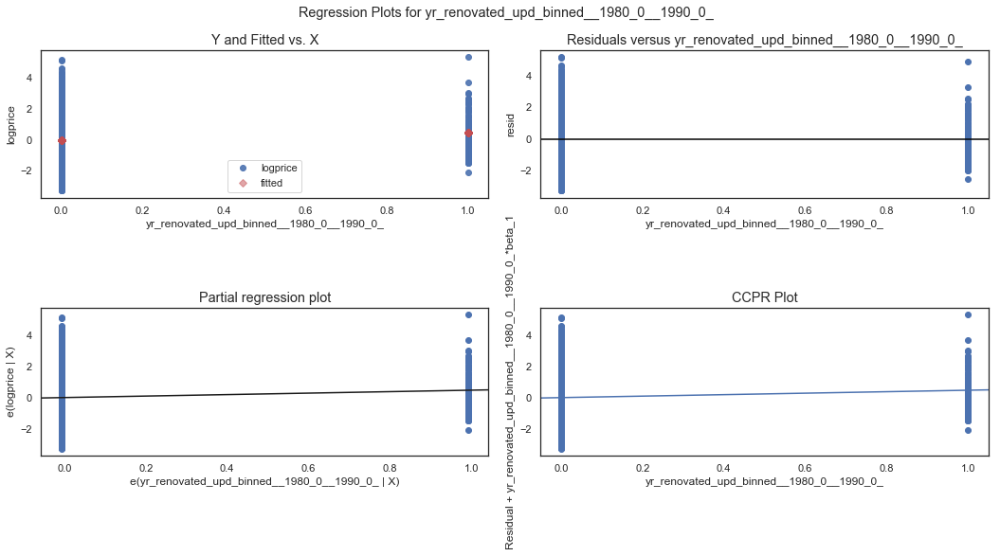

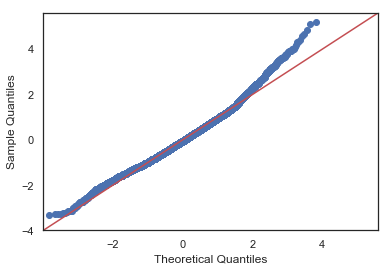

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__1980_0__1990_0_', 0.0016894442380142038, -0.0035773110982675795, 0.4758132149810981, 3.2683895001564214e-07]
King City Real Estate: logprice~yr_renovated_upd_binned__1990_0__2000_0_
----------------------------------------------


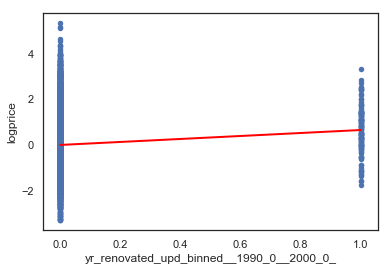

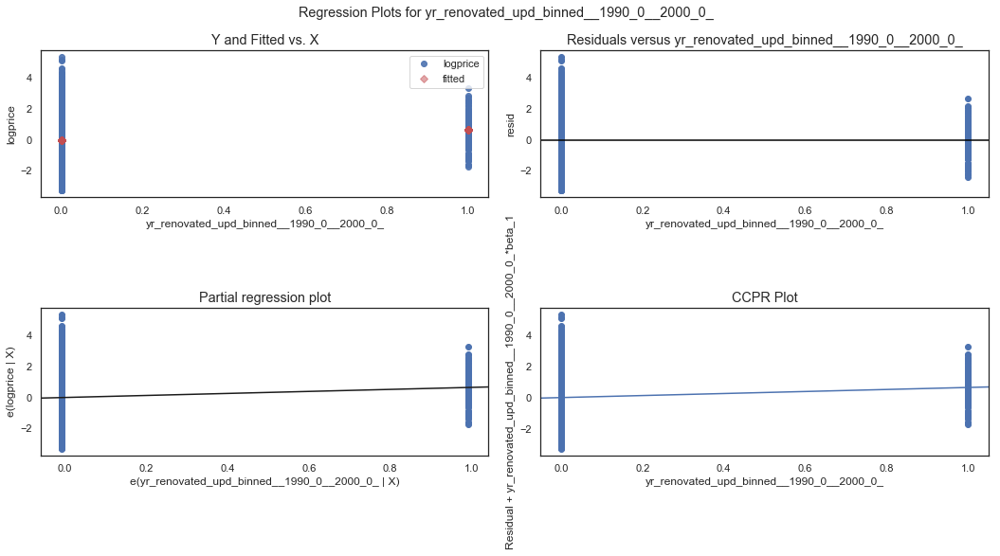

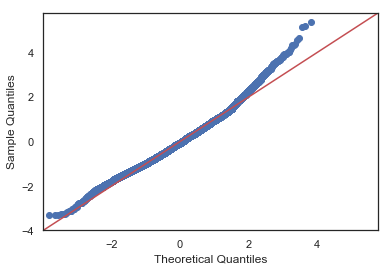

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__1990_0__2000_0_', 0.0034461969330255027, -0.005326635201051973, 0.6522591628545067, 2.930045446804674e-13]
King City Real Estate: logprice~yr_renovated_upd_binned__2000_0__2010_0_
----------------------------------------------


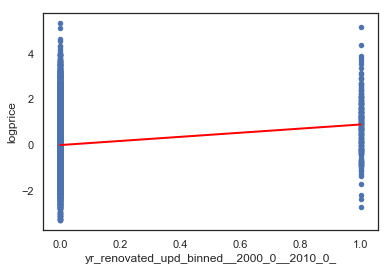

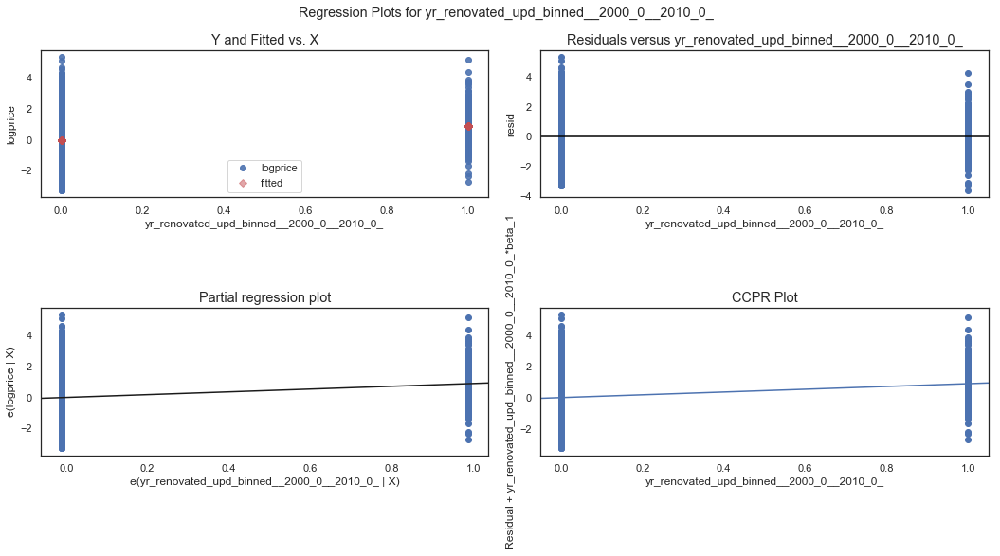

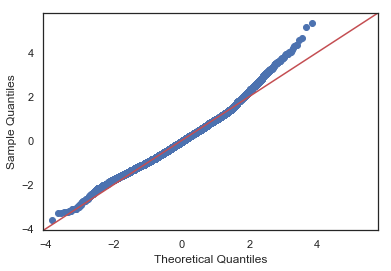

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__2000_0__2010_0_', 0.009490999406198242, -0.010673073146847189, 0.8998625441821965, 7.41681963107706e-34]
King City Real Estate: logprice~yr_renovated_upd_binned__2010_0__2020_0_
----------------------------------------------


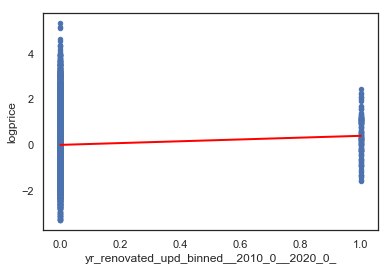

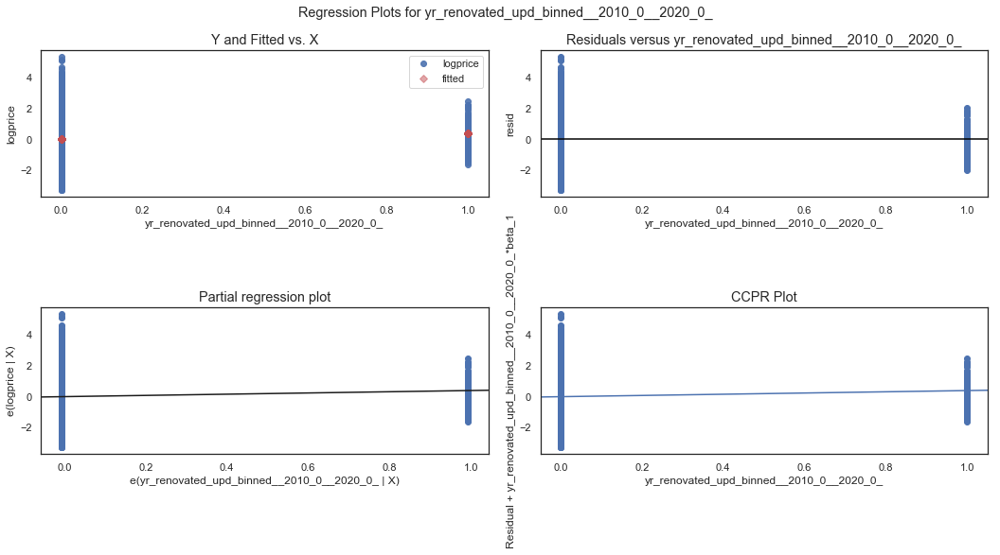

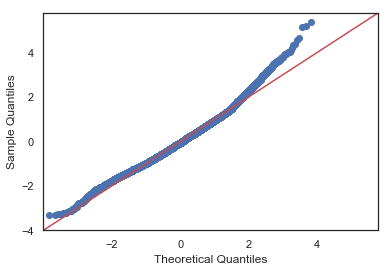

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__2010_0__2020_0_', 0.0011798584319373528, -0.003002464260344678, 0.3959403510726057, 1.9764715642239573e-05]
King City Real Estate: logprice~yr_renovated_upd_binned__2020_0__2040_0_
----------------------------------------------


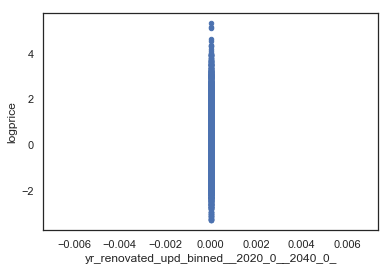

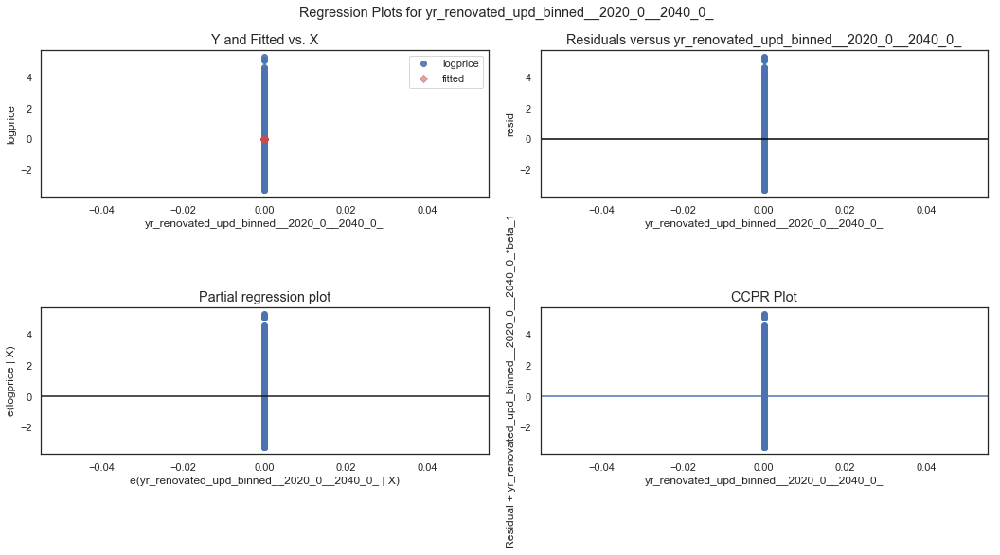

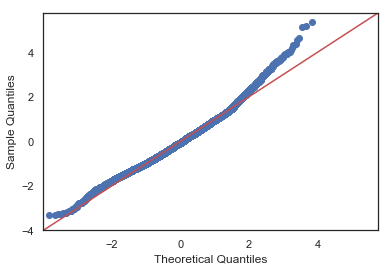

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['yr_renovated_upd_binned__2020_0__2040_0_', 0.0, 1.7090148740628308e-13, 0.0, nan]
King City Real Estate: logprice~zipcode__97999_999__98050_0_
----------------------------------------------


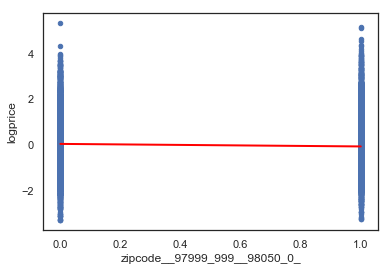

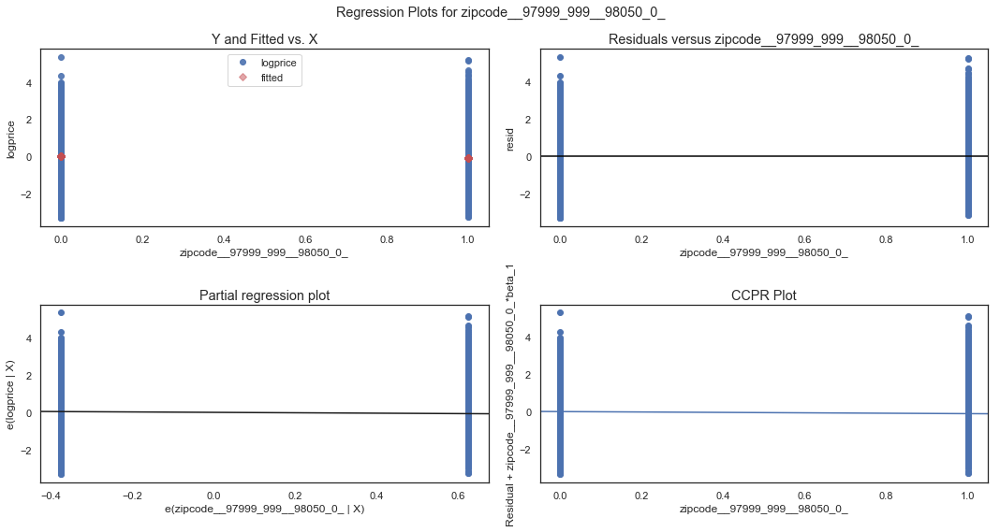

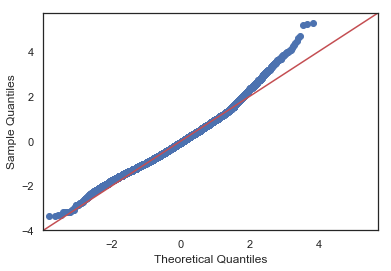

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['zipcode__97999_999__98050_0_', 0.002868505297591195, 0.04149128939787832, -0.11062192917180368, 2.7962497268967925e-11]
King City Real Estate: logprice~zipcode__98050_0__98100_0_
----------------------------------------------


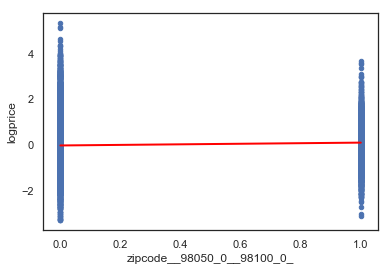

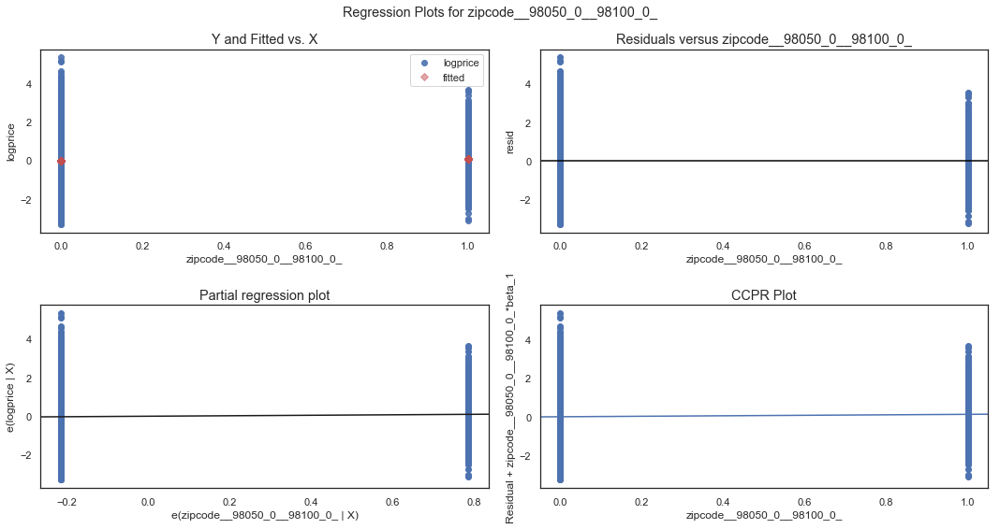

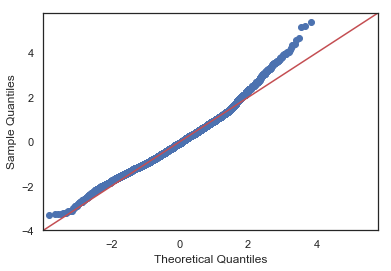

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['zipcode__98050_0__98100_0_', 0.0025804106158908713, -0.02650587717779804, 0.12385196213775984, 2.730920096232779e-10]
King City Real Estate: logprice~zipcode__98100_0__98150_0_
----------------------------------------------


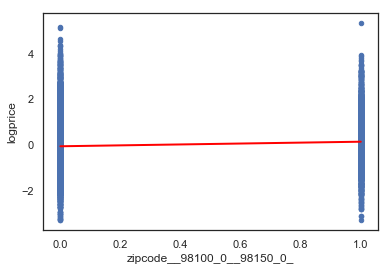

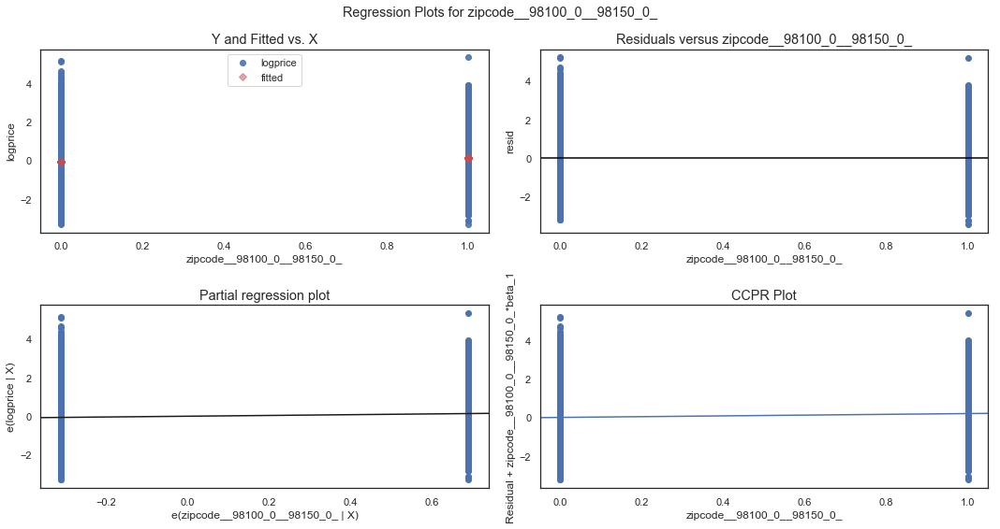

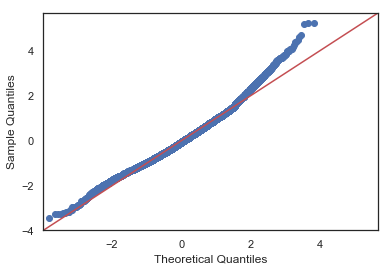

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['zipcode__98100_0__98150_0_', 0.008493895721630285, -0.06176330777626643, 0.1992777238985049, 1.838745503221832e-30]
King City Real Estate: logprice~zipcode__98150_0__98200_0_
----------------------------------------------


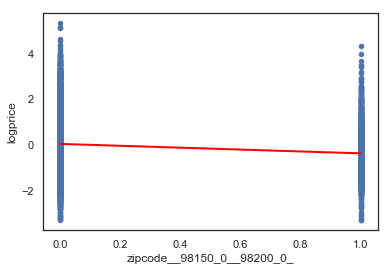

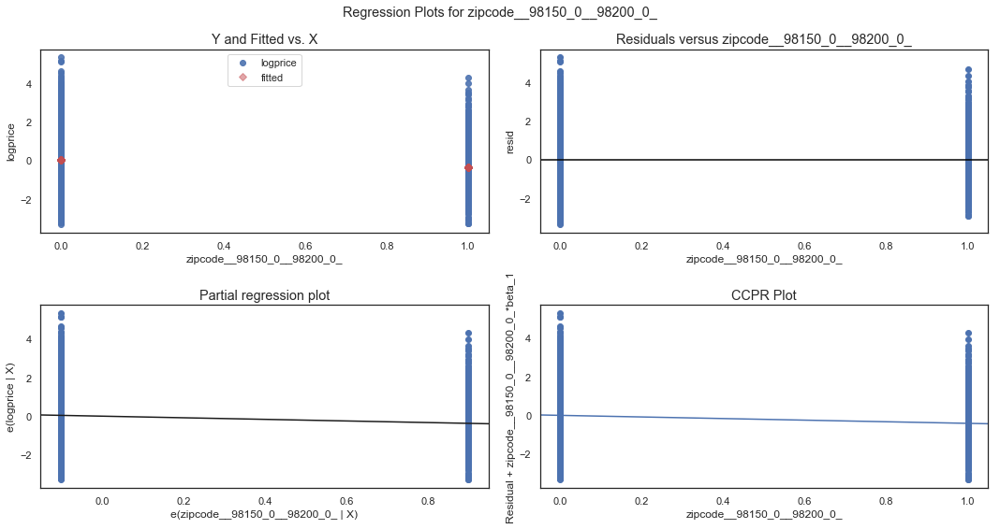

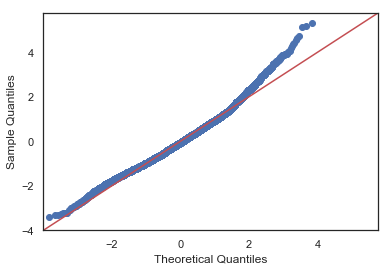

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


['zipcode__98150_0__98200_0_', 0.015511992744564274, 0.04173972302376254, -0.413351852715658, 2.184450980061639e-54]
King City Real Estate: logprice~logprice
----------------------------------------------


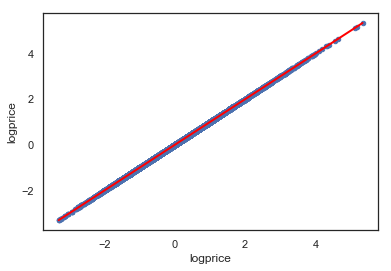

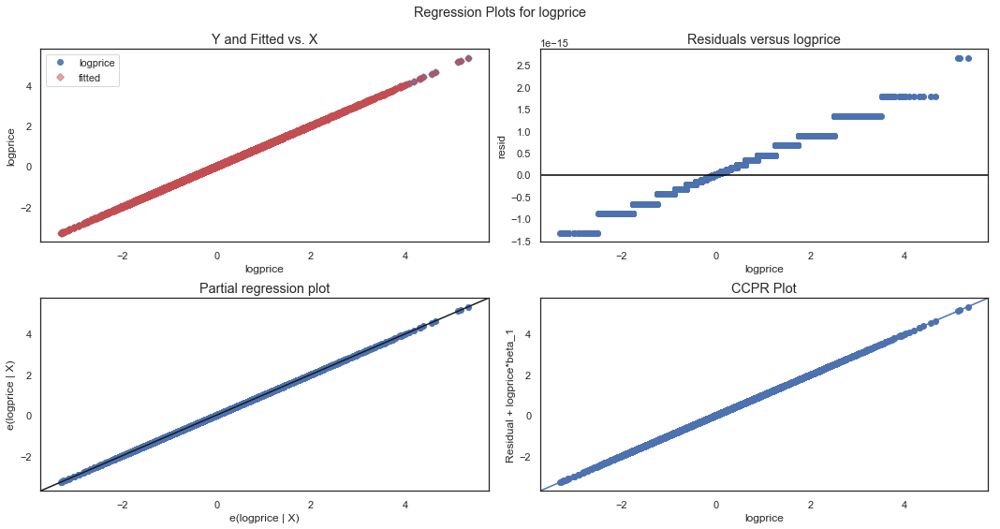

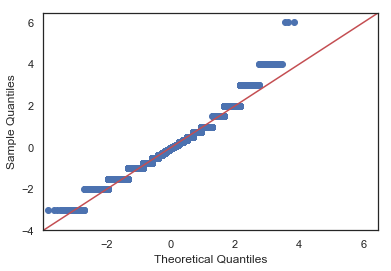

['logprice', 1.0, -6.938893903907228e-18, 0.9999999999999996, 0.0]


In [603]:
results = [['ind_var', 'r_squared', 'intercept', 'slope', 'normality(JB)']]
for idx, val in enumerate(data_cat_reg.describe().columns):
    print ("King City Real Estate: logprice~" + val)
    print ("----------------------------------------------")
    
    f = "logprice~" + val
    model = smf.ols(formula=f, data=data_cat_reg).fit()
    X_new = pd.DataFrame({val: [data_cat_reg[val].min(), data_cat_reg[val].max()]})
    preds = model.predict(X_new)
    data_cat_reg.plot(kind='scatter', x=val, y='logprice');
    plt.plot(X_new, preds, c='red', linewidth=2);
    plt.show()
    fig = plt.figure(figsize=(15,8))
    fig = sm.graphics.plot_regress_exog(model, val, fig=fig)
    fig = sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True,)
    plt.show()
    
    results.append([val, model.rsquared, model.params[0], model.params[1], model.pvalues[1]])
    print(results[idx + 1])

Most of the categorical features have binary behavior so residual plots are not distributed uniformly. The qqplots don't clearly exhibit non normal behavior.

___Check for Linearity between Predictors and Target___

As a final step before the modeling stage, I'll perform a joint plot to check for the linearity assumption between predictors and target variables.

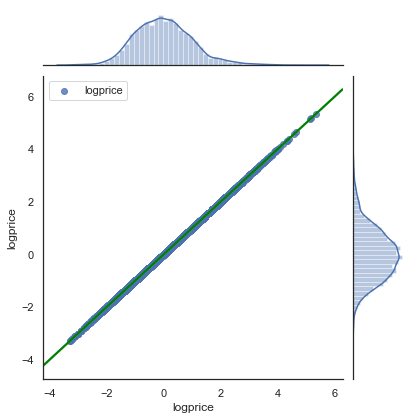

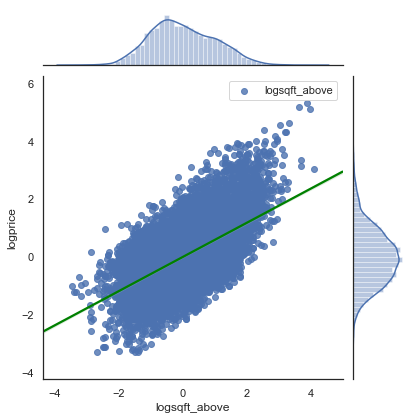

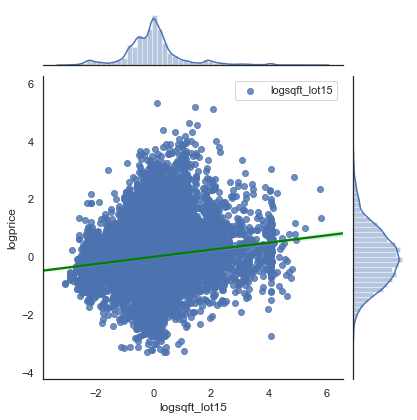

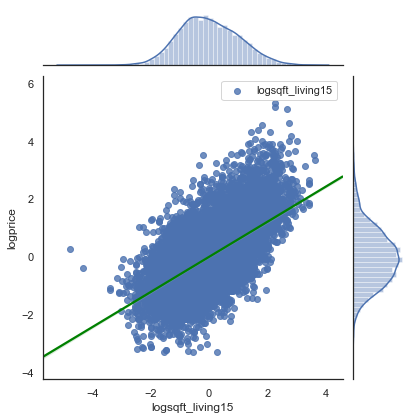

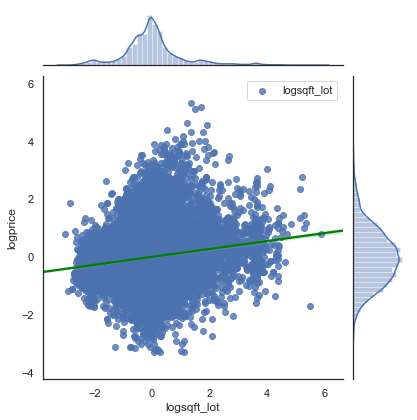

...

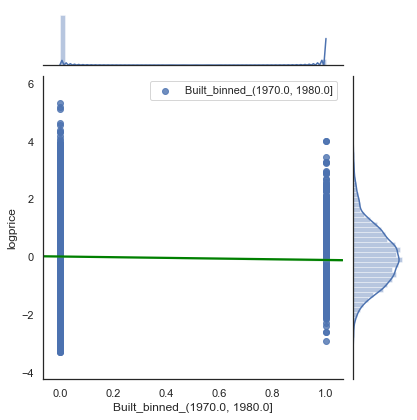

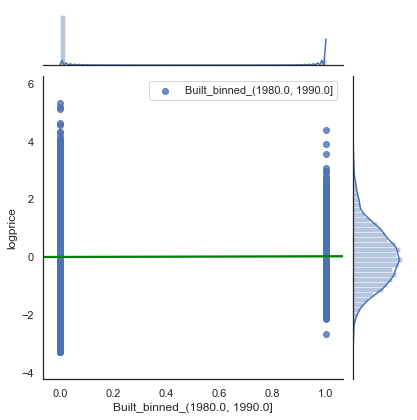

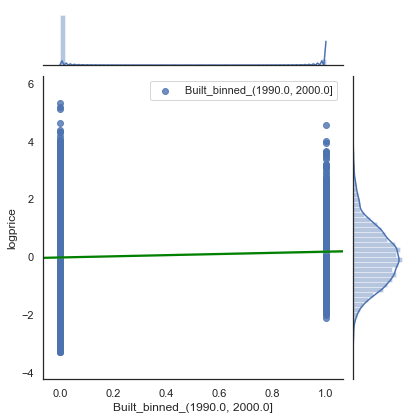

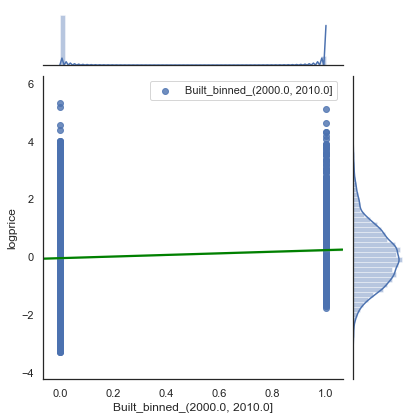

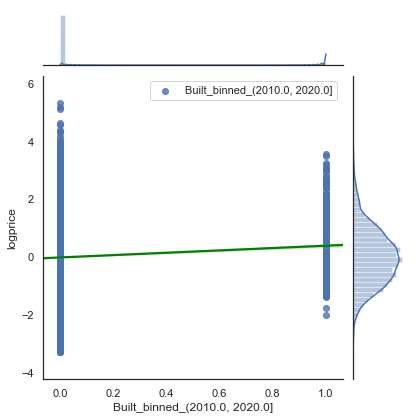

/Users/paulraymond/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/paulraymond/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


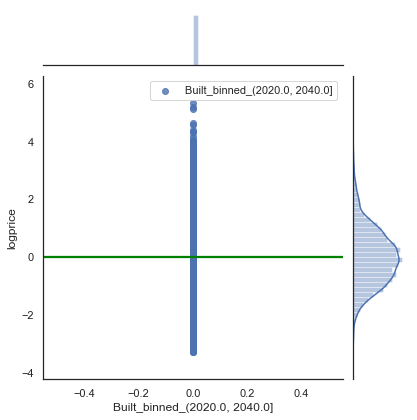

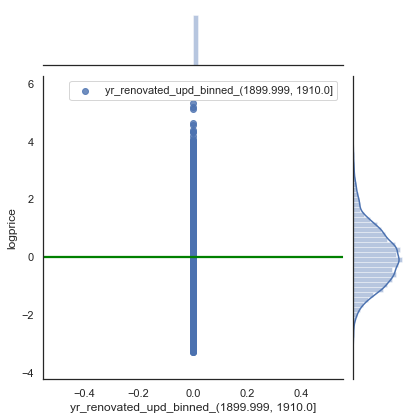

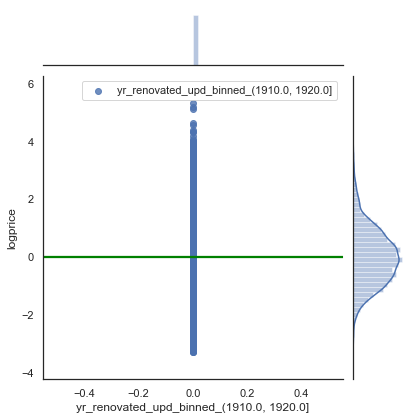

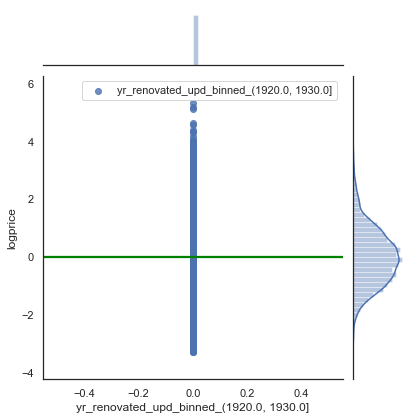

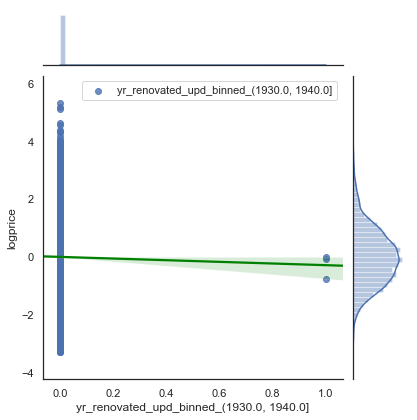

...

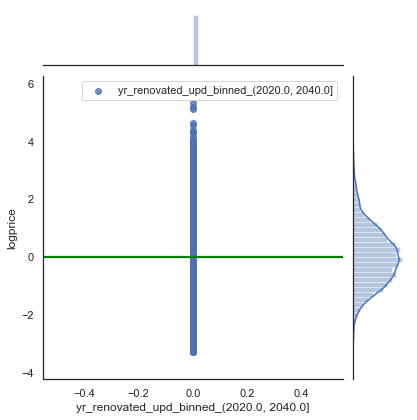

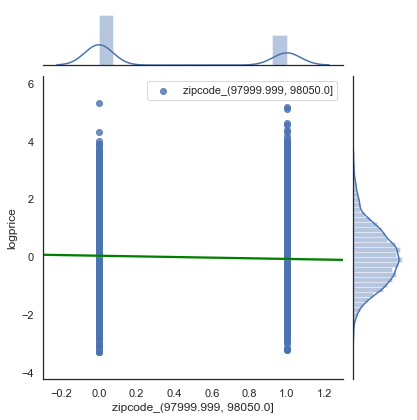

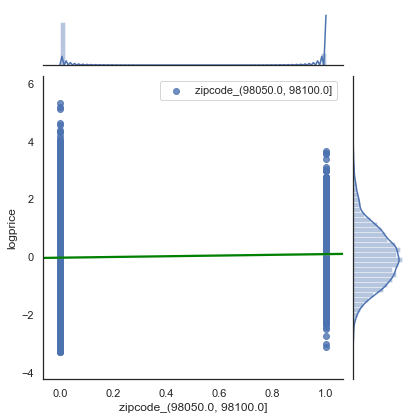

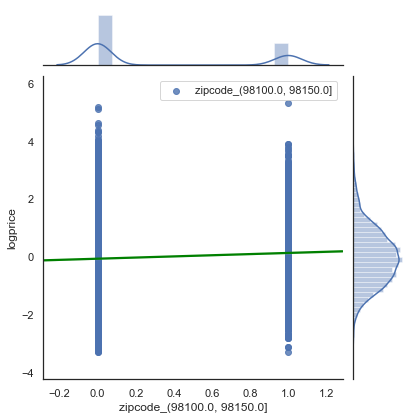

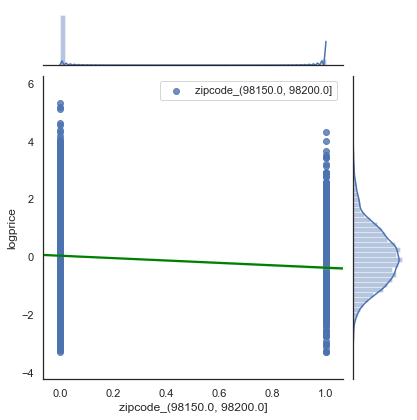

In [559]:
##paused to speed up run time
for column in df_final.columns:
    sns.jointplot(x=column, y="logprice", data=df_final, kind='reg', label=column, joint_kws={'line_kws':{'color':'green'}})
    plt.legend()
    plt.show()

Again, rarely any predictors have a considerable linear relationship with the target variable.

___Build linear model___

I'll first use the statsmodel approach to model a linear relationship for each feature with more summary metrics on coefficients and p-value.

In [605]:
#repititve # either use this or work above

In [562]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [604]:
for col in df_final.columns:
    upd_col = clean(col)
    df_final.rename(columns = {col : upd_col}, inplace=True)
# df_final.columns

In [564]:
col_names = df_final.describe().columns.drop(['logprice'])
results = [['ind_var', 'r_squared', 'intercept','slope', 'p-value']]
for idx, val in enumerate(col_names):
    print ("King City Real Estate: price~" + val)
    print ("------------------------------")
    f = "logprice~" + val
    model = smf.ols(formula=f, data=df_final).fit()
    X_new = pd.DataFrame({val: [df_final[val].min(), df_final[val].max()]})
    preds = model.predict(X_new)
    results.append([val, model.rsquared, model.params[0], model.params[1], model.pvalues[1]])
    print(results[idx + 1])

King City Real Estate: price~logsqft_above
------------------------------
['logsqft_above', 0.3478394304295107, 1.1644504804841915e-13, 0.5897791369907169, 0.0]
King City Real Estate: price~logsqft_lot15
------------------------------
['logsqft_lot15', 0.015330815061564529, 1.6853185513809876e-13, 0.12381766861625566, 9.0847182683504e-54]
King City Real Estate: price~logsqft_living15
------------------------------
['logsqft_living15', 0.36761354741896535, 1.8755483277566043e-13, 0.6063114277489473, 0.0]
King City Real Estate: price~logsqft_lot
------------------------------
['logsqft_lot', 0.018672562551321437, 1.697253448895708e-13, 0.13664758523779988, 3.36947758338048e-65]
King City Real Estate: price~logsqft_basement
------------------------------
['logsqft_basement', 0.049634091521159385, 1.7090148740628308e-13, 0.2227870990904873, 8.325838653271109e-173]
King City Real Estate: price~bedrooms_1
------------------------------
['bedrooms_1', 0.008083099210595579, 0.00854075923596228

['waterfront_0_0', 0.03158712494346483, 2.041935978378107, -2.057404180134082, 1.0845950584183308e-109]
King City Real Estate: price~waterfront_1_0
------------------------------
['waterfront_1_0', 0.03158712494346483, -0.015468201755973578, 2.057404180134081, 1.084595058418238e-109]
King City Real Estate: price~view_0_0
------------------------------
['view_0_0', 0.11001726857941241, 1.0174958660552447, -1.1256143770964182, 0.0]
King City Real Estate: price~view_1_0
------------------------------
['view_1_0', 0.009669813327832677, -0.012412711377645956, 0.7913872886294893, 1.8256150870482055e-34]
King City Real Estate: price~view_2_0
------------------------------
['view_2_0', 0.026358668594357093, -0.03448239839276046, 0.7988422294362433, 1.2941824672114283e-91]
King City Real Estate: price~view_3_0
------------------------------
['view_3_0', 0.02845965322576327, -0.025284592388573945, 1.1507845898700415, 7.226345871290294e-99]
King City Real Estate: price~view_4_0
------------------

/Users/paulraymond/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1100: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/Users/paulraymond/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/Users/paulraymond/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/Users/paulraymond/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


['yr_renovated_upd_binned__1940_0__1950_0_', 0.00017299488062205715, 0.00021179707641289132, -0.8169542723344407, 0.10232438511434166]
King City Real Estate: price~yr_renovated_upd_binned__1950_0__1960_0_
------------------------------
['yr_renovated_upd_binned__1950_0__1960_0_', 2.1410261081489246e-05, 0.0001536709825803416, -0.13946997574088288, 0.5654890059820479]
King City Real Estate: price~yr_renovated_upd_binned__1960_0__1970_0_
------------------------------
['yr_renovated_upd_binned__1960_0__1970_0_', 1.1415910446621602e-05, 0.00014661548496267864, -0.07800449361560326, 0.6747390450563873]
King City Real Estate: price~yr_renovated_upd_binned__1970_0__1980_0_
------------------------------
['yr_renovated_upd_binned__1970_0__1980_0_', 5.581041678048848e-05, -0.00036626624237795675, 0.15273302314287723, 0.35346363444428464]
King City Real Estate: price~yr_renovated_upd_binned__1980_0__1990_0_
------------------------------
['yr_renovated_upd_binned__1980_0__1990_0_', 0.0016894442

None of the features have a strong r-squared value. __logsqft_living15__ and __logsqft_above__ have the highest values.

I'll move on to multivariable regressions.

___Multivariable regression___

I'll start on a multivariable regression model using statsmodel.

In [711]:
target = 'logprice'
predictors = df_final.drop(['logprice','bedrooms_9','bathrooms_8_0','floors_3_5','waterfront_1_0','view_4_0','condition_5', 'grade_13','Built_binned__1899_999__1910_0_','yr_renovated_upd_binned__1899_999__1910_0_','zipcode__97999_999__98050_0_'], axis=1)
pred_sum = "+".join(predictors.columns)
pred_sum
formula = target + "~" + pred_sum

In [712]:
model = ols(formula=formula, data=df_final).fit()
model.summary()

/Users/paulraymond/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1100: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/Users/paulraymond/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/Users/paulraymond/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/Users/paulraymond/anaconda3/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               logprice   R-squared:                       0.696
Model:                            OLS   Adj. R-squared:                  0.695
Method:                 Least Squares   F-statistic:                     395.3
Date:                Sat, 10 Aug 2019   Prob (F-statistic):               0.00
Time:                        17:00:39   Log-Likelihood:                -12697.
No. Observations:               15429   AIC:                         2.557e+04
Df Residuals:                   15339   BIC:                         2.626e+04
Df Model:                          89                                         
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
Intercept                                    3.5397      0.540      6.555      0.000       2.481       4.598
logsqft_above                                0.2746      0.011     24.344      0.000       0.252       0.297
logsqft_lot15                               -0.0345      0.012     -2.996      0.003      -0.057      -0.012
logsqft_living15                             0.2069      0.008     26.613      0.000       0.192       0.222
logsqft_lot                                  0.0303      0.012      2.581      0.010       0.007       0.053
logsqft_basement                             0.1297      0.006     20.308      0.000       0.117       0.142
bedrooms_1                                   0.2476      0.257      0.965      0.335      -0.255       0.751
bedrooms_10                                  0.3231      0.410      0.789      0.430      -0.480       1.126
bedrooms_11                                 -0.3645      0.609     -0.599      0.549      -1.558       0.829
bedrooms_2                                   0.2855      0.252      1.134      0.257      -0.208       0.779
bedrooms_3                                   0.1453      0.251      0.578      0.563      -0.347       0.638
bedrooms_33                                  0.6113      0.608      1.006      0.314      -0.580       1.802
bedrooms_4                                   0.1265      0.251      0.504      0.614      -0.366       0.619
bedrooms_5                                   0.1327      0.251      0.528      0.597      -0.360       0.625
bedrooms_6                                   0.0856      0.253      0.338      0.735      -0.411       0.582
bedrooms_7                                   0.1113      0.278      0.401      0.689      -0.433       0.656
bedrooms_8                                   0.4637      0.308      1.507      0.132      -0.139       1.067
bathrooms_0_5                               -0.8463      0.524     -1.616      0.106      -1.873       0.180
bathrooms_0_75                              -0.1657      0.423     -0.392      0.695      -0.994       0.663
bathrooms_1_0                               -0.3156      0.414     -0.762      0.446      -1.128       0.497
bathrooms_1_25                              -0.0072      0.472     -0.015      0.988      -0.932       0.917
bathrooms_1_5                               -0.2765      0.414     -0.668      0.504      -1.088       0.535
bathrooms_1_75                              -0.1895      0.414     -0.458      0.647      -1.001       0.622
bathrooms_2_0                               -0.1898      0.414     -0.459      0.646      -1.001       0.621
bathrooms_2_25                              -0.1258      0.414     -0.304      0.761      -0.937       0.685
bathrooms_2_5                  

The r-squared value is decent but most of the p-values for the predictors are not significant.

I'll choose predictors with significant p-values to create a new model.

In [713]:
p_val_results = pd.DataFrame(model.pvalues, columns={'P_value'}).reset_index()
p_val_results.head()

,index,P_value
0,Intercept,5.735739e-11
1,logsqft_above,1.800039e-128
2,logsqft_lot15,2.735957e-03
3,logsqft_living15,1.378414e-152
4,logsqft_lot,9.861227e-03


In [714]:
# p_val_results['index']

In [719]:
sig_predictors = []
for row in p_val_results.index:
    pred = p_val_results['index'][row]
    p_val = p_val_results['P_value'][row]
    if p_val <= .05 and pred != 'Intercept':
        sig_predictors.append(pred)

In [720]:
sig_predictors

['logsqft_above',
 'logsqft_lot15',
 'logsqft_living15',
 'logsqft_lot',
 'logsqft_basement',
 'bathrooms_7_75',
 'waterfront_0_0',
 'view_0_0',
 'view_1_0',
 'view_2_0',
 'view_3_0',
 'condition_1',
 'condition_2',
 'condition_3',
 'condition_4',
 'grade_10',
 'grade_11',
 'grade_3',
 'grade_4',
 'grade_5',
 'grade_6',
 'grade_7',
 'grade_8',
 'grade_9',
 'Built_binned__1930_0__1940_0_',
 'Built_binned__1940_0__1950_0_',
 'Built_binned__1950_0__1960_0_',
 'Built_binned__1960_0__1970_0_',
 'Built_binned__1970_0__1980_0_',
 'Built_binned__1980_0__1990_0_',
 'Built_binned__1990_0__2000_0_',
 'Built_binned__2000_0__2010_0_',
 'Built_binned__2010_0__2020_0_',
 'yr_renovated_upd_binned__1960_0__1970_0_',
 'yr_renovated_upd_binned__1990_0__2000_0_',
 'yr_renovated_upd_binned__2000_0__2010_0_',
 'yr_renovated_upd_binned__2010_0__2020_0_',
 'zipcode__98050_0__98100_0_',
 'zipcode__98100_0__98150_0_',
 'zipcode__98150_0__98200_0_']

___Refine previous model___

In [721]:
target = 'logprice'
predictors = sig_predictors
pred_sum = "+".join(predictors)
formula = target + '~' + pred_sum

In [722]:
model = ols(formula = formula, data= df_final).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               logprice   R-squared:                       0.690
Model:                            OLS   Adj. R-squared:                  0.689
Method:                 Least Squares   F-statistic:                     856.3
Date:                Sat, 10 Aug 2019   Prob (F-statistic):               0.00
Time:                        17:02:13   Log-Likelihood:                -12857.
No. Observations:               15429   AIC:                         2.580e+04
Df Residuals:                   15388   BIC:                         2.611e+04
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
Intercept                                    3.3476      0.087     38.690      0.000       3.178       3.517
logsqft_above                                0.2820      0.009     32.383      0.000       0.265       0.299
logsqft_lot15                               -0.0360      0.012     -3.121      0.002      -0.059      -0.013
logsqft_living15                             0.2033      0.008     26.392      0.000       0.188       0.218
logsqft_lot                                  0.0287      0.012      2.449      0.014       0.006       0.052
logsqft_basement                             0.1479      0.005     27.488      0.000       0.137       0.158
bathrooms_7_75                               1.4941      0.563      2.654      0.008       0.391       2.598
waterfront_0_0                              -0.8328      0.065    -12.764      0.000      -0.961      -0.705
view_0_0                                    -0.3679      0.047     -7.815      0.000      -0.460      -0.276
view_1_0                                    -0.1182      0.058     -2.029      0.042      -0.232      -0.004
view_2_0                                    -0.2088      0.050     -4.135      0.000      -0.308      -0.110
view_3_0                                    -0.1483      0.054     -2.746      0.006      -0.254      -0.042
condition_1                                 -0.4558      0.134     -3.410      0.001      -0.718      -0.194
condition_2                                 -0.5794      0.053    -11.029      0.000      -0.682      -0.476
condition_3                                 -0.2670      0.018    -14.676      0.000      -0.303      -0.231
condition_4                                 -0.1516      0.018     -8.238      0.000      -0.188      -0.116
grade_10                                    -0.8644      0.068    -12.744      0.000      -0.997      -0.731
grade_11                                    -0.5573      0.072     -7.702      0.000      -0.699      -0.415
grade_3                                     -2.1447      0.563     -3.807      0.000      -3.249      -1.040
grade_4                                     -2.7573      0.159    -17.303      0.000      -3.070      -2.445
grade_5                                     -2.6243      0.086    -30.632      0.000      -2.792      -2.456
grade_6                                     -2.3765      0.073    -32.519      0.000      -2.520      -2.233
grade_7                                     -1.9996      0.069    -28.837      0.000      -2.136      -1.864
grade_8                                     -1.6453      0.068    -24.285      0.000      -1.778      -1.513
grade_9                                     -1.2508      0.067    -18.652      0.000      -1.382      -1.119
Built_binned__1930_0__1940_0_  

The r-squared value decreased slightly but only one additional predictor is now insignificant.

I'll next do same with sklearn.

___Multiple regression with sklearn___

In [725]:
col_names_upd = [col for col in col_names if col not in ['bedrooms_9','bathrooms_8_0','floors_3_5','waterfront_1_0','view_4_0','condition_5', 'grade_13','Built_binned__1899_999__1910_0_','yr_renovated_upd_binned__1899_999__1910_0_','zipcode__97999_999__98050_0_']]
predictors = col_names_upd
pred_sum = "+".join(predictors)
linreg = LinearRegression()
linreg.fit(df_final[col_names_upd], df_final['logprice'])

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [726]:
print(linreg.intercept_)
print(linreg.coef_)

3.5396913247165864
[ 2.74561875e-01 -3.44706195e-02  2.06918659e-01  3.03098729e-02
  1.29676141e-01  2.47636597e-01  3.23145616e-01 -3.64498873e-01
  2.85496108e-01  1.45315248e-01  6.11261542e-01  1.26523281e-01
  1.32698408e-01  8.56065096e-02  1.11340442e-01  4.63737690e-01
 -8.46266963e-01 -1.65746388e-01 -3.15557831e-01 -7.16326502e-03
 -2.76540837e-01 -1.89507140e-01 -1.89838166e-01 -1.25809919e-01
 -1.77550797e-01 -1.19703519e-01 -1.19387911e-01 -1.47954014e-02
 -2.65700037e-02  1.74833624e-01  4.58292072e-02  1.66147203e-01
  9.78720446e-02  3.30926312e-01  6.85094614e-02  2.48943958e-01
  6.36596265e-01 -5.01349971e-01  5.41253386e-01  3.37258951e-01
 -1.53632264e-01  1.35676030e+00 -1.95203702e-02 -4.06992912e-02
 -5.01142745e-02 -3.44032374e-02  1.25616278e-01 -7.83180285e-01
 -3.55524219e-01 -1.19507319e-01 -2.12943418e-01 -1.59255204e-01
 -4.50574472e-01 -5.61839930e-01 -2.43722193e-01 -1.38102150e-01
 -1.04141892e+00 -8.06950308e-01 -3.84954879e-01 -2.44918756e+00
 -2.99

The intercept and most of the coefficients align with the statsmodel approach.

I'll try recursive feature elimination to decide how many columns is ideal for the model.

___Recursive feature elimination___

View results with 10 features:

In [735]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

linreg = LinearRegression()
selector = RFE(linreg, n_features_to_select = 10)
selector = selector.fit(df_final[col_names_upd], df_final['logprice'])

In [736]:
selector.support_

array([False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False,  True,  True,  True,  True,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [737]:
X = df_final[col_names_upd]

In [738]:
selected_columns = X.columns[selector.support_]
linreg.fit(df_final[col_names_upd][selected_columns], df_final['logprice'])

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [739]:
yhat = linreg.predict(X[selected_columns])

In [740]:
SS_Residual = np.sum((y-yhat)**2)
SS_Total = np.sum((y-np.mean(y))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y)-1)/(len(y)-X[selected_columns].shape[1]-1)

In [741]:
r_squared

0.36542091818024114

In [742]:
adjusted_r_squared

0.3650093349127488

Worse performance than previous model. I'll create loop to align on ideal number of features. I'll check for any significant difference between the r-squared and adjusted r-squareds and after, determine which number of features result in the lowest MSE.

In [743]:
y = df_final['logprice']

In [744]:
r_list = []
adj_r_list = []
list_n = list(range(5,175,10))
for n in list_n: 
    select_n = RFE(linreg, n_features_to_select = n)
    select_n = select_n.fit(X, np.ravel(y))
    selected_columns = X.columns[select_n.support_ ]
    linreg.fit(X[selected_columns],y)
    yhat = linreg.predict(X[selected_columns])
    SS_Residual = np.sum((y-yhat)**2)
    SS_Total = np.sum((y-np.mean(y))**2)
    r_squared = 1 - (float(SS_Residual))/SS_Total
    print(n)
    print(r_squared)
    adjusted_r_squared = 1 - (1-r_squared)*(len(y)-1)/(len(y)-X.shape[1]-1)
    print(adjusted_r_squared)
r_list.append(r_squared)
adj_r_list.append(adjusted_r_squared)

5
0.04434509940781184
0.038549474643868376
15
0.5121262303282139
0.5091674914576905
25
0.5660057583660648
0.5633737750291261
35
0.647780174954253
0.6456441173260004
45
0.6760118954327505
0.6740470507164313
55
0.6927306019237768
0.6908671487760044
65
0.695190253269834
0.693341716820802
75
0.6959485138448205
0.6941045759111764
85
0.6963586504044248
0.6945171997678165
95
0.6963631426950943
0.6945217193022442
105
0.6963631426950943
0.6945217193022442
115
0.6963631426950943
0.6945217193022442
125
0.6963631426950943
0.6945217193022442
135
0.6963631426950943
0.6945217193022442
145
0.6963631426950943
0.6945217193022442
155
0.6963631426950943
0.6945217193022442
165
0.6963631426950943
0.6945217193022442


The r-squared and adjusted r-squared values are similar in value.

I'll next use test-train-split to validate the model.

In [745]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=3)

MSE_test = []
MSE_train = []
list_n = list(range(2,102,5))
for n in list_n: 
    select_n = RFE(linreg, n_features_to_select = n)
    select_n = select_n.fit(X_train, np.ravel(y_train))
    selected_columns = X.columns[select_n.support_ ]
    linreg.fit(X_train[selected_columns],y_train)
    yhat_train = linreg.predict(X_train[selected_columns])
    yhat_test = linreg.predict(X_test[selected_columns])
    mse_train = np.sum((y_train-yhat_train)**2)/len(y_train)
    mse_test =np.sum((y_test-yhat_test)**2)/len(y_test)
    print(n)
    print(mse_train)
    print(mse_test)
MSE_test.append(mse_test)
MSE_train.append(mse_train)

2
0.9646145458390586
0.9758138331886138
7
0.8440901523718537
0.8560406432273329
12
0.4898292674113012
0.49025708962897996
17
0.4879452897222862
0.4856583208604704
22
0.4351341995097357
0.4416676766564964
27
0.3728680337152928
0.38439953646257075
32
0.3604179443573763
0.36669358909596167
37
0.34759216429613826
0.35438061705482315
42
0.3243885075950498
0.3291408877117136
47
0.32343403221733374
0.3285262823004874
52
0.30689668180221374
0.3137523316234686
57
0.3049685065897822
0.3144832094082811
62
0.30407992679944795
0.3130222825579734
67
0.30348894686462546
0.3126731396802236
72
0.30295512184192613
0.31090118638494546
77
0.30278350870304627
3.670243667819054e+22
82
0.3029274687170924
3.6902847246334396e+22
87
0.30284789721348043
5.182994672690831e+22
92
0.3026031352907617
4.237540444243522e+21
97
0.3024867290407125
0.3112232628633353


From the results above, it appears that 72 predictors is a good threshold before the test and train error values begin to diverge.

___Include cross-fold validation___

In [748]:
from sklearn.model_selection import cross_val_score

In [749]:
select_70 = RFE(linreg, n_features_to_select = 70)
select_70 = select_n.fit(X, np.ravel(y))
selected_columns = X.columns[select_n.support_]

cv_10_results = cross_val_score(linreg, X[selected_columns], y, cv=10, scoring="neg_mean_squared_error")

cv_10_results

array([-3.03169009e-01, -3.30592628e-01, -3.03336189e-01, -3.31326045e-01,
       -2.81052073e-01, -3.13750815e-01, -3.13502447e-01, -1.05006967e+22,
       -3.22577980e-01, -3.02916321e-01])

There is one troubling result due to the random selection of data.

Finally, here are the remaining predictors used in this latest model. I'll settle for this version for now.

__Conclusion__

We have a useful dataset that we can use to answer the question on which predictors are most signgificant in predicting the sale price of a home in King County. We can also use this model to input certain parameters to generate an price estimate. Given the many predictors, 70, I'll table estimates until I decide to explore purchasing a home in King County.